In [24]:
# Cell 1: Imports and Setup
"""
Plateau Analysis Interactive Notebook
=====================================
Explore different smoothing methods and plateau detection algorithms
for reach endpoint analysis.
"""

import numpy as np
import warnings
import re
from pathlib import Path
from typing import Optional, Tuple, List, Dict, Callable
import pandas as pd
from scipy.signal import savgol_filter, butter, filtfilt, medfilt
from scipy.ndimage import gaussian_filter1d, uniform_filter1d
from scipy import stats
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from IPython.display import display, HTML
import ipywidgets as widgets

# Set up plotting defaults
plt.rcParams.update({
    'font.size': 10,
    'figure.figsize': (12, 6),
    'axes.grid': True,
    'grid.alpha': 0.3
})

print("Imports loaded successfully!")

Imports loaded successfully!


In [25]:
# Cell 2: Configuration - EDIT THIS CELL FOR YOUR SESSION
"""
=== CONFIGURATION ===
Edit these settings for your analysis
"""

import os
import sys

REPO_ROOT = Path(os.getcwd()).resolve().parent
if str(REPO_ROOT) not in sys.path:
    sys.path.append(str(REPO_ROOT))

# Path configuration - UPDATE THESE FOR YOUR SYSTEM
# Option 1: Use your existing config loading
try:
    from RCP_analysis.python.functions.config_loading import *
    from RCP_analysis.python.functions.reach_onset_detection import (
        detect_reach_onset_batch,
        compute_2d_speed,
        align_traces_to_onset,
        ReachOnsetConfig,
        smooth_1d
    )
    CONFIG_LOADED = True
    print(f"Config loaded from RCP_analysis")
    print(f"Session: {PARAMS.session}")
    print(f"PERI_ROOT: {PERI_ROOT}")
except ImportError:
    CONFIG_LOADED = False
    print("Could not load RCP_analysis config. Please set paths manually below.")

# Option 2: Manual path configuration (uncomment and edit if needed)
# PERI_ROOT = Path("/path/to/your/peri_data")
# SESSION_NAME = "your_session_name"
# METADATA_CSV = Path("/path/to/metadata.csv")

# Analysis settings
CAMERA_TO_USE = "cam1"
KEYPOINT_BASE = "middle"

# Time reference: 'stim_timing' or 'reach_onset'
TIME_ZERO_REFERENCE = 'stim_timing'

# Time window around t=0 (ms)
PRE_ZERO_MS = 500.0
POST_ZERO_MS = 500.0

# Control condition BR indices
CONTROL_BR_INDICES = [1]

# Reach onset detection config
ONSET_CONFIG = ReachOnsetConfig(
    start_pos_max_thresh=0.2,
    low_speed_thresh_ratio=0.05,
    stable_window_ms=20.0,
    max_reach_duration_ms=800.0,
    min_reach_duration_ms=100.0,
)

print("\nConfiguration set!")

Config loaded from RCP_analysis
Session: NRR_RW022
PERI_ROOT: \\cullenstor.win.ad.jhu.edu\data\Current Project Databases - NHP\2025 Cerebellum prosthesis\Nike\20260311_NRR_RW022\results\checkpoints\PeriStim

Configuration set!


In [26]:
# Cell 3: Smoothing Methods Library
"""
=== SMOOTHING METHODS ===
Collection of different smoothing approaches to compare
"""

class SmoothingMethods:
    """Collection of smoothing methods for trace analysis."""
    
    @staticmethod
    def savgol(trace: np.ndarray, dt: float, window_ms: float = 60.0, 
               polyorder: int = 4) -> np.ndarray:
        """Savitzky-Golay filter - preserves peaks well."""
        window_samples = int(window_ms / dt)
        if window_samples < polyorder + 2:
            window_samples = polyorder + 2
        if window_samples % 2 == 0:
            window_samples += 1
        
        valid_mask = np.isfinite(trace)
        if np.sum(valid_mask) < window_samples:
            return trace.copy()
        
        smoothed = trace.copy()
        if np.all(valid_mask):
            smoothed = savgol_filter(trace, window_samples, polyorder)
        else:
            # Interpolate over NaNs, smooth, then restore
            trace_interp = trace.copy()
            nans = ~valid_mask
            if np.any(nans) and np.any(valid_mask):
                trace_interp[nans] = np.interp(
                    np.flatnonzero(nans), 
                    np.flatnonzero(valid_mask), 
                    trace[valid_mask]
                )
            smoothed = savgol_filter(trace_interp, window_samples, polyorder)
            smoothed[nans] = np.nan
        
        return smoothed
    
    @staticmethod
    def gaussian(trace: np.ndarray, dt: float, sigma_ms: float = 20.0) -> np.ndarray:
        """Gaussian filter - good general smoothing."""
        sigma_samples = sigma_ms / dt
        valid_mask = np.isfinite(trace)
        
        if np.sum(valid_mask) < 5:
            return trace.copy()
        
        smoothed = trace.copy()
        if np.all(valid_mask):
            smoothed = gaussian_filter1d(trace, sigma_samples)
        else:
            trace_interp = trace.copy()
            nans = ~valid_mask
            if np.any(nans) and np.any(valid_mask):
                trace_interp[nans] = np.interp(
                    np.flatnonzero(nans),
                    np.flatnonzero(valid_mask),
                    trace[valid_mask]
                )
            smoothed = gaussian_filter1d(trace_interp, sigma_samples)
            smoothed[nans] = np.nan
        
        return smoothed
    
    @staticmethod
    def moving_average(trace: np.ndarray, dt: float, window_ms: float = 50.0) -> np.ndarray:
        """Simple moving average."""
        window_samples = int(window_ms / dt)
        if window_samples < 1:
            window_samples = 1
        
        valid_mask = np.isfinite(trace)
        smoothed = trace.copy()
        
        if np.all(valid_mask):
            smoothed = uniform_filter1d(trace, window_samples, mode='nearest')
        else:
            trace_interp = trace.copy()
            nans = ~valid_mask
            if np.any(nans) and np.any(valid_mask):
                trace_interp[nans] = np.interp(
                    np.flatnonzero(nans),
                    np.flatnonzero(valid_mask),
                    trace[valid_mask]
                )
            smoothed = uniform_filter1d(trace_interp, window_samples, mode='nearest')
            smoothed[nans] = np.nan
        
        return smoothed
    
    @staticmethod
    def median(trace: np.ndarray, dt: float, window_ms: float = 50.0) -> np.ndarray:
        """Median filter - robust to outliers."""
        window_samples = int(window_ms / dt)
        if window_samples % 2 == 0:
            window_samples += 1
        if window_samples < 3:
            window_samples = 3
        
        valid_mask = np.isfinite(trace)
        smoothed = trace.copy()
        
        if np.all(valid_mask):
            smoothed = medfilt(trace, window_samples)
        else:
            trace_interp = trace.copy()
            nans = ~valid_mask
            if np.any(nans) and np.any(valid_mask):
                trace_interp[nans] = np.interp(
                    np.flatnonzero(nans),
                    np.flatnonzero(valid_mask),
                    trace[valid_mask]
                )
            smoothed = medfilt(trace_interp, window_samples)
            smoothed[nans] = np.nan
        
        return smoothed
    
    @staticmethod
    def butterworth(trace: np.ndarray, dt: float, cutoff_hz: float = 10.0, 
                    order: int = 4) -> np.ndarray:
        """Butterworth low-pass filter."""
        fs = 1000.0 / dt  # Sampling frequency in Hz
        nyq = fs / 2
        
        if cutoff_hz >= nyq:
            cutoff_hz = nyq * 0.9
        
        b, a = butter(order, cutoff_hz / nyq, btype='low')
        
        valid_mask = np.isfinite(trace)
        smoothed = trace.copy()
        
        if np.sum(valid_mask) < 3 * order:
            return smoothed
        
        if np.all(valid_mask):
            smoothed = filtfilt(b, a, trace)
        else:
            trace_interp = trace.copy()
            nans = ~valid_mask
            if np.any(nans) and np.any(valid_mask):
                trace_interp[nans] = np.interp(
                    np.flatnonzero(nans),
                    np.flatnonzero(valid_mask),
                    trace[valid_mask]
                )
            smoothed = filtfilt(b, a, trace_interp)
            smoothed[nans] = np.nan
        
        return smoothed
    
    @staticmethod
    def exponential(trace: np.ndarray, dt: float, tau_ms: float = 30.0) -> np.ndarray:
        """Exponential moving average (causal)."""
        alpha = dt / tau_ms
        alpha = min(max(alpha, 0.01), 1.0)
        
        valid_mask = np.isfinite(trace)
        smoothed = np.zeros_like(trace)
        
        trace_filled = trace.copy()
        nans = ~valid_mask
        if np.any(nans) and np.any(valid_mask):
            trace_filled[nans] = np.interp(
                np.flatnonzero(nans),
                np.flatnonzero(valid_mask),
                trace[valid_mask]
            )
        
        smoothed[0] = trace_filled[0]
        for i in range(1, len(trace_filled)):
            smoothed[i] = alpha * trace_filled[i] + (1 - alpha) * smoothed[i-1]
        
        smoothed[nans] = np.nan
        return smoothed
    
    @staticmethod
    def double_exponential(trace: np.ndarray, dt: float, tau_ms: float = 30.0) -> np.ndarray:
        """Double exponential (forward + backward for zero phase lag)."""
        alpha = dt / tau_ms
        alpha = min(max(alpha, 0.01), 1.0)
        
        valid_mask = np.isfinite(trace)
        
        trace_filled = trace.copy()
        nans = ~valid_mask
        if np.any(nans) and np.any(valid_mask):
            trace_filled[nans] = np.interp(
                np.flatnonzero(nans),
                np.flatnonzero(valid_mask),
                trace[valid_mask]
            )
        
        # Forward pass
        forward = np.zeros_like(trace_filled)
        forward[0] = trace_filled[0]
        for i in range(1, len(trace_filled)):
            forward[i] = alpha * trace_filled[i] + (1 - alpha) * forward[i-1]
        
        # Backward pass
        backward = np.zeros_like(forward)
        backward[-1] = forward[-1]
        for i in range(len(forward) - 2, -1, -1):
            backward[i] = alpha * forward[i] + (1 - alpha) * backward[i+1]
        
        backward[nans] = np.nan
        return backward


# Define available methods with their default parameters
SMOOTHING_METHODS = {
    'savgol': {
        'func': SmoothingMethods.savgol,
        'params': {'window_ms': 60.0, 'polyorder': 4},
        'description': 'Savitzky-Golay filter - preserves peaks'
    },
    'gaussian': {
        'func': SmoothingMethods.gaussian,
        'params': {'sigma_ms': 20.0},
        'description': 'Gaussian filter - smooth general purpose'
    },
    'moving_average': {
        'func': SmoothingMethods.moving_average,
        'params': {'window_ms': 50.0},
        'description': 'Simple moving average'
    },
    'median': {
        'func': SmoothingMethods.median,
        'params': {'window_ms': 50.0},
        'description': 'Median filter - robust to outliers'
    },
    'butterworth': {
        'func': SmoothingMethods.butterworth,
        'params': {'cutoff_hz': 10.0, 'order': 4},
        'description': 'Butterworth low-pass filter'
    },
    'exponential': {
        'func': SmoothingMethods.exponential,
        'params': {'tau_ms': 30.0},
        'description': 'Exponential moving average (causal)'
    },
    'double_exponential': {
        'func': SmoothingMethods.double_exponential,
        'params': {'tau_ms': 30.0},
        'description': 'Double exponential (zero-lag)'
    },
    'none': {
        'func': lambda trace, dt, **kwargs: trace.copy(),
        'params': {},
        'description': 'No smoothing (raw data)'
    }
}

print("Smoothing methods loaded:")
for name, info in SMOOTHING_METHODS.items():
    print(f"  - {name}: {info['description']}")

Smoothing methods loaded:
  - savgol: Savitzky-Golay filter - preserves peaks
  - gaussian: Gaussian filter - smooth general purpose
  - moving_average: Simple moving average
  - median: Median filter - robust to outliers
  - butterworth: Butterworth low-pass filter
  - exponential: Exponential moving average (causal)
  - double_exponential: Double exponential (zero-lag)
  - none: No smoothing (raw data)


In [27]:
# Cell 4: Plateau Detection Methods
import numpy as np
from scipy import signal as scipy_signal
from scipy.ndimage import uniform_filter1d

class PlateauDetectionMethods:
    """Collection of plateau detection algorithms."""
    
    @staticmethod
    def is_stable_at(signal, idx, window_samples, threshold_pct):
        """
        Check if signal is stable over window starting at idx.
        
        Returns:
            bool: True if signal variation is within threshold
        """
        if idx + window_samples > len(signal):
            return False
        window = signal[idx:idx + window_samples]
        if np.any(np.isnan(window)):
            return False
        window_range = np.max(window) - np.min(window)
        window_mean = np.mean(np.abs(window))
        if window_mean == 0:
            return window_range == 0
        percent_change = (window_range / window_mean) * 100
        return percent_change <= threshold_pct
    
    @staticmethod
    def compute_stability_trace(signal, time_ms, window_ms=75, threshold_pct=3.0):
        """
        Compute stability at each timepoint (for visualization).
        
        Returns:
            stability: array of bool, True where signal is stable
            percent_change: array of float, the percent change at each point
        """
        dt = np.mean(np.diff(time_ms))
        window_samples = int(window_ms / dt)
        n = len(signal)
        
        stability = np.zeros(n, dtype=bool)
        percent_change = np.full(n, np.nan)
        
        for i in range(n - window_samples):
            window = signal[i:i + window_samples]
            if np.any(np.isnan(window)):
                continue
            window_range = np.max(window) - np.min(window)
            window_mean = np.mean(np.abs(window))
            if window_mean == 0:
                pct = 0 if window_range == 0 else np.inf
            else:
                pct = (window_range / window_mean) * 100
            
            percent_change[i] = pct
            stability[i] = pct <= threshold_pct
        
        return stability, percent_change
    
    @staticmethod
    def stable_region_multi(x_smooth, y_smooth, dist_smooth, time_ms,
                            min_duration_ms=75,
                            x_max_change_pct=3.0,
                            y_max_change_pct=3.0,
                            dist_max_change_pct=3.0,
                            use_x=True,
                            use_y=False,
                            use_dist=True,
                            search_start_ms=None, search_end_ms=None,
                            return_stability_traces=False):
        """
        Find first region where SELECTED signals are all stable simultaneously.
        
        Parameters:
            x_smooth, y_smooth, dist_smooth: smoothed signal arrays
            time_ms: time array in milliseconds
            min_duration_ms: minimum plateau duration (ms)
            x_max_change_pct: stability threshold for X (%)
            y_max_change_pct: stability threshold for Y (%)
            dist_max_change_pct: stability threshold for Distance (%)
            use_x: include X in stability check
            use_y: include Y in stability check
            use_dist: include Distance in stability check
            search_start_ms: start of search window (None = beginning)
            search_end_ms: end of search window (None = end)
            return_stability_traces: if True, also return per-signal stability arrays
        
        Returns:
            dict with plateau info and optionally stability traces
        """
        # Must use at least one signal
        if not (use_x or use_y or use_dist):
            raise ValueError("Must select at least one signal for plateau detection")
        
        dt = np.mean(np.diff(time_ms))
        min_samples = int(min_duration_ms / dt)
        
        # Determine search range
        if search_start_ms is not None:
            start_idx = np.searchsorted(time_ms, search_start_ms)
        else:
            start_idx = 0
        
        if search_end_ms is not None:
            end_idx = np.searchsorted(time_ms, search_end_ms)
        else:
            end_idx = len(time_ms)
        
        # Compute stability traces for all signals (for visualization)
        x_stable_trace, x_pct_trace = PlateauDetectionMethods.compute_stability_trace(
            x_smooth, time_ms, min_duration_ms, x_max_change_pct)
        y_stable_trace, y_pct_trace = PlateauDetectionMethods.compute_stability_trace(
            y_smooth, time_ms, min_duration_ms, y_max_change_pct)
        d_stable_trace, d_pct_trace = PlateauDetectionMethods.compute_stability_trace(
            dist_smooth, time_ms, min_duration_ms, dist_max_change_pct)
        
        # Combined stability: only selected signals must be stable
        combined_stable = np.ones(len(time_ms), dtype=bool)
        signals_used = []
        
        if use_x:
            combined_stable &= x_stable_trace
            signals_used.append('X')
        if use_y:
            combined_stable &= y_stable_trace
            signals_used.append('Y')
        if use_dist:
            combined_stable &= d_stable_trace
            signals_used.append('Dist')
        
        # Find first point in search range where combined is stable
        onset_idx = None
        for i in range(start_idx, min(end_idx, len(combined_stable))):
            if combined_stable[i]:
                onset_idx = i
                break
        
        result = {
            'found': onset_idx is not None,
            'onset_idx': onset_idx,
            'onset_ms': time_ms[onset_idx] if onset_idx is not None else None,
            'x_value': x_smooth[onset_idx] if onset_idx is not None else None,
            'y_value': y_smooth[onset_idx] if onset_idx is not None else None,
            'dist_value': dist_smooth[onset_idx] if onset_idx is not None else None,
            'signals_used': signals_used,
            'method': 'stable_region_multi'
        }
        
        if return_stability_traces:
            result['stability_traces'] = {
                'x_stable': x_stable_trace,
                'y_stable': y_stable_trace,
                'd_stable': d_stable_trace,
                'combined_stable': combined_stable,
                'x_pct_change': x_pct_trace,
                'y_pct_change': y_pct_trace,
                'd_pct_change': d_pct_trace,
                'use_x': use_x,
                'use_y': use_y,
                'use_dist': use_dist
            }
        
        return result
    
    @staticmethod
    def stable_region(data, time_ms, min_duration_ms=75, max_change_percent=3.0,
                      search_start_ms=None, search_end_ms=None):
        """
        Find first region where signal changes less than X% for at least Y ms.
        (Kept for backward compatibility)
        """
        dt = np.mean(np.diff(time_ms))
        min_samples = int(min_duration_ms / dt)
        
        if search_start_ms is not None:
            start_idx = np.searchsorted(time_ms, search_start_ms)
        else:
            start_idx = 0
        
        if search_end_ms is not None:
            end_idx = np.searchsorted(time_ms, search_end_ms)
        else:
            end_idx = len(time_ms)
        
        for i in range(start_idx, end_idx - min_samples):
            window = data[i:i + min_samples]
            if np.any(np.isnan(window)):
                continue
            window_range = np.max(window) - np.min(window)
            window_mean = np.mean(np.abs(window))
            if window_mean == 0:
                percent_change = 0 if window_range == 0 else np.inf
            else:
                percent_change = (window_range / window_mean) * 100
            
            if percent_change <= max_change_percent:
                return {
                    'found': True,
                    'onset_idx': i,
                    'onset_ms': time_ms[i],
                    'plateau_value': np.mean(window),
                    'method': 'stable_region'
                }
        
        return {
            'found': False,
            'onset_idx': None,
            'onset_ms': None,
            'plateau_value': None,
            'method': 'stable_region'
        }
    
    @staticmethod
    def derivative_threshold(data, time_ms, threshold=0.1, min_duration_ms=50):
        """Detect plateau where derivative drops below threshold."""
        dt = np.mean(np.diff(time_ms)) / 1000
        deriv = np.gradient(data, dt)
        abs_deriv = np.abs(deriv)
        
        min_samples = int(min_duration_ms / (dt * 1000))
        below_thresh = abs_deriv < threshold
        
        count = 0
        for i, b in enumerate(below_thresh):
            if b:
                count += 1
                if count >= min_samples:
                    onset_idx = i - min_samples + 1
                    return {
                        'found': True,
                        'onset_idx': onset_idx,
                        'onset_ms': time_ms[onset_idx],
                        'plateau_value': data[onset_idx],
                        'method': 'derivative_threshold'
                    }
            else:
                count = 0
        
        return {'found': False, 'onset_idx': None, 'onset_ms': None, 
                'plateau_value': None, 'method': 'derivative_threshold'}
    
    @staticmethod
    def variance_window(data, time_ms, window_ms=100, var_threshold=None):
        """Detect plateau using rolling variance."""
        dt = np.mean(np.diff(time_ms))
        window_samples = max(3, int(window_ms / dt))
        
        rolling_var = np.array([
            np.var(data[max(0, i - window_samples//2):i + window_samples//2 + 1])
            for i in range(len(data))
        ])
        
        if var_threshold is None:
            var_threshold = np.percentile(rolling_var[~np.isnan(rolling_var)], 10)
        
        below = np.where(rolling_var < var_threshold)[0]
        if len(below) > 0:
            onset_idx = below[0]
            return {
                'found': True,
                'onset_idx': onset_idx,
                'onset_ms': time_ms[onset_idx],
                'plateau_value': data[onset_idx],
                'rolling_variance': rolling_var,
                'method': 'variance_window'
            }
        
        return {'found': False, 'onset_idx': None, 'onset_ms': None,
                'plateau_value': None, 'rolling_variance': rolling_var,
                'method': 'variance_window'}
    
    @staticmethod
    def percent_max(data, time_ms, percent=95, from_end=True):
        """Find when signal first reaches X% of its max (or final) value."""
        if from_end:
            target = data[-1]
        else:
            target = np.nanmax(data)
        
        threshold = target * (percent / 100)
        
        if target > data[0]:
            crossings = np.where(data >= threshold)[0]
        else:
            crossings = np.where(data <= threshold)[0]
        
        if len(crossings) > 0:
            onset_idx = crossings[0]
            return {
                'found': True,
                'onset_idx': onset_idx,
                'onset_ms': time_ms[onset_idx],
                'plateau_value': data[onset_idx],
                'target_value': target,
                'method': 'percent_max'
            }
        
        return {'found': False, 'onset_idx': None, 'onset_ms': None,
                'plateau_value': None, 'method': 'percent_max'}
    
    @staticmethod
    def curvature_based(data, time_ms, smooth_window=5):
        """Detect plateau at point of minimum curvature (flattest region)."""
        if smooth_window > 1:
            smooth_data = uniform_filter1d(data, smooth_window)
        else:
            smooth_data = data
        
        dt = np.mean(np.diff(time_ms))
        d1 = np.gradient(smooth_data, dt)
        d2 = np.gradient(d1, dt)
        curvature = np.abs(d2) / (1 + d1**2)**1.5
        
        half_idx = len(curvature) // 2
        min_curv_idx = half_idx + np.argmin(curvature[half_idx:])
        
        return {
            'found': True,
            'onset_idx': min_curv_idx,
            'onset_ms': time_ms[min_curv_idx],
            'plateau_value': data[min_curv_idx],
            'curvature': curvature,
            'method': 'curvature_based'
        }
    
    @staticmethod
    def changepoint_detection(data, time_ms, n_changepoints=2):
        """Simple changepoint detection using cumulative sum."""
        n = len(data)
        mean_val = np.mean(data)
        cusum = np.cumsum(data - mean_val)
        
        max_idx = np.argmax(np.abs(cusum))
        onset_idx = min(max_idx + 1, n - 1)
        
        return {
            'found': True,
            'onset_idx': onset_idx,
            'onset_ms': time_ms[onset_idx],
            'plateau_value': data[onset_idx],
            'cusum': cusum,
            'method': 'changepoint_detection'
        }

print("✓ PlateauDetectionMethods class defined with configurable multi-signal detection")

✓ PlateauDetectionMethods class defined with configurable multi-signal detection


In [28]:
# Cell 5: Data Loading Functions
"""
=== DATA LOADING ===
Functions to load and prepare data for analysis
"""

def find_keypoint_index(kp_names: list, pattern: str) -> Optional[int]:
    """Find index of keypoint matching pattern."""
    pattern_lower = pattern.lower()
    for i, name in enumerate(kp_names):
        if pattern_lower in str(name).lower():
            return i
    return None


def get_keypoint_names_from_data(data: dict, camera: str) -> list:
    """Extract keypoint names from data file."""
    possible_keys = [
        f"beh_{camera}_names", f"{camera}_names", "beh_names", "keypoint_names", "kp_names",
    ]
    for key in possible_keys:
        if key in data:
            names = data[key]
            return names.tolist() if hasattr(names, 'tolist') else list(names)
    return []


def get_br_from_filename(filename: str) -> Optional[int]:
    """Extract BR index from filename."""
    patterns = [r"BR_(\d+)", r"Cond_(\d+)", r"_(\d+)_target"]
    for pattern in patterns:
        match = re.search(pattern, filename)
        if match:
            return int(match.group(1))
    return None


def load_metadata_csv(csv_path: Path) -> pd.DataFrame:
    """Load and normalize metadata CSV."""
    if not csv_path.exists():
        print(f"[warn] Metadata CSV not found: {csv_path}")
        return pd.DataFrame()
    df = pd.read_csv(csv_path, encoding='utf-8-sig')
    df.columns = [c.strip().lower().replace(" ", "_") for c in df.columns]
    return df


def get_condition_info(br_idx: int, metadata_df: pd.DataFrame, 
                       control_indices: list = None) -> dict:
    """Get condition information for a BR index."""
    if control_indices and br_idx in control_indices:
        return {
            'condition_type': 'control',
            'label': 'Control',
            'br_idx': br_idx,
        }
    
    if metadata_df is None or metadata_df.empty:
        return {
            'condition_type': 'stim',
            'label': f'BR{br_idx}',
            'br_idx': br_idx,
        }
    
    # Try to find BR in metadata
    for col in ['br_file', 'br_idx', 'br', 'condition']:
        if col in metadata_df.columns:
            mask = metadata_df[col] == br_idx
            if mask.any():
                row = metadata_df[mask].iloc[0]
                label = f"BR{br_idx}"
                
                # Try to build a better label
                for freq_col in ['stim_frequency_hz', 'frequency_hz', 'freq']:
                    if freq_col in row.index and pd.notna(row[freq_col]):
                        label += f" {int(row[freq_col])}Hz"
                        break
                
                return {
                    'condition_type': 'stim',
                    'label': label,
                    'br_idx': br_idx,
                }
    
    return {
        'condition_type': 'stim',
        'label': f'BR{br_idx}',
        'br_idx': br_idx,
    }


def discover_available_files(peri_root: Path, target: str = None) -> dict:
    """Discover all available NPZ files organized by target."""
    files_by_target = {'A': [], 'B': []}
    
    # Search patterns
    search_patterns = [
        peri_root / "stim_reaches" / "target_A" / "*.npz",
        peri_root / "stim_reaches" / "target_B" / "*.npz",
        peri_root / "control_reaches" / "target_A" / "*.npz",
        peri_root / "control_reaches" / "target_B" / "*.npz",
        peri_root / "Target_A" / "*.npz",
        peri_root / "Target_B" / "*.npz",
        peri_root / "*.npz",
    ]
    
    for pattern in search_patterns:
        for f in Path(pattern.parent).glob(pattern.name) if pattern.parent.exists() else []:
            fname = f.name.lower()
            if 'target_a' in fname or '/target_a/' in str(f).lower():
                if f not in files_by_target['A']:
                    files_by_target['A'].append(f)
            elif 'target_b' in fname or '/target_b/' in str(f).lower():
                if f not in files_by_target['B']:
                    files_by_target['B'].append(f)
    
    # Sort files
    for t in files_by_target:
        files_by_target[t] = sorted(files_by_target[t])
    
    return files_by_target


def load_condition_data(file_path: Path, camera: str = "cam1", 
                        keypoint_base: str = "middle") -> dict:
    """Load and preprocess data from a single condition file."""
    with np.load(file_path, allow_pickle=True) as data:
        # Find position data
        pos_key = None
        for key in [f"beh_{camera}_segs", f"{camera}_segs", "segs"]:
            if key in data:
                pos_key = key
                break
        
        if pos_key is None:
            raise ValueError(f"No position data found in {file_path.name}")
        
        pos_segs = data[pos_key]
        
        # Find time axis
        t_axis = None
        for key in ["beh_rel_t", "rel_t", "t"]:
            if key in data:
                t_axis = data[key]
                break
        
        if t_axis is None:
            raise ValueError(f"No time axis found in {file_path.name}")
        
        # Get keypoint names
        kp_names = get_keypoint_names_from_data(dict(data), camera)
        if not kp_names:
            kp_names = [f"kp_{i}" for i in range(pos_segs.shape[1])]
        
        # Find X and Y indices
        idx_x = find_keypoint_index(kp_names, f"{keypoint_base}_x")
        idx_y = find_keypoint_index(kp_names, f"{keypoint_base}_y")
        
        if idx_x is None or idx_y is None:
            # Try alternative patterns
            for i, name in enumerate(kp_names):
                if '_x' in name.lower() and keypoint_base.lower() in name.lower():
                    idx_x = i
                if '_y' in name.lower() and keypoint_base.lower() in name.lower():
                    idx_y = i
        
        if idx_x is None or idx_y is None:
            raise ValueError(f"Could not find X/Y keypoints for {keypoint_base}")
        
        # Extract X and Y
        x_all = pos_segs[:, idx_x, :]
        y_all = pos_segs[:, idx_y, :]
        
        # Get BR index
        br_idx = get_br_from_filename(file_path.name)
        
        # Get condition string
        if "overall_title" in data:
            raw_title = data["overall_title"]
            cond_str = str(raw_title.item()) if raw_title.shape == () else str(raw_title)
        else:
            cond_str = f"BR{br_idx}" if br_idx else "Unknown"
        
        return {
            'x_all': x_all,
            'y_all': y_all,
            't_axis': np.array(t_axis),
            'pos_segs': pos_segs,
            'kp_names': kp_names,
            'br_idx': br_idx,
            'cond_str': cond_str,
            'n_trials': pos_segs.shape[0],
            'file_path': file_path,
        }


print("Data loading functions defined!")

Data loading functions defined!


In [29]:
# Cell 6: Processing Pipeline
"""
=== PROCESSING PIPELINE ===
Core functions for processing traces with configurable smoothing and plateau detection
"""

def compute_distance_from_start(x: np.ndarray, y: np.ndarray, ref_idx: int = 0) -> np.ndarray:
    """Compute Euclidean distance from starting position."""
    x0, y0 = x[ref_idx], y[ref_idx]
    return np.sqrt((x - x0)**2 + (y - y0)**2)


def normalize_trace(trace: np.ndarray, method: str = 'max') -> Tuple[np.ndarray, float]:
    """Normalize trace to [0, 1] range."""
    if method == 'max':
        scale = np.nanmax(trace)
    elif method == 'percentile':
        scale = np.nanpercentile(trace, 95)
    else:
        scale = np.nanmax(trace)
    
    scale = max(scale, 1e-6)
    return trace / scale, scale


def process_single_trial(
    x: np.ndarray, 
    y: np.ndarray, 
    t_axis: np.ndarray,
    smoothing_method: str = 'savgol',
    smoothing_params: dict = None,
    smooth_xy: bool = True
) -> dict:
    """
    Process a single trial with specified smoothing.
    
    Parameters:
    -----------
    x, y : np.ndarray
        Raw position traces
    t_axis : np.ndarray
        Time axis in ms
    smoothing_method : str
        Name of smoothing method to use
    smoothing_params : dict
        Parameters for the smoothing method
    smooth_xy : bool
        If True, smooth X and Y before computing distance.
        If False, compute distance from raw X/Y, then smooth distance.
    
    Returns:
    --------
    dict with processed traces
    """
    dt = t_axis[1] - t_axis[0] if len(t_axis) > 1 else 10.0
    if dt < 0.9:
        dt *= 1000.0  # Convert to ms if needed
    
    # Get smoothing function
    if smoothing_method not in SMOOTHING_METHODS:
        smoothing_method = 'none'
    
    smooth_func = SMOOTHING_METHODS[smoothing_method]['func']
    params = smoothing_params or SMOOTHING_METHODS[smoothing_method]['params']
    
    if smooth_xy:
        # Smooth X and Y first, then compute distance
        x_smooth = smooth_func(x, dt, **params)
        y_smooth = smooth_func(y, dt, **params)
        distance_raw = compute_distance_from_start(x, y, ref_idx=0)
        distance_smooth = compute_distance_from_start(x_smooth, y_smooth, ref_idx=0)
    else:
        # Compute distance from raw, then smooth distance
        x_smooth = x.copy()
        y_smooth = y.copy()
        distance_raw = compute_distance_from_start(x, y, ref_idx=0)
        distance_smooth = smooth_func(distance_raw, dt, **params)
    
    # Compute velocity
    velocity = np.gradient(distance_smooth, dt)
    
    return {
        'x_raw': x,
        'y_raw': y,
        'x_smooth': x_smooth,
        'y_smooth': y_smooth,
        'distance_raw': distance_raw,
        'distance_smooth': distance_smooth,
        'velocity': velocity,
        'dt': dt,
    }


def process_condition(
    condition_data: dict,
    smoothing_method: str = 'savgol',
    smoothing_params: dict = None,
    smooth_xy: bool = True,
    time_window: Tuple[float, float] = (-500, 500)
) -> dict:
    """
    Process all trials in a condition.
    
    Returns processed traces and summary statistics.
    """
    x_all = condition_data['x_all']
    y_all = condition_data['y_all']
    t_axis = condition_data['t_axis']
    n_trials = condition_data['n_trials']
    
    dt = t_axis[1] - t_axis[0] if len(t_axis) > 1 else 10.0
    if dt < 0.9:
        dt *= 1000.0
    
    # Find time window indices
    t0_idx = np.argmin(np.abs(t_axis))
    pre_samples = int(abs(time_window[0]) / dt)
    post_samples = int(time_window[1] / dt)
    
    start_idx = max(0, t0_idx - pre_samples)
    end_idx = min(len(t_axis), t0_idx + post_samples)
    
    aligned_time = t_axis[start_idx:end_idx] - t_axis[t0_idx]
    T_aligned = len(aligned_time)
    
    # Process each trial
    distance_raw_all = np.zeros((n_trials, T_aligned))
    distance_smooth_all = np.zeros((n_trials, T_aligned))
    x_smooth_all = np.zeros((n_trials, T_aligned))
    y_smooth_all = np.zeros((n_trials, T_aligned))
    valid_mask = np.ones(n_trials, dtype=bool)
    
    for i in range(n_trials):
        try:
            result = process_single_trial(
                x_all[i, start_idx:end_idx],
                y_all[i, start_idx:end_idx],
                aligned_time,
                smoothing_method=smoothing_method,
                smoothing_params=smoothing_params,
                smooth_xy=smooth_xy
            )
            
            distance_raw_all[i, :] = result['distance_raw']
            distance_smooth_all[i, :] = result['distance_smooth']
            x_smooth_all[i, :] = result['x_smooth']
            y_smooth_all[i, :] = result['y_smooth']
            
        except Exception as e:
            valid_mask[i] = False
            distance_raw_all[i, :] = np.nan
            distance_smooth_all[i, :] = np.nan
    
    # Normalize traces
    dist_norm = np.zeros_like(distance_smooth_all)
    scale_factors = np.zeros(n_trials)
    
    for i in range(n_trials):
        if valid_mask[i]:
            dist_norm[i, :], scale_factors[i] = normalize_trace(distance_smooth_all[i, :])
    
    # Compute summary statistics
    valid_dist = dist_norm[valid_mask, :]
    n_valid = np.sum(valid_mask)
    
    if n_valid > 0:
        dist_median = np.nanmedian(valid_dist, axis=0)
        dist_mean = np.nanmean(valid_dist, axis=0)
        dist_std = np.nanstd(valid_dist, axis=0)
        dist_sem = dist_std / np.sqrt(max(1, n_valid))
        dist_ci_lower = dist_median - 1.96 * dist_sem
        dist_ci_upper = dist_median + 1.96 * dist_sem
    else:
        dist_median = np.full(T_aligned, np.nan)
        dist_mean = np.full(T_aligned, np.nan)
        dist_std = np.full(T_aligned, np.nan)
        dist_sem = np.full(T_aligned, np.nan)
        dist_ci_lower = np.full(T_aligned, np.nan)
        dist_ci_upper = np.full(T_aligned, np.nan)
    
    return {
        'aligned_time': aligned_time,
        'distance_raw_all': distance_raw_all,
        'distance_smooth_all': distance_smooth_all,
        'dist_norm': dist_norm,
        'x_smooth_all': x_smooth_all,
        'y_smooth_all': y_smooth_all,
        'valid_mask': valid_mask,
        'scale_factors': scale_factors,
        'dist_median': dist_median,
        'dist_mean': dist_mean,
        'dist_std': dist_std,
        'dist_sem': dist_sem,
        'dist_ci_lower': dist_ci_lower,
        'dist_ci_upper': dist_ci_upper,
        'n_valid': n_valid,
        'n_total': n_trials,
        'dt': dt,
        'br_idx': condition_data.get('br_idx'),
        'cond_str': condition_data.get('cond_str'),
    }


def detect_plateau_on_processed(
    processed_data: dict,
    method: str = 'cumulative_slope',
    method_params: dict = None,
    use_median: bool = True
) -> dict:
    """
    Detect plateau on processed condition data.
    
    Parameters:
    -----------
    processed_data : dict
        Output from process_condition()
    method : str
        Plateau detection method name
    method_params : dict
        Parameters for the detection method
    use_median : bool
        If True, detect on median trace. If False, detect on each trial.
    
    Returns:
    --------
    dict with plateau detection results
    """
    aligned_time = processed_data['aligned_time']
    dt = processed_data['dt']
    
    if method not in PLATEAU_METHODS:
        method = 'cumulative_slope'
    
    detect_func = PLATEAU_METHODS[method]['func']
    params = method_params or PLATEAU_METHODS[method]['params']
    
    # Find t=0 index
    t0_idx = np.argmin(np.abs(aligned_time))
    
    if use_median:
        # Detect on median trace
        trace = processed_data['dist_median']
        result = detect_func(trace, aligned_time, t0_idx, **params)
        
        plateau_time = result.get('plateau_time')
        plateau_idx = result.get('plateau_idx')
        
        if plateau_idx is not None:
            # Get plateau value from median trace
            half_window = 5
            T = len(trace)
            start = max(0, plateau_idx - half_window)
            end = min(T, plateau_idx + half_window + 1)
            plateau_value = np.nanmean(trace[start:end])
        else:
            plateau_value = np.nan
        
        return {
            'plateau_time': plateau_time,
            'plateau_idx': plateau_idx,
            'plateau_value': plateau_value,
            'method': method,
            'status': result.get('status', 'unknown'),
            'use_median': True,
            'detection_details': result,
        }
    
    else:
        # Detect on each trial
        n_trials = processed_data['n_total']
        valid_mask = processed_data['valid_mask']
        dist_norm = processed_data['dist_norm']
        
        plateau_times = np.full(n_trials, np.nan)
        plateau_values = np.full(n_trials, np.nan)
        
        for i in range(n_trials):
            if not valid_mask[i]:
                continue
            
            trace = dist_norm[i, :]
            result = detect_func(trace, aligned_time, t0_idx, **params)
            
            if result.get('plateau_idx') is not None:
                plateau_times[i] = result['plateau_time']
                plateau_values[i] = trace[result['plateau_idx']]
        
        return {
            'plateau_times': plateau_times,
            'plateau_values': plateau_values,
            'plateau_time_median': np.nanmedian(plateau_times),
            'plateau_value_median': np.nanmedian(plateau_values),
            'method': method,
            'use_median': False,
        }


print("Processing pipeline defined!")

Processing pipeline defined!


In [30]:
# Cell 7: Visualization Functions
"""
=== VISUALIZATION ===
Plotting functions for comparing methods
"""

def plot_smoothing_comparison(
    condition_data: dict,
    trial_idx: int = 0,
    methods_to_compare: list = None,
    smooth_xy: bool = True,
    figsize: Tuple[int, int] = (16, 10)
):
    """
    Compare different smoothing methods on a single trial.
    """
    if methods_to_compare is None:
        methods_to_compare = ['none', 'savgol', 'gaussian', 'butterworth', 'median']
    
    x = condition_data['x_all'][trial_idx, :]
    y = condition_data['y_all'][trial_idx, :]
    t_axis = condition_data['t_axis']
    
    dt = t_axis[1] - t_axis[0] if len(t_axis) > 1 else 10.0
    if dt < 0.9:
        dt *= 1000.0
    
    n_methods = len(methods_to_compare)
    fig, axes = plt.subplots(2, 2, figsize=figsize)
    
    colors = plt.cm.tab10(np.linspace(0, 1, n_methods))
    
    # Plot 1: X position
    ax1 = axes[0, 0]
    for i, method in enumerate(methods_to_compare):
        result = process_single_trial(x, y, t_axis, method, smooth_xy=smooth_xy)
        label = f"{method}" + (" (on X,Y)" if smooth_xy else " (on dist)")
        ax1.plot(t_axis, result['x_smooth'], color=colors[i], 
                 linewidth=2 if method != 'none' else 1,
                 alpha=0.5 if method == 'none' else 0.9,
                 label=label)
    ax1.axvline(0, color='green', linestyle='--', alpha=0.7)
    ax1.set_xlabel('Time (ms)')
    ax1.set_ylabel('X Position')
    ax1.set_title('X Position - Smoothing Comparison')
    ax1.legend(loc='best', fontsize=8)
    ax1.grid(True, alpha=0.3)
    
    # Plot 2: Y position
    ax2 = axes[0, 1]
    for i, method in enumerate(methods_to_compare):
        result = process_single_trial(x, y, t_axis, method, smooth_xy=smooth_xy)
        ax2.plot(t_axis, result['y_smooth'], color=colors[i],
                 linewidth=2 if method != 'none' else 1,
                 alpha=0.5 if method == 'none' else 0.9,
                 label=method)
    ax2.axvline(0, color='green', linestyle='--', alpha=0.7)
    ax2.set_xlabel('Time (ms)')
    ax2.set_ylabel('Y Position')
    ax2.set_title('Y Position - Smoothing Comparison')
    ax2.legend(loc='best', fontsize=8)
    ax2.grid(True, alpha=0.3)
    
    # Plot 3: Distance
    ax3 = axes[1, 0]
    for i, method in enumerate(methods_to_compare):
        result = process_single_trial(x, y, t_axis, method, smooth_xy=smooth_xy)
        ax3.plot(t_axis, result['distance_smooth'], color=colors[i],
                 linewidth=2 if method != 'none' else 1,
                 alpha=0.5 if method == 'none' else 0.9,
                 label=method)
    ax3.axvline(0, color='green', linestyle='--', alpha=0.7)
    ax3.set_xlabel('Time (ms)')
    ax3.set_ylabel('Distance from Start')
    ax3.set_title('Distance - Smoothing Comparison')
    ax3.legend(loc='best', fontsize=8)
    ax3.grid(True, alpha=0.3)
    
    # Plot 4: Normalized Distance
    ax4 = axes[1, 1]
    for i, method in enumerate(methods_to_compare):
        result = process_single_trial(x, y, t_axis, method, smooth_xy=smooth_xy)
        dist_norm, _ = normalize_trace(result['distance_smooth'])
        ax4.plot(t_axis, dist_norm, color=colors[i],
                 linewidth=2 if method != 'none' else 1,
                 alpha=0.5 if method == 'none' else 0.9,
                 label=method)
    ax4.axvline(0, color='green', linestyle='--', alpha=0.7)
    ax4.set_xlabel('Time (ms)')
    ax4.set_ylabel('Normalized Distance')
    ax4.set_title('Normalized Distance - Smoothing Comparison')
    ax4.legend(loc='best', fontsize=8)
    ax4.grid(True, alpha=0.3)
    
    br_idx = condition_data.get('br_idx', '?')
    smooth_mode = "Smooth X,Y then distance" if smooth_xy else "Smooth distance only"
    fig.suptitle(f"BR{br_idx} Trial {trial_idx}: Smoothing Comparison\n({smooth_mode})", 
                 fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return fig


def plot_plateau_comparison(
    processed_data: dict,
    methods_to_compare: list = None,
    figsize: Tuple[int, int] = (14, 8)
):
    """
    Compare different plateau detection methods on median trace.
    """
    if methods_to_compare is None:
        methods_to_compare = list(PLATEAU_METHODS.keys())
    
    aligned_time = processed_data['aligned_time']
    dist_median = processed_data['dist_median']
    dist_mean = processed_data['dist_mean']
    dist_ci_lower = processed_data['dist_ci_lower']
    dist_ci_upper = processed_data['dist_ci_upper']
    
    n_methods = len(methods_to_compare)
    colors = plt.cm.Set1(np.linspace(0, 1, n_methods))
    
    fig, ax = plt.subplots(figsize=figsize)
    
    # Plot median trace with CI
    ax.fill_between(aligned_time, dist_ci_lower, dist_ci_upper, 
                    color='gray', alpha=0.2, label='95% CI')
    ax.plot(aligned_time, dist_mean, 'k-', linewidth=2, label='Mean trace')
    
    # Detect and mark plateaus for each method
    results = {}
    for i, method in enumerate(methods_to_compare):
        result = detect_plateau_on_processed(processed_data, method=method, use_median=True)
        results[method] = result
        
        plateau_time = result['plateau_time']
        plateau_idx = result['plateau_idx']
        
        if plateau_time is not None and plateau_idx is not None:
            ax.axvline(plateau_time, color=colors[i], linestyle='--', alpha=0.7, linewidth=1.5)
            ax.scatter(plateau_time, dist_mean[plateau_idx], 
                       color=colors[i], s=150, marker='o', zorder=10,
                       edgecolors='black', linewidths=1.5,
                       label=f'{method}: {plateau_time:.0f}ms')
    
    ax.axvline(0, color='green', linestyle='-', linewidth=2, alpha=0.8, label='t=0')
    ax.set_xlabel('Time from t=0 (ms)', fontsize=12)
    ax.set_ylabel('Normalized Distance', fontsize=12)
    ax.set_title(f'Plateau Detection Comparison\n(n={processed_data["n_valid"]} trials)', fontsize=12)
    ax.legend(loc='upper left', fontsize=9)
    ax.set_ylim(-0.1, 1.3)
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print summary
    print("\n=== Plateau Detection Results ===")
    for method, result in results.items():
        pt = result['plateau_time']
        pv = result['plateau_value']
        status = result.get('status', 'unknown')
        print(f"  {method:25s}: time={pt if pt else 'N/A':>8}, value={pv:.3f if pv else 'N/A':>8}, status={status}")
    
    return fig, results


def plot_condition_summary(
    processed_data: dict,
    plateau_result: dict = None,
    show_individual: bool = True,
    figsize: Tuple[int, int] = (14, 8)
):
    """
    Plot condition summary with optional plateau marker.
    """
    aligned_time = processed_data['aligned_time']
    dist_norm = processed_data['dist_norm']
    dist_median = processed_data['dist_median']
    dist_ci_lower = processed_data['dist_ci_lower']
    dist_ci_upper = processed_data['dist_ci_upper']
    valid_mask = processed_data['valid_mask']
    n_valid = processed_data['n_valid']
    
    fig, ax = plt.subplots(figsize=figsize)
    
    # Plot individual trials
    if show_individual:
        cmap = plt.cm.viridis
        for i in range(len(valid_mask)):
            if valid_mask[i]:
                color = cmap(i / max(1, len(valid_mask) - 1))
                ax.plot(aligned_time, dist_norm[i, :], color=color, alpha=0.3, linewidth=0.8)
    
    # 95% CI
    ax.fill_between(aligned_time, dist_ci_lower, dist_ci_upper, 
                    color='gray', alpha=0.3, label='95% CI')
    
    # Median trace
    ax.plot(aligned_time, dist_median, 'k-', linewidth=2.5, label=f'Median (n={n_valid})')
    
    # Plateau marker
    if plateau_result:
        plateau_time = plateau_result.get('plateau_time')
        plateau_idx = plateau_result.get('plateau_idx')
        plateau_value = plateau_result.get('plateau_value')
        method = plateau_result.get('method', 'unknown')
        
        if plateau_time is not None and plateau_idx is not None:
            ax.axvline(plateau_time, color='red', linestyle=':', linewidth=2, alpha=0.7)
            ax.scatter(plateau_time, dist_median[plateau_idx],
                       color='red', s=200, marker='D', zorder=10,
                       edgecolors='black', linewidths=2,
                       label=f'Plateau: {plateau_time:.0f}ms (val={plateau_value:.2f})')
    
    # t=0 marker
    ax.axvline(0, color='green', linestyle='--', linewidth=2, alpha=0.8, label='t=0')
    
    ax.set_xlabel('Time from t=0 (ms)', fontsize=12)
    ax.set_ylabel('Normalized Distance', fontsize=12)
    
    br_idx = processed_data.get('br_idx', '?')
    cond_str = processed_data.get('cond_str', '')
    ax.set_title(f'BR{br_idx}: {cond_str}\n(n={n_valid}/{processed_data["n_total"]} trials)', fontsize=12)
    
    ax.legend(loc='upper left', fontsize=9)
    ax.set_ylim(-0.1, 1.3)
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    return fig


def plot_xy_trajectories(
    processed_data: dict,
    figsize: Tuple[int, int] = (10, 10)
):
    """
    Plot X-Y trajectories for all trials in a condition.
    """
    x_smooth = processed_data['x_smooth_all']
    y_smooth = processed_data['y_smooth_all']
    valid_mask = processed_data['valid_mask']
    
    fig, ax = plt.subplots(figsize=figsize)
    
    cmap = plt.cm.viridis
    n_valid = np.sum(valid_mask)
    
    for i in range(len(valid_mask)):
        if valid_mask[i]:
            color = cmap(i / max(1, n_valid - 1))
            ax.plot(x_smooth[i, :], y_smooth[i, :], color=color, alpha=0.5, linewidth=1)
            # Mark start
            ax.scatter(x_smooth[i, 0], y_smooth[i, 0], color=color, s=30, marker='o')
    
    ax.set_xlabel('X Position', fontsize=12)
    ax.set_ylabel('Y Position', fontsize=12)
    ax.set_title(f'X-Y Trajectories (n={n_valid} trials)', fontsize=12)
    ax.set_aspect('equal')
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    return fig


print("Visualization functions defined!")

Visualization functions defined!


In [31]:
# Cell 8: Interactive Widgets for Parameter Exploration
"""
=== INTERACTIVE EXPLORATION ===
Widgets for exploring parameters interactively
"""

def create_smoothing_explorer(condition_data: dict):
    """Create interactive widget for exploring smoothing parameters."""
    
    method_dropdown = widgets.Dropdown(
        options=list(SMOOTHING_METHODS.keys()),
        value='savgol',
        description='Method:'
    )
    
    trial_slider = widgets.IntSlider(
        min=0,
        max=condition_data['n_trials'] - 1,
        value=0,
        description='Trial:'
    )
    
    smooth_xy_checkbox = widgets.Checkbox(
        value=True,
        description='Smooth X,Y (vs distance)'
    )
    
    # Method-specific parameter sliders
    window_slider = widgets.FloatSlider(
        min=10, max=200, value=60, step=10,
        description='Window (ms):'
    )
    
    sigma_slider = widgets.FloatSlider(
        min=5, max=100, value=20, step=5,
        description='Sigma (ms):'
    )
    
    cutoff_slider = widgets.FloatSlider(
        min=1, max=50, value=10, step=1,
        description='Cutoff (Hz):'
    )
    
    output = widgets.Output()
    
    def update_plot(method, trial, smooth_xy, window_ms, sigma_ms, cutoff_hz):
        output.clear_output(wait=True)
        
        with output:
            x = condition_data['x_all'][trial, :]
            y = condition_data['y_all'][trial, :]
            t_axis = condition_data['t_axis']
            
            dt = t_axis[1] - t_axis[0] if len(t_axis) > 1 else 10.0
            if dt < 0.9:
                dt *= 1000.0
            
            # Build params based on method
            if method == 'savgol':
                params = {'window_ms': window_ms, 'polyorder': 4}
            elif method == 'gaussian':
                params = {'sigma_ms': sigma_ms}
            elif method in ['moving_average', 'median']:
                params = {'window_ms': window_ms}
            elif method == 'butterworth':
                params = {'cutoff_hz': cutoff_hz, 'order': 4}
            elif method in ['exponential', 'double_exponential']:
                params = {'tau_ms': sigma_ms}
            else:
                params = {}
            
            # Process
            result = process_single_trial(x, y, t_axis, method, params, smooth_xy)
            
            # Plot
            fig, axes = plt.subplots(2, 2, figsize=(14, 10))
            
            ax1 = axes[0, 0]
            ax1.plot(t_axis, x, 'b-', alpha=0.5, label='Raw X')
            ax1.plot(t_axis, result['x_smooth'], 'r-', linewidth=2, label='Smoothed X')
            ax1.axvline(0, color='green', linestyle='--')
            ax1.set_xlabel('Time (ms)')
            ax1.set_ylabel('X Position')
            ax1.legend()
            ax1.grid(True, alpha=0.3)
            
            ax2 = axes[0, 1]
            ax2.plot(t_axis, y, 'b-', alpha=0.5, label='Raw Y')
            ax2.plot(t_axis, result['y_smooth'], 'r-', linewidth=2, label='Smoothed Y')
            ax2.axvline(0, color='green', linestyle='--')
            ax2.set_xlabel('Time (ms)')
            ax2.set_ylabel('Y Position')
            ax2.legend()
            ax2.grid(True, alpha=0.3)
            
            ax3 = axes[1, 0]
            ax3.plot(t_axis, result['distance_raw'], 'b-', alpha=0.5, label='Raw Distance')
            ax3.plot(t_axis, result['distance_smooth'], 'r-', linewidth=2, label='Smoothed Distance')
            ax3.axvline(0, color='green', linestyle='--')
            ax3.set_xlabel('Time (ms)')
            ax3.set_ylabel('Distance')
            ax3.legend()
            ax3.grid(True, alpha=0.3)
            
            ax4 = axes[1, 1]
            dist_norm, _ = normalize_trace(result['distance_smooth'])
            dist_raw_norm, _ = normalize_trace(result['distance_raw'])
            ax4.plot(t_axis, dist_raw_norm, 'b-', alpha=0.5, label='Raw (normalized)')
            ax4.plot(t_axis, dist_norm, 'r-', linewidth=2, label='Smoothed (normalized)')
            ax4.axvline(0, color='green', linestyle='--')
            ax4.set_xlabel('Time (ms)')
            ax4.set_ylabel('Normalized Distance')
            ax4.legend()
            ax4.grid(True, alpha=0.3)
            
            mode_str = "Smooth X,Y then distance" if smooth_xy else "Smooth distance only"
            fig.suptitle(f'Method: {method} | Trial: {trial} | {mode_str}', fontsize=12)
            plt.tight_layout()
            plt.show()
    
    # Create interactive widget
    interactive_widget = widgets.interactive(
        update_plot,
        method=method_dropdown,
        trial=trial_slider,
        smooth_xy=smooth_xy_checkbox,
        window_ms=window_slider,
        sigma_ms=sigma_slider,
        cutoff_hz=cutoff_slider
    )
    
    display(widgets.VBox([
        widgets.HTML("<h3>Smoothing Parameter Explorer</h3>"),
        interactive_widget
    ]))


def create_plateau_explorer(processed_data: dict):
    """Create interactive widget for exploring plateau detection parameters."""
    
    method_dropdown = widgets.Dropdown(
        options=list(PLATEAU_METHODS.keys()),
        value='cumulative_slope',
        description='Method:'
    )
    
    # Parameters for cumulative_slope
    window_slider = widgets.FloatSlider(
        min=20, max=300, value=100, step=10,
        description='Window (ms):'
    )
    
    dist_thresh_slider = widgets.FloatSlider(
        min=0.5, max=1.0, value=0.95, step=0.05,
        description='Min dist %:'
    )
    
    slope_thresh_slider = widgets.FloatSlider(
        min=0.01, max=0.2, value=0.05, step=0.01,
        description='Max slope:'
    )
    
    # Parameters for velocity_threshold
    vel_thresh_slider = widgets.FloatSlider(
        min=0.0001, max=0.01, value=0.001, step=0.0005,
        description='Vel thresh:',
        readout_format='.4f'
    )
    
    # Parameters for percent_of_max
    percent_slider = widgets.FloatSlider(
        min=0.7, max=1.0, value=0.95, step=0.01,
        description='Percent:'
    )
    
    output = widgets.Output()
    
    def update_plot(method, window_ms, dist_thresh, slope_thresh, vel_thresh, percent_thresh):
        output.clear_output(wait=True)
        
        with output:
            # Build params based on method
            if method == 'cumulative_slope':
                params = {
                    'window_ms': window_ms,
                    'min_distance_threshold': dist_thresh,
                    'max_cumulative_slope': slope_thresh
                }
            elif method == 'velocity_threshold':
                params = {
                    'velocity_threshold': vel_thresh,
                    'min_distance_threshold': dist_thresh,
                    'hold_samples': 10
                }
            elif method == 'percent_of_max':
                params = {'percent_threshold': percent_thresh}
            elif method == 'variance_window':
                params = {
                    'window_ms': window_ms,
                    'variance_threshold': slope_thresh * 0.1,  # Reuse slider
                    'min_distance_threshold': dist_thresh
                }
            else:
                params = {}
            
            # Detect plateau
            result = detect_plateau_on_processed(processed_data, method=method, 
                                                  method_params=params, use_median=True)
            
            # Plot
            fig, ax = plt.subplots(figsize=(14, 8))
            
            aligned_time = processed_data['aligned_time']
            dist_median = processed_data['dist_median']
            dist_ci_lower = processed_data['dist_ci_lower']
            dist_ci_upper = processed_data['dist_ci_upper']
            
            ax.fill_between(aligned_time, dist_ci_lower, dist_ci_upper,
                            color='gray', alpha=0.2, label='95% CI')
            ax.plot(aligned_time, dist_median, 'k-', linewidth=2, label='Median')
            
            plateau_time = result.get('plateau_time')
            plateau_idx = result.get('plateau_idx')
            plateau_value = result.get('plateau_value')
            status = result.get('status', 'unknown')
            
            if plateau_time is not None and plateau_idx is not None:
                ax.axvline(plateau_time, color='red', linestyle=':', linewidth=2, alpha=0.7)
                ax.scatter(plateau_time, dist_median[plateau_idx],
                           color='red', s=200, marker='D', zorder=10,
                           edgecolors='black', linewidths=2,
                           label=f'Plateau: {plateau_time:.0f}ms (val={plateau_value:.2f})')
            
            ax.axvline(0, color='green', linestyle='--', linewidth=2, alpha=0.8, label='t=0')
            ax.set_xlabel('Time from t=0 (ms)')
            ax.set_ylabel('Normalized Distance')
            ax.set_title(f'Method: {method} | Status: {status}')
            ax.legend(loc='upper left')
            ax.set_ylim(-0.1, 1.3)
            ax.grid(True, alpha=0.3)
            
            plt.tight_layout()
            plt.show()
            
            print(f"\nResult: plateau_time={plateau_time}, plateau_value={plateau_value:.3f if plateau_value else 'N/A'}, status={status}")
    
    interactive_widget = widgets.interactive(
        update_plot,
        method=method_dropdown,
        window_ms=window_slider,
        dist_thresh=dist_thresh_slider,
        slope_thresh=slope_thresh_slider,
        vel_thresh=vel_thresh_slider,
        percent_thresh=percent_slider
    )
    
    display(widgets.VBox([
        widgets.HTML("<h3>Plateau Detection Parameter Explorer</h3>"),
        interactive_widget
    ]))


print("Interactive widgets defined!")
print("Use create_smoothing_explorer(condition_data) and create_plateau_explorer(processed_data)")

Interactive widgets defined!
Use create_smoothing_explorer(condition_data) and create_plateau_explorer(processed_data)


In [32]:
# Cell 9: Load Your Data
"""
=== LOAD DATA ===
Run this cell to load data from your session
"""

# Discover available files
if CONFIG_LOADED:
    available_files = discover_available_files(PERI_ROOT)
    
    print("Available files:")
    for target, files in available_files.items():
        print(f"\n  Target {target}: {len(files)} files")
        for f in files[:5]:  # Show first 5
            br = get_br_from_filename(f.name)
            print(f"    - BR{br}: {f.name}")
        if len(files) > 5:
            print(f"    ... and {len(files) - 5} more")
else:
    print("Config not loaded. Please set PERI_ROOT manually.")
    available_files = {'A': [], 'B': []}

Available files:

  Target A: 21 files
    - BR1: peristim__NRR_RW022_260311_135426__BR_001_target_A.npz
    - BR18: peristim__NRR_RW022_260311_143618__BR_018_target_A.npz
    - BR26: peristim__NRR_RW022_260311_151114__BR_026_target_A.npz
    - BR11: peristim__NRR_RW022_260311_142040__BR_011_target_A.npz
    - BR12: peristim__NRR_RW022_260311_142218__BR_012_target_A.npz
    ... and 16 more

  Target B: 10 files
    - BR26: peristim__NRR_RW022_260311_151114__BR_026_target_B.npz
    - BR19: peristim__NRR_RW022_260311_144255__BR_019_target_B.npz
    - BR20: peristim__NRR_RW022_260311_144630__BR_020_target_B.npz
    - BR21: peristim__NRR_RW022_260311_144957__BR_021_target_B.npz
    - BR22: peristim__NRR_RW022_260311_145312__BR_022_target_B.npz
    ... and 5 more


In [33]:
# Cell 10: Select and Load a Specific Condition
"""
=== SELECT CONDITION ===
Choose a specific condition to analyze
"""

# === CONFIGURE WHICH CONDITION TO ANALYZE ===
TARGET = 'A'  # 'A' or 'B'
BR_INDEX = 17  # BR index to load (e.g., 1 for control, or specific stim condition)

# Find the file
selected_file = None
if TARGET in available_files:
    for f in available_files[TARGET]:
        br = get_br_from_filename(f.name)
        if br == BR_INDEX:
            selected_file = f
            break

if selected_file:
    print(f"Loading: {selected_file.name}")
    condition_data = load_condition_data(
        selected_file,
        camera=CAMERA_TO_USE,
        keypoint_base=KEYPOINT_BASE
    )
    print(f"Loaded {condition_data['n_trials']} trials")
    print(f"Time range: {condition_data['t_axis'].min():.1f} to {condition_data['t_axis'].max():.1f} ms")
    print(f"Keypoints: {condition_data['kp_names']}")
else:
    print(f"Could not find file for Target {TARGET}, BR{BR_INDEX}")
    print("Available BRs for this target:")
    if TARGET in available_files:
        for f in available_files[TARGET]:
            br = get_br_from_filename(f.name)
            print(f"  BR{br}: {f.name}")

Loading: peristim__NRR_RW022_260311_143434__BR_017_target_A.npz
Loaded 12 trials
Time range: -800.0 to 600.0 ms
Keypoints: ['index_x', 'index_y', 'middle_x', 'middle_y', 'hand_x', 'hand_y', 'wrist_x', 'wrist_y', 'start_x', 'start_y', 'ta_x', 'ta_y', 'tb_x', 'tb_y']


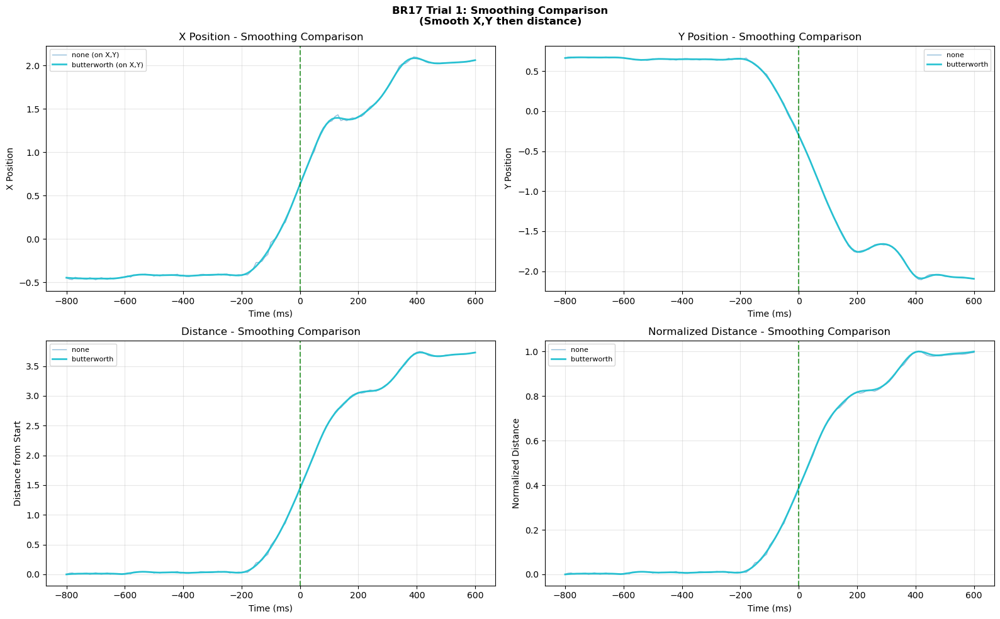

In [34]:
# Cell 11: Compare Smoothing Methods
"""
=== COMPARE SMOOTHING METHODS ===
Visualize how different smoothing approaches affect the traces
"""

# Compare multiple smoothing methods on a single trial
TRIAL_TO_PLOT = 1
SMOOTH_XY = True  # True: smooth X,Y first. False: smooth distance directly.

methods_to_compare = ['none', 'butterworth']# 'savgol'] #, 'gaussian', 'butterworth', 'median']

%matplotlib inline

fig = plot_smoothing_comparison(
    condition_data,
    trial_idx=TRIAL_TO_PLOT,
    methods_to_compare=methods_to_compare,
    smooth_xy=SMOOTH_XY
)

In [35]:
# Cell 12: Interactive Smoothing Exploration (FIXED)
"""
=== INTERACTIVE SMOOTHING EXPLORATION ===
Use sliders to explore different parameter values
"""

from IPython.display import display, clear_output

def smoothing_explorer_fixed(condition_data: dict):
    """Interactive smoothing explorer that works reliably in Jupyter."""
    
    # Create widgets
    method_dropdown = widgets.Dropdown(
        options=list(SMOOTHING_METHODS.keys()),
        value='savgol',
        description='Method:',
        style={'description_width': '80px'}
    )
    
    trial_slider = widgets.IntSlider(
        min=0,
        max=condition_data['n_trials'] - 1,
        value=0,
        description='Trial:',
        style={'description_width': '80px'}
    )
    
    smooth_xy_checkbox = widgets.Checkbox(
        value=True,
        description='Smooth X,Y (vs distance)',
        style={'description_width': 'initial'}
    )
    
    window_slider = widgets.FloatSlider(
        min=10, max=200, value=60, step=10,
        description='Window (ms):',
        style={'description_width': '100px'},
        layout=widgets.Layout(width='400px')
    )
    
    sigma_slider = widgets.FloatSlider(
        min=5, max=100, value=20, step=5,
        description='Sigma (ms):',
        style={'description_width': '100px'},
        layout=widgets.Layout(width='400px')
    )
    
    cutoff_slider = widgets.FloatSlider(
        min=1, max=50, value=10, step=1,
        description='Cutoff (Hz):',
        style={'description_width': '100px'},
        layout=widgets.Layout(width='400px')
    )
    
    # Output area for the plot
    output = widgets.Output()
    
    # Update button (more reliable than continuous updates)
    update_button = widgets.Button(
        description='Update Plot',
        button_style='primary',
        layout=widgets.Layout(width='150px')
    )
    
    def make_plot(button=None):
        """Generate the plot with current settings."""
        with output:
            clear_output(wait=True)
            
            method = method_dropdown.value
            trial = trial_slider.value
            smooth_xy = smooth_xy_checkbox.value
            window_ms = window_slider.value
            sigma_ms = sigma_slider.value
            cutoff_hz = cutoff_slider.value
            
            x = condition_data['x_all'][trial, :]
            y = condition_data['y_all'][trial, :]
            t_axis = condition_data['t_axis']
            
            dt = t_axis[1] - t_axis[0] if len(t_axis) > 1 else 10.0
            if dt < 0.9:
                dt *= 1000.0
            
            # Build params based on method
            if method == 'savgol':
                params = {'window_ms': window_ms, 'polyorder': 4}
                param_str = f"window={window_ms}ms, polyorder=4"
            elif method == 'gaussian':
                params = {'sigma_ms': sigma_ms}
                param_str = f"sigma={sigma_ms}ms"
            elif method in ['moving_average', 'median']:
                params = {'window_ms': window_ms}
                param_str = f"window={window_ms}ms"
            elif method == 'butterworth':
                params = {'cutoff_hz': cutoff_hz, 'order': 4}
                param_str = f"cutoff={cutoff_hz}Hz, order=4"
            elif method in ['exponential', 'double_exponential']:
                params = {'tau_ms': sigma_ms}
                param_str = f"tau={sigma_ms}ms"
            else:
                params = {}
                param_str = "none"
            
            # Process the trial
            result = process_single_trial(x, y, t_axis, method, params, smooth_xy)
            
            # Create the figure
            fig, axes = plt.subplots(2, 2, figsize=(14, 10))
            
            # Plot 1: X position
            ax1 = axes[0, 0]
            ax1.plot(t_axis, x, 'b-', alpha=0.4, linewidth=1, label='Raw X')
            ax1.plot(t_axis, result['x_smooth'], 'r-', linewidth=2, label='Smoothed X')
            ax1.axvline(0, color='green', linestyle='--', linewidth=2, alpha=0.7, label='t=0')
            ax1.set_xlabel('Time (ms)')
            ax1.set_ylabel('X Position')
            ax1.set_title('X Position')
            ax1.legend(loc='best')
            ax1.grid(True, alpha=0.3)
            
            # Plot 2: Y position
            ax2 = axes[0, 1]
            ax2.plot(t_axis, y, 'b-', alpha=0.4, linewidth=1, label='Raw Y')
            ax2.plot(t_axis, result['y_smooth'], 'r-', linewidth=2, label='Smoothed Y')
            ax2.axvline(0, color='green', linestyle='--', linewidth=2, alpha=0.7, label='t=0')
            ax2.set_xlabel('Time (ms)')
            ax2.set_ylabel('Y Position')
            ax2.set_title('Y Position')
            ax2.legend(loc='best')
            ax2.grid(True, alpha=0.3)
            
            # Plot 3: Distance
            ax3 = axes[1, 0]
            ax3.plot(t_axis, result['distance_raw'], 'b-', alpha=0.4, linewidth=1, label='Raw Distance')
            ax3.plot(t_axis, result['distance_smooth'], 'r-', linewidth=2, label='Smoothed Distance')
            ax3.axvline(0, color='green', linestyle='--', linewidth=2, alpha=0.7, label='t=0')
            ax3.set_xlabel('Time (ms)')
            ax3.set_ylabel('Distance from Start')
            ax3.set_title('Distance')
            ax3.legend(loc='best')
            ax3.grid(True, alpha=0.3)
            
            # Plot 4: Normalized Distance
            ax4 = axes[1, 1]
            dist_raw_norm, _ = normalize_trace(result['distance_raw'])
            dist_smooth_norm, _ = normalize_trace(result['distance_smooth'])
            ax4.plot(t_axis, dist_raw_norm, 'b-', alpha=0.4, linewidth=1, label='Raw (normalized)')
            ax4.plot(t_axis, dist_smooth_norm, 'r-', linewidth=2, label='Smoothed (normalized)')
            ax4.axvline(0, color='green', linestyle='--', linewidth=2, alpha=0.7, label='t=0')
            ax4.axhline(1.0, color='gray', linestyle=':', alpha=0.5)
            ax4.set_xlabel('Time (ms)')
            ax4.set_ylabel('Normalized Distance')
            ax4.set_title('Normalized Distance')
            ax4.legend(loc='best')
            ax4.grid(True, alpha=0.3)
            ax4.set_ylim(-0.1, 1.3)
            
            # Main title
            mode_str = "Smooth X,Y → Distance" if smooth_xy else "Distance → Smooth"
            br_idx = condition_data.get('br_idx', '?')
            fig.suptitle(f'BR{br_idx} | Trial {trial} | Method: {method} ({param_str})\n{mode_str}', 
                        fontsize=12, fontweight='bold')
            
            plt.tight_layout()
            plt.show()
            
            # Print info
            print(f"\n📊 Settings: method={method}, {param_str}, smooth_xy={smooth_xy}")
            print(f"📈 Raw distance range: {np.nanmin(result['distance_raw']):.2f} to {np.nanmax(result['distance_raw']):.2f}")
            print(f"📈 Smoothed distance range: {np.nanmin(result['distance_smooth']):.2f} to {np.nanmax(result['distance_smooth']):.2f}")
    
    # Connect button to function
    update_button.on_click(make_plot)
    
    # Also update on dropdown/slider change (optional - can be slow)
    # method_dropdown.observe(lambda change: make_plot(), names='value')
    
    # Layout
    controls = widgets.VBox([
        widgets.HTML("<h3>🔧 Smoothing Parameter Explorer</h3>"),
        widgets.HTML("<p><i>Adjust parameters and click 'Update Plot'</i></p>"),
        widgets.HBox([method_dropdown, trial_slider]),
        smooth_xy_checkbox,
        widgets.HTML("<b>Method-specific parameters:</b>"),
        widgets.HTML("<small>• savgol, moving_average, median: use <b>Window</b></small>"),
        widgets.HTML("<small>• gaussian, exponential, double_exp: use <b>Sigma/Tau</b></small>"),
        widgets.HTML("<small>• butterworth: use <b>Cutoff</b></small>"),
        window_slider,
        sigma_slider,
        cutoff_slider,
        update_button,
    ])
    
    # Display everything
    display(widgets.VBox([controls, output]))
    
    # Make initial plot
    make_plot()

# Launch the explorer
smoothing_explorer_fixed(condition_data)

In [36]:
# Cell 12b: Individual Trial Plateau Analysis
import numpy as np
import matplotlib.pyplot as plt

def analyze_trial_plateau(x, y, t_axis, smoothing_method='savgol', smoothing_params=None,
                          smooth_xy=True, plateau_params=None, use_y_for_plateau=True):
    """
    Analyze a single trial: smooth the data and detect plateau.
    """
    # === TIME AXIS FIX ===
    # Check if t_axis needs conversion (if values are too large, assume ms)
    if np.abs(t_axis).max() > 100:  # Probably in ms, convert to seconds
        t_axis = t_axis / 1000.0
        print(f"Note: Converted t_axis from ms to seconds")
    
    # Get smoothing function
    smooth_info = SMOOTHING_METHODS.get(smoothing_method, SMOOTHING_METHODS['savgol'])
    smooth_func = smooth_info['func']
    params = smoothing_params or smooth_info['params']
    
    dt = np.median(np.diff(t_axis))
    
    # Smooth the data
    if smooth_xy:
        x_smooth = smooth_func(x, dt, **params)
        y_smooth = smooth_func(y, dt, **params)
        dist_raw = np.sqrt((x - x[0])**2 + (y - y[0])**2)
        dist_smooth = np.sqrt((x_smooth - x_smooth[0])**2 + (y_smooth - y_smooth[0])**2)
    else:
        x_smooth = x.copy()
        y_smooth = y.copy()
        dist_raw = np.sqrt((x - x[0])**2 + (y - y[0])**2)
        dist_smooth = smooth_func(dist_raw, dt, **params)
    
    # Set plateau detection parameters
    p_params = plateau_params or PLATEAU_DETECTION_DEFAULTS.copy()
    
    # Detect plateau
    if use_y_for_plateau:
        plateau_result = PlateauDetectionMethods.stable_region_y(
            y_smooth, t_axis, **p_params
        )
        plateau_trace = y_smooth
        plateau_trace_label = 'Y position'
    else:
        plateau_result = PlateauDetectionMethods.stable_region_distance(
            dist_smooth, t_axis, **p_params
        )
        plateau_trace = dist_smooth
        plateau_trace_label = 'Distance'
    
    return {
        'x_raw': x,
        'y_raw': y,
        'x_smooth': x_smooth,
        'y_smooth': y_smooth,
        'dist_raw': dist_raw,
        'dist_smooth': dist_smooth,
        't_axis': t_axis,  # Return the (possibly corrected) t_axis
        'plateau_result': plateau_result,
        'plateau_trace': plateau_trace,
        'plateau_trace_label': plateau_trace_label,
        'smoothing_method': smoothing_method,
        'smoothing_params': params,
        'plateau_params': p_params
    }

def plot_trial_with_plateau(result, trial_idx=0, title_extra=''):
    """Plot a single trial with plateau detection highlighted."""
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    t = result['t_axis']
    pr = result['plateau_result']
    
    # Title
    plateau_info = f"Plateau: {pr['plateau_time']*1000:.1f}ms" if pr['plateau_idx'] is not None else "No plateau found"
    fig.suptitle(f"Trial {trial_idx} | {result['smoothing_method']} | {plateau_info} {title_extra}", fontsize=12)
    
    # Plot 1: X position
    ax = axes[0, 0]
    ax.plot(t * 1000, result['x_raw'], 'b-', alpha=0.3, label='Raw')
    ax.plot(t * 1000, result['x_smooth'], 'b-', linewidth=2, label='Smoothed')
    if pr['plateau_idx'] is not None:
        ax.axvline(pr['plateau_time'] * 1000, color='r', linestyle='--', linewidth=2, label='Plateau')
    ax.axvline(0, color='gray', linestyle=':', alpha=0.5)
    ax.set_xlabel('Time (ms)')
    ax.set_ylabel('X position')
    ax.legend(loc='upper right')
    ax.set_title('X Position')
    
    # Plot 2: Y position
    ax = axes[0, 1]
    ax.plot(t * 1000, result['y_raw'], 'g-', alpha=0.3, label='Raw')
    ax.plot(t * 1000, result['y_smooth'], 'g-', linewidth=2, label='Smoothed')
    if pr['plateau_idx'] is not None:
        ax.axvline(pr['plateau_time'] * 1000, color='r', linestyle='--', linewidth=2, label='Plateau')
        # Highlight stable region if available
        if 'stable_region' in pr and pr['stable_region'] is not None:
            stable = pr['stable_region']
            ax.fill_between(t * 1000, result['y_smooth'].min(), result['y_smooth'].max(),
                           where=stable, alpha=0.3, color='red', label='Stable region')
    ax.axvline(0, color='gray', linestyle=':', alpha=0.5)
    ax.set_xlabel('Time (ms)')
    ax.set_ylabel('Y position')
    ax.legend(loc='upper right')
    ax.set_title('Y Position (plateau detection trace)' if result['plateau_trace_label'] == 'Y position' else 'Y Position')
    
    # Plot 3: Distance from start
    ax = axes[1, 0]
    ax.plot(t * 1000, result['dist_raw'], 'k-', alpha=0.3, label='Raw')
    ax.plot(t * 1000, result['dist_smooth'], 'k-', linewidth=2, label='Smoothed')
    if pr['plateau_idx'] is not None:
        ax.axvline(pr['plateau_time'] * 1000, color='r', linestyle='--', linewidth=2, label='Plateau')
        if 'stable_region' in pr and pr['stable_region'] is not None and result['plateau_trace_label'] == 'Distance':
            stable = pr['stable_region']
            ax.fill_between(t * 1000, result['dist_smooth'].min(), result['dist_smooth'].max(),
                           where=stable, alpha=0.3, color='red', label='Stable region')
    ax.axvline(0, color='gray', linestyle=':', alpha=0.5)
    ax.set_xlabel('Time (ms)')
    ax.set_ylabel('Distance from start')
    ax.legend(loc='upper right')
    ax.set_title('Distance' + (' (plateau detection trace)' if result['plateau_trace_label'] == 'Distance' else ''))
    
    # Plot 4: X-Y trajectory
    ax = axes[1, 1]
    ax.plot(result['x_smooth'], result['y_smooth'], 'purple', linewidth=2, label='Trajectory')
    ax.plot(result['x_smooth'][0], result['y_smooth'][0], 'go', markersize=10, label='Start')
    if pr['plateau_idx'] is not None:
        ax.plot(result['x_smooth'][pr['plateau_idx']], result['y_smooth'][pr['plateau_idx']], 
                'r*', markersize=15, label=f"Plateau ({pr['plateau_time']*1000:.0f}ms)")
        # Show stable region on trajectory
        if 'stable_region' in pr and pr['stable_region'] is not None:
            stable = pr['stable_region']
            ax.plot(result['x_smooth'][stable], result['y_smooth'][stable], 
                   'r-', linewidth=4, alpha=0.5, label='Stable region')
    ax.set_xlabel('X position')
    ax.set_ylabel('Y position')
    ax.legend(loc='upper right')
    ax.set_title('X-Y Trajectory')
    ax.axis('equal')
    
    plt.tight_layout()
    return fig


def analyze_condition_plateaus(cond_data, smoothing_method='savgol', smoothing_params=None,
                                smooth_xy=True, plateau_params=None, use_y_for_plateau=True):
    """
    Analyze all trials in a condition and collect plateau times.
    
    Returns:
    --------
    dict with:
        - trial_results: list of individual trial results
        - plateau_times_ms: array of plateau times (NaN if not found)
        - plateau_values: array of plateau values
        - plateau_found: boolean array
        - summary_stats: dict with mean, median, std of plateau times
    """
    n_trials = cond_data['n_trials']
    
    trial_results = []
    plateau_times = []
    plateau_values = []
    plateau_found = []
    
    for i in range(n_trials):
        x = cond_data['x_all'][i]
        y = cond_data['y_all'][i]
        t = cond_data['t_axis']
        
        result = analyze_trial_plateau(
            x, y, t,
            smoothing_method=smoothing_method,
            smoothing_params=smoothing_params,
            smooth_xy=smooth_xy,
            plateau_params=plateau_params,
            use_y_for_plateau=use_y_for_plateau
        )
        
        trial_results.append(result)
        
        pr = result['plateau_result']
        if pr['plateau_idx'] is not None:
            plateau_times.append(pr['plateau_time'] * 1000)  # Convert to ms
            plateau_values.append(pr['plateau_value'])
            plateau_found.append(True)
        else:
            plateau_times.append(np.nan)
            plateau_values.append(np.nan)
            plateau_found.append(False)
    
    plateau_times = np.array(plateau_times)
    plateau_values = np.array(plateau_values)
    plateau_found = np.array(plateau_found)
    
    # Summary statistics (excluding NaN)
    valid_times = plateau_times[~np.isnan(plateau_times)]
    summary = {
        'mean_ms': np.mean(valid_times) if len(valid_times) > 0 else np.nan,
        'median_ms': np.median(valid_times) if len(valid_times) > 0 else np.nan,
        'std_ms': np.std(valid_times) if len(valid_times) > 0 else np.nan,
        'n_found': np.sum(plateau_found),
        'n_total': n_trials,
        'detection_rate': np.mean(plateau_found) * 100
    }
    
    return {
        'trial_results': trial_results,
        'plateau_times_ms': plateau_times,
        'plateau_values': plateau_values,
        'plateau_found': plateau_found,
        'summary_stats': summary,
        'condition_str': cond_data['cond_str']
    }


print("Individual trial plateau analysis functions loaded:")
print("  - analyze_trial_plateau(): Analyze single trial")
print("  - plot_trial_with_plateau(): Visualize single trial")
print("  - analyze_condition_plateaus(): Analyze all trials in condition")

Individual trial plateau analysis functions loaded:
  - analyze_trial_plateau(): Analyze single trial
  - plot_trial_with_plateau(): Visualize single trial
  - analyze_condition_plateaus(): Analyze all trials in condition


In [37]:
# Cell 13: Process Condition with Chosen Smoothing
"""
=== PROCESS CONDITION ===
Apply chosen smoothing to all trials
"""

# === CONFIGURE SMOOTHING ===
SMOOTHING_METHOD = 'butterworth'
SMOOTHING_PARAMS = {'cutoff_hz': 8.0, 'order': 4} # for butterworth
# SMOOTHING_PARAMS = {'sigma_ms': 20.0} # for gaussian
SMOOTH_XY = True  # True: smooth X,Y before computing distance

# Process all trials
processed_data = process_condition(
    condition_data,
    smoothing_method=SMOOTHING_METHOD,
    smoothing_params=SMOOTHING_PARAMS,
    smooth_xy=SMOOTH_XY,
    time_window=(-PRE_ZERO_MS, POST_ZERO_MS)
)

print(f"Processed {processed_data['n_valid']}/{processed_data['n_total']} valid trials")
print(f"Time window: {processed_data['aligned_time'].min():.1f} to {processed_data['aligned_time'].max():.1f} ms")

Processed 12/12 valid trials
Time window: -500.0 to 490.0 ms


In [38]:
# Cell 13b: Interactive Single-Trial Explorer with Configurable Multi-Signal Plateau Detection
import ipywidgets as widgets
from IPython.display import display, clear_output
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import numpy as np

# Output widget for all displays
explorer_output = widgets.Output()

# --- Helper functions ---
def get_trial_data(proc_data, trial_idx):
    """Extract X, Y, Distance for a single trial."""
    x_smooth = proc_data['x_smooth_all'][trial_idx]
    y_smooth = proc_data['y_smooth_all'][trial_idx]
    dist_smooth = proc_data['distance_smooth_all'][trial_idx]
    dist_raw = proc_data['distance_raw_all'][trial_idx]
    time_ms = proc_data['aligned_time']
    return x_smooth, y_smooth, dist_smooth, dist_raw, time_ms


def detect_plateau_multi(proc_data, trial_idx, min_dur, x_thresh, y_thresh, d_thresh,
                         use_x, use_y, use_dist, search_start, search_end):
    """Run multi-signal plateau detection on a single trial."""
    x_smooth, y_smooth, dist_smooth, _, time_ms = get_trial_data(proc_data, trial_idx)
    
    result = PlateauDetectionMethods.stable_region_multi(
        x_smooth, y_smooth, dist_smooth, time_ms,
        min_duration_ms=min_dur,
        x_max_change_pct=x_thresh,
        y_max_change_pct=y_thresh,
        dist_max_change_pct=d_thresh,
        use_x=use_x,
        use_y=use_y,
        use_dist=use_dist,
        search_start_ms=search_start if search_start != -500 else None,
        search_end_ms=search_end if search_end != 500 else None,
        return_stability_traces=True
    )
    return result


def plot_single_trial_multi(proc_data, trial_idx, plateau_result, show_stability=True):
    """
    Plot single trial with configurable panels based on which signals are used.
    """
    x_smooth, y_smooth, dist_smooth, dist_raw, time_ms = get_trial_data(proc_data, trial_idx)
    
    onset_ms = plateau_result.get('onset_ms')
    onset_idx = plateau_result.get('onset_idx')
    traces = plateau_result.get('stability_traces', {})
    
    use_x = traces.get('use_x', True)
    use_y = traces.get('use_y', False)
    use_dist = traces.get('use_dist', True)
    
    if show_stability:
        fig, axes = plt.subplots(2, 3, figsize=(14, 8))
    else:
        fig, axes = plt.subplots(2, 3, figsize=(14, 8))
    
    # --- Row 1: Signal traces ---
    # X position
    ax = axes[0, 0]
    color = 'blue' if use_x else 'gray'
    alpha = 1.0 if use_x else 0.4
    ax.plot(time_ms, x_smooth, color=color, lw=1.5, alpha=alpha, label='X (smoothed)')
    if onset_ms is not None:
        ax.axvline(onset_ms, color='red', ls='--', lw=2, label=f'Plateau @ {onset_ms:.1f}ms')
        ax.plot(onset_ms, plateau_result['x_value'], 'ro', ms=10)
    ax.axvline(0, color='gray', ls=':', alpha=0.5)
    ax.set_xlabel('Time (ms)')
    ax.set_ylabel('X position')
    title_suffix = " ✓" if use_x else " (not used)"
    ax.set_title(f'X Position{title_suffix}')
    ax.legend(loc='best', fontsize=8)
    ax.grid(True, alpha=0.3)
    
    # Y position
    ax = axes[0, 1]
    color = 'green' if use_y else 'gray'
    alpha = 1.0 if use_y else 0.4
    ax.plot(time_ms, y_smooth, color=color, lw=1.5, alpha=alpha, label='Y (smoothed)')
    if onset_ms is not None:
        ax.axvline(onset_ms, color='red', ls='--', lw=2)
        ax.plot(onset_ms, plateau_result['y_value'], 'ro', ms=10)
    ax.axvline(0, color='gray', ls=':', alpha=0.5)
    ax.set_xlabel('Time (ms)')
    ax.set_ylabel('Y position')
    title_suffix = " ✓" if use_y else " (not used)"
    ax.set_title(f'Y Position{title_suffix}')
    ax.legend(loc='best', fontsize=8)
    ax.grid(True, alpha=0.3)
    
    # Distance
    ax = axes[0, 2]
    color = 'purple' if use_dist else 'gray'
    alpha = 1.0 if use_dist else 0.4
    ax.plot(time_ms, dist_smooth, color=color, lw=1.5, alpha=alpha, label='Distance (smoothed)')
    ax.plot(time_ms, dist_raw, color=color, lw=0.5, alpha=0.2, label='Distance (raw)')
    if onset_ms is not None:
        ax.axvline(onset_ms, color='red', ls='--', lw=2)
        ax.plot(onset_ms, plateau_result['dist_value'], 'ro', ms=10)
    ax.axvline(0, color='gray', ls=':', alpha=0.5)
    ax.set_xlabel('Time (ms)')
    ax.set_ylabel('Distance')
    title_suffix = " ✓" if use_dist else " (not used)"
    ax.set_title(f'Distance{title_suffix}')
    ax.legend(loc='best', fontsize=8)
    ax.grid(True, alpha=0.3)
    
    # --- Row 2: Stability traces or trajectory ---
    if show_stability and traces:
        # X stability
        ax = axes[1, 0]
        color = 'blue' if use_x else 'gray'
        ax.plot(time_ms, traces['x_pct_change'], color=color, lw=1, alpha=0.7)
        if use_x:
            ax.axhline(x_thresh_slider.value, color='blue', ls='--', lw=1.5, 
                      label=f'Threshold ({x_thresh_slider.value}%)')
            ax.fill_between(time_ms, 0, 20, where=traces['x_stable'], 
                           alpha=0.2, color='blue', label='Stable')
        if onset_ms is not None:
            ax.axvline(onset_ms, color='red', ls='--', lw=2)
        ax.set_xlabel('Time (ms)')
        ax.set_ylabel('% Change')
        ax.set_title('X Stability' + (' ✓' if use_x else ' (not used)'))
        ax.legend(loc='best', fontsize=8)
        ax.grid(True, alpha=0.3)
        ax.set_ylim(0, min(20, np.nanpercentile(traces['x_pct_change'], 95) * 1.5 + 1))
        
        # Y stability
        ax = axes[1, 1]
        color = 'green' if use_y else 'gray'
        ax.plot(time_ms, traces['y_pct_change'], color=color, lw=1, alpha=0.7)
        if use_y:
            ax.axhline(y_thresh_slider.value, color='green', ls='--', lw=1.5,
                      label=f'Threshold ({y_thresh_slider.value}%)')
            ax.fill_between(time_ms, 0, 20, where=traces['y_stable'],
                           alpha=0.2, color='green', label='Stable')
        if onset_ms is not None:
            ax.axvline(onset_ms, color='red', ls='--', lw=2)
        ax.set_xlabel('Time (ms)')
        ax.set_ylabel('% Change')
        ax.set_title('Y Stability' + (' ✓' if use_y else ' (not used)'))
        ax.legend(loc='best', fontsize=8)
        ax.grid(True, alpha=0.3)
        ax.set_ylim(0, min(20, np.nanpercentile(traces['y_pct_change'], 95) * 1.5 + 1))
        
        # Distance stability + combined
        ax = axes[1, 2]
        color = 'purple' if use_dist else 'gray'
        ax.plot(time_ms, traces['d_pct_change'], color=color, lw=1, alpha=0.7, label='Dist % change')
        if use_dist:
            ax.axhline(d_thresh_slider.value, color='purple', ls='--', lw=1.5,
                      label=f'Threshold ({d_thresh_slider.value}%)')
        # Always show combined stable region
        ax.fill_between(time_ms, 0, 20, where=traces['combined_stable'],
                       alpha=0.3, color='red', label='COMBINED Stable')
        if onset_ms is not None:
            ax.axvline(onset_ms, color='red', ls='--', lw=2)
        ax.set_xlabel('Time (ms)')
        ax.set_ylabel('% Change')
        ax.set_title('Distance + Combined Stability')
        ax.legend(loc='best', fontsize=8)
        ax.grid(True, alpha=0.3)
        ax.set_ylim(0, min(20, np.nanpercentile(traces['d_pct_change'], 95) * 1.5 + 1))
    
    else:
        # X-Y trajectory
        for ax in axes[1, :]:
            ax.remove()
        ax_traj = fig.add_subplot(2, 1, 2)
        
        points = np.array([x_smooth, y_smooth]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        norm = plt.Normalize(time_ms.min(), time_ms.max())
        lc = LineCollection(segments, cmap='viridis', norm=norm, lw=2)
        lc.set_array(time_ms[:-1])
        ax_traj.add_collection(lc)
        ax_traj.autoscale()
        
        if onset_idx is not None:
            ax_traj.plot(plateau_result['x_value'], plateau_result['y_value'],
                        'ro', ms=12, label=f'Plateau @ {onset_ms:.1f}ms', zorder=5)
        
        cbar = plt.colorbar(lc, ax=ax_traj)
        cbar.set_label('Time (ms)')
        
        ax_traj.set_xlabel('X position')
        ax_traj.set_ylabel('Y position')
        ax_traj.set_title('X-Y Trajectory (time-colored)')
        ax_traj.legend(loc='best')
        ax_traj.grid(True, alpha=0.3)
    
    # Overall title
    signals_str = ' + '.join(plateau_result.get('signals_used', []))
    found_str = f"FOUND @ {onset_ms:.1f}ms" if plateau_result['found'] else "NOT FOUND"
    fig.suptitle(f"Trial {trial_idx + 1} - Plateau Detection ({signals_str}): {found_str}", 
                 fontsize=12, fontweight='bold')
    plt.tight_layout()
    return fig


def analyze_all_trials_multi(proc_data, min_dur, x_thresh, y_thresh, d_thresh,
                             use_x, use_y, use_dist, search_start, search_end):
    """Analyze all trials and return summary statistics."""
    n_trials = proc_data['n_valid']
    results = []
    onset_times = []
    
    for i in range(n_trials):
        result = detect_plateau_multi(proc_data, i, min_dur, x_thresh, y_thresh, d_thresh,
                                      use_x, use_y, use_dist, search_start, search_end)
        results.append(result)
        if result['found']:
            onset_times.append(result['onset_ms'])
    
    n_found = len(onset_times)
    
    summary = {
        'n_trials': n_trials,
        'n_found': n_found,
        'detection_rate': n_found / n_trials * 100 if n_trials > 0 else 0,
        'onset_times': np.array(onset_times),
        'mean_onset': np.mean(onset_times) if onset_times else None,
        'std_onset': np.std(onset_times) if onset_times else None,
        'median_onset': np.median(onset_times) if onset_times else None,
        'results': results,
        'signals_used': results[0].get('signals_used', []) if results else []
    }
    return summary


# --- Create widgets ---
trial_slider = widgets.IntSlider(
    value=0, min=0, max=max(0, processed_data['n_valid'] - 1),
    step=1, description='Trial:',
    layout=widgets.Layout(width='400px')
)

min_dur_slider = widgets.IntSlider(
    value=75, min=25, max=200, step=5,
    description='Min duration (ms):',
    layout=widgets.Layout(width='400px')
)

# Signal selection checkboxes
use_x_checkbox = widgets.Checkbox(value=True, description='Use X', 
                                   layout=widgets.Layout(width='100px'))
use_y_checkbox = widgets.Checkbox(value=False, description='Use Y',
                                   layout=widgets.Layout(width='100px'))
use_dist_checkbox = widgets.Checkbox(value=True, description='Use Distance',
                                      layout=widgets.Layout(width='150px'))

# Threshold sliders
x_thresh_slider = widgets.FloatSlider(
    value=4.0, min=0.5, max=15.0, step=0.5,
    description='X thresh (%):',
    layout=widgets.Layout(width='300px')
)

y_thresh_slider = widgets.FloatSlider(
    value=4.0, min=0.5, max=15.0, step=0.5,
    description='Y thresh (%):',
    layout=widgets.Layout(width='300px')
)

d_thresh_slider = widgets.FloatSlider(
    value=4.0, min=0.5, max=15.0, step=0.5,
    description='Dist thresh (%):',
    layout=widgets.Layout(width='300px')
)

search_start_slider = widgets.IntSlider(
    value=100, min=-500, max=400, step=10,
    description='Search start (ms):',
    layout=widgets.Layout(width='400px')
)

search_end_slider = widgets.IntSlider(
    value=500, min=0, max=500, step=10,
    description='Search end (ms):',
    layout=widgets.Layout(width='400px')
)

show_stability_checkbox = widgets.Checkbox(
    value=True, description='Show stability traces (vs trajectory)',
    layout=widgets.Layout(width='300px')
)

min_dur_slider = widgets.IntSlider(
    value=100, min=25, max=300, step=5,  # Changed default to 100
    description='Min duration (ms):',
    layout=widgets.Layout(width='400px')
)

update_button = widgets.Button(description='Update Plot', button_style='primary')
analyze_all_button = widgets.Button(description='Analyze All Trials', button_style='success')


# --- Button handlers ---
def on_update_click(b):
    with explorer_output:
        clear_output(wait=True)
        
        # Check at least one signal selected
        if not (use_x_checkbox.value or use_y_checkbox.value or use_dist_checkbox.value):
            print("⚠️ Error: Must select at least one signal (X, Y, or Distance)")
            return
        
        result = detect_plateau_multi(
            processed_data, trial_slider.value,
            min_dur_slider.value,
            x_thresh_slider.value, y_thresh_slider.value, d_thresh_slider.value,
            use_x_checkbox.value, use_y_checkbox.value, use_dist_checkbox.value,
            search_start_slider.value, search_end_slider.value
        )
        fig = plot_single_trial_multi(processed_data, trial_slider.value, result,
                                      show_stability=show_stability_checkbox.value)
        plt.show()
        
        # Print result summary
        signals_str = ' + '.join(result.get('signals_used', []))
        print(f"\nSignals used: {signals_str}")
        if result['found']:
            print(f"✓ Plateau detected at {result['onset_ms']:.1f} ms")
            print(f"  X = {result['x_value']:.2f}, Y = {result['y_value']:.2f}, Dist = {result['dist_value']:.2f}")
        else:
            print("✗ No plateau detected with current parameters")


def on_analyze_all_click(b):
    with explorer_output:
        clear_output(wait=True)
        
        # Check at least one signal selected
        if not (use_x_checkbox.value or use_y_checkbox.value or use_dist_checkbox.value):
            print("⚠️ Error: Must select at least one signal (X, Y, or Distance)")
            return
        
        print("Analyzing all trials...")
        summary = analyze_all_trials_multi(
            processed_data,
            min_dur_slider.value,
            x_thresh_slider.value, y_thresh_slider.value, d_thresh_slider.value,
            use_x_checkbox.value, use_y_checkbox.value, use_dist_checkbox.value,
            search_start_slider.value, search_end_slider.value
        )
        
        signals_str = ' + '.join(summary['signals_used'])
        print(f"\n{'='*50}")
        print(f"PLATEAU DETECTION SUMMARY")
        print(f"Signals: {signals_str}")
        print(f"{'='*50}")
        print(f"Trials analyzed: {summary['n_trials']}")
        print(f"Plateaus found:  {summary['n_found']} ({summary['detection_rate']:.1f}%)")
        
        if summary['n_found'] > 0:
            print(f"\nOnset time statistics:")
            print(f"  Mean:   {summary['mean_onset']:.1f} ms")
            print(f"  Std:    {summary['std_onset']:.1f} ms")
            print(f"  Median: {summary['median_onset']:.1f} ms")
            print(f"  Range:  [{summary['onset_times'].min():.1f}, {summary['onset_times'].max():.1f}] ms")
            
            # Histogram
            fig, axes = plt.subplots(1, 2, figsize=(12, 4))
            
            ax = axes[0]
            ax.hist(summary['onset_times'], bins=20, color='steelblue', edgecolor='black', alpha=0.7)
            ax.axvline(summary['mean_onset'], color='red', ls='--', lw=2, 
                      label=f'Mean: {summary["mean_onset"]:.1f}ms')
            ax.axvline(summary['median_onset'], color='orange', ls='--', lw=2,
                      label=f'Median: {summary["median_onset"]:.1f}ms')
            ax.axvline(0, color='gray', ls=':', alpha=0.5, label='Stim onset')
            ax.set_xlabel('Plateau Onset Time (ms)')
            ax.set_ylabel('Count')
            ax.set_title(f'Distribution of Plateau Onset Times ({signals_str})')
            ax.legend()
            ax.grid(True, alpha=0.3)
            
            # Trial-by-trial
            ax = axes[1]
            trial_indices = np.arange(summary['n_trials'])
            found_mask = np.array([r['found'] for r in summary['results']])
            onset_vals = np.array([r['onset_ms'] if r['found'] else np.nan for r in summary['results']])
            
            ax.scatter(trial_indices[found_mask], onset_vals[found_mask],
                      c='steelblue', s=30, label='Detected')
            ax.scatter(trial_indices[~found_mask], np.zeros(np.sum(~found_mask)),
                      c='red', marker='x', s=30, label='Not detected')
            ax.axhline(summary['mean_onset'], color='red', ls='--', alpha=0.5)
            ax.axhline(0, color='gray', ls=':', alpha=0.5)
            ax.set_xlabel('Trial Index')
            ax.set_ylabel('Plateau Onset (ms)')
            ax.set_title('Plateau Onset by Trial')
            ax.legend()
            ax.grid(True, alpha=0.3)
            
            plt.tight_layout()
            plt.show()
        else:
            print("\nNo plateaus detected. Try adjusting parameters:")
            print("  - Increase threshold percentages")
            print("  - Decrease minimum duration")
            print("  - Adjust search window")
            print("  - Try different signal combinations")


update_button.on_click(on_update_click)
analyze_all_button.on_click(on_analyze_all_click)

# --- Layout and display ---
signal_select_box = widgets.HBox([
    widgets.HTML("<b>Signals to use:</b> "),
    use_x_checkbox, use_y_checkbox, use_dist_checkbox
])

thresh_box = widgets.VBox([
    widgets.HTML("<b>Stability Thresholds:</b>"),
    widgets.HBox([x_thresh_slider, y_thresh_slider, d_thresh_slider])
])

param_box = widgets.VBox([
    widgets.HTML("<h3>Multi-Signal Plateau Detection Explorer</h3>"),
    widgets.HTML("<p><i>Select which signals must be simultaneously stable for plateau detection</i></p>"),
    trial_slider,
    signal_select_box,
    min_dur_slider,
    thresh_box,
    widgets.HTML("<b>Search Window:</b>"),
    widgets.HBox([search_start_slider, search_end_slider]),
    show_stability_checkbox,
    widgets.HBox([update_button, analyze_all_button])
])

display(param_box)
display(explorer_output)

# Initial plot
on_update_click(None)

Output()

In [39]:
# Cell 14: Batch Plateau Detection - All Trials
# Using: X + Distance, 2% threshold, 100ms min duration, search from 100ms to end

import numpy as np
import matplotlib.pyplot as plt

# ============================================
# DETECTION PARAMETERS (your preferred settings)
# ============================================
DETECTION_PARAMS = {
    'use_x': True,
    'use_y': False,
    'use_dist': True,
    'x_max_change_pct': 4,
    'y_max_change_pct': 4,  # not used
    'dist_max_change_pct': 2.0,
    'min_duration_ms': 100,
    'search_start_ms': 100,
    'search_end_ms': None,  # to the end
}

def detect_plateau_for_trial(proc_data, trial_idx, params=DETECTION_PARAMS):
    """Run plateau detection on a single trial with given parameters."""
    x_smooth = proc_data['x_smooth_all'][trial_idx]
    y_smooth = proc_data['y_smooth_all'][trial_idx]
    dist_smooth = proc_data['distance_smooth_all'][trial_idx]
    time_ms = proc_data['aligned_time']
    
    result = PlateauDetectionMethods.stable_region_multi(
        x_smooth, y_smooth, dist_smooth, time_ms,
        min_duration_ms=params['min_duration_ms'],
        x_max_change_pct=params['x_max_change_pct'],
        y_max_change_pct=params['y_max_change_pct'],
        dist_max_change_pct=params['dist_max_change_pct'],
        use_x=params['use_x'],
        use_y=params['use_y'],
        use_dist=params['use_dist'],
        search_start_ms=params['search_start_ms'],
        search_end_ms=params['search_end_ms'],
        return_stability_traces=True
    )
    return result


def run_batch_detection(proc_data, params=DETECTION_PARAMS):
    """Run plateau detection on all trials."""
    n_trials = proc_data['n_valid']
    
    results = []
    for i in range(n_trials):
        result = detect_plateau_for_trial(proc_data, i, params)
        result['trial_idx'] = i
        results.append(result)
    
    # Compile summary statistics
    onset_times = [r['onset_ms'] for r in results if r['found']]
    x_values = [r['x_value'] for r in results if r['found']]
    y_values = [r['y_value'] for r in results if r['found']]
    dist_values = [r['dist_value'] for r in results if r['found']]
    
    n_found = len(onset_times)
    
    summary = {
        'n_trials': n_trials,
        'n_found': n_found,
        'n_not_found': n_trials - n_found,
        'detection_rate': n_found / n_trials * 100 if n_trials > 0 else 0,
        'onset_times': np.array(onset_times),
        'x_values': np.array(x_values),
        'y_values': np.array(y_values),
        'dist_values': np.array(dist_values),
        'results': results,
        'params': params
    }
    
    if n_found > 0:
        summary['onset_mean'] = np.mean(onset_times)
        summary['onset_std'] = np.std(onset_times)
        summary['onset_median'] = np.median(onset_times)
        summary['x_mean'] = np.mean(x_values)
        summary['y_mean'] = np.mean(y_values)
        summary['dist_mean'] = np.mean(dist_values)
    
    return summary


# Run detection
print("Running batch plateau detection...")
print(f"Parameters:")
print(f"  Signals: X + Distance")
print(f"  Threshold: {DETECTION_PARAMS['x_max_change_pct']}%")
print(f"  Min duration: {DETECTION_PARAMS['min_duration_ms']}ms")
print(f"  Search window: {DETECTION_PARAMS['search_start_ms']}ms to end")
print()

plateau_summary = run_batch_detection(processed_data, DETECTION_PARAMS)

# Print summary
print(f"{'='*60}")
print(f"PLATEAU DETECTION RESULTS")
print(f"{'='*60}")
print(f"Trials analyzed:  {plateau_summary['n_trials']}")
print(f"Plateaus found:   {plateau_summary['n_found']} ({plateau_summary['detection_rate']:.1f}%)")
print(f"Not found:        {plateau_summary['n_not_found']}")

if plateau_summary['n_found'] > 0:
    print(f"\nPlateau Onset Time:")
    print(f"  Mean ± Std:  {plateau_summary['onset_mean']:.1f} ± {plateau_summary['onset_std']:.1f} ms")
    print(f"  Median:      {plateau_summary['onset_median']:.1f} ms")
    print(f"  Range:       [{plateau_summary['onset_times'].min():.1f}, {plateau_summary['onset_times'].max():.1f}] ms")
    
    print(f"\nPlateau Position (at onset):")
    print(f"  X:    {plateau_summary['x_mean']:.2f} ± {np.std(plateau_summary['x_values']):.2f}")
    print(f"  Y:    {plateau_summary['y_mean']:.2f} ± {np.std(plateau_summary['y_values']):.2f}")
    print(f"  Dist: {plateau_summary['dist_mean']:.2f} ± {np.std(plateau_summary['dist_values']):.2f}")
else:
    print("\n⚠️ No plateaus detected! Consider adjusting parameters:")
    print("  - Increase threshold percentage")
    print("  - Decrease minimum duration")
    print("  - Adjust search window")

Running batch plateau detection...
Parameters:
  Signals: X + Distance
  Threshold: 4%
  Min duration: 100ms
  Search window: 100ms to end

PLATEAU DETECTION RESULTS
Trials analyzed:  12
Plateaus found:   10 (83.3%)
Not found:        2

Plateau Onset Time:
  Mean ± Std:  339.0 ± 38.3 ms
  Median:      340.0 ms
  Range:       [260.0, 390.0] ms

Plateau Position (at onset):
  X:    2.08 ± 0.05
  Y:    -2.01 ± 0.02
  Dist: 3.62 ± 0.05


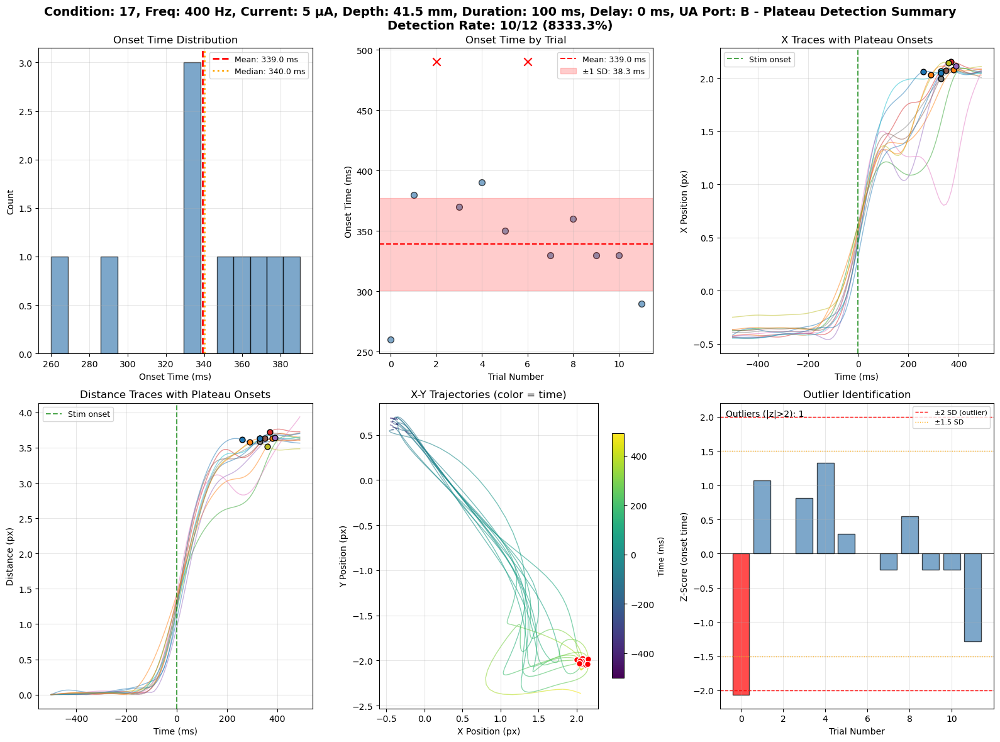

In [40]:
# Cell 15: Comprehensive Summary Visualization
# 6 panels: histogram, onset by trial, X traces, Distance traces, X-Y trajectories, outlier bar plot

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize

def plot_plateau_summary_comprehensive(processed_data, plateau_summary, figsize=(16, 12)):
    """
    Comprehensive 6-panel summary visualization.
    
    Panels:
    1. Onset time distribution (histogram)
    2. Onset time by trial number
    3. X position traces with plateau onsets
    4. Distance traces with plateau onsets
    5. Time-colored X-Y trajectories (all trials)
    6. Outlier identification bar plot
    """
    
    results = plateau_summary['results']
    onset_times = plateau_summary['onset_times']
    time = processed_data['aligned_time']
    
    fig, axes = plt.subplots(2, 3, figsize=figsize)
    fig.suptitle(f"{processed_data['cond_str']} - Plateau Detection Summary\n"
                 f"Detection Rate: {plateau_summary['n_found']}/{plateau_summary['n_trials']} "
                 f"({plateau_summary['detection_rate']:.1%})", fontsize=14, fontweight='bold')
    
    # Color setup
    cmap = plt.cm.tab10
    colors_by_trial = [cmap(i % 10) for i in range(len(results))]
    
    # === Panel 1: Onset Time Distribution ===
    ax1 = axes[0, 0]
    if len(onset_times) > 0:
        ax1.hist(onset_times, bins=15, edgecolor='black', alpha=0.7, color='steelblue')
        ax1.axvline(plateau_summary['onset_mean'], color='red', linestyle='--', 
                    linewidth=2, label=f"Mean: {plateau_summary['onset_mean']:.1f} ms")
        ax1.axvline(plateau_summary['onset_median'], color='orange', linestyle=':', 
                    linewidth=2, label=f"Median: {plateau_summary['onset_median']:.1f} ms")
        ax1.legend(fontsize=9)
    ax1.set_xlabel('Onset Time (ms)')
    ax1.set_ylabel('Count')
    ax1.set_title('Onset Time Distribution')
    
    # === Panel 2: Onset Time by Trial ===
    ax2 = axes[0, 1]
    trial_nums = []
    onset_vals = []
    for i, r in enumerate(results):
        if r['found']:
            trial_nums.append(i)
            onset_vals.append(r['onset_ms'])
    
    if len(trial_nums) > 0:
        ax2.scatter(trial_nums, onset_vals, c='steelblue', s=50, alpha=0.7, edgecolors='black')
        ax2.axhline(plateau_summary['onset_mean'], color='red', linestyle='--', 
                    linewidth=1.5, label=f"Mean: {plateau_summary['onset_mean']:.1f} ms")
        # Add ±1 SD band
        ax2.axhspan(plateau_summary['onset_mean'] - plateau_summary['onset_std'],
                    plateau_summary['onset_mean'] + plateau_summary['onset_std'],
                    alpha=0.2, color='red', label=f"±1 SD: {plateau_summary['onset_std']:.1f} ms")
        ax2.legend(fontsize=9)
    
    # Mark trials with no detection
    no_detect = [i for i, r in enumerate(results) if not r['found']]
    if no_detect:
        ax2.scatter(no_detect, [time[-1]] * len(no_detect), c='red', marker='x', 
                    s=80, label='No detection', zorder=5)
    
    ax2.set_xlabel('Trial Number')
    ax2.set_ylabel('Onset Time (ms)')
    ax2.set_title('Onset Time by Trial')
    ax2.set_xlim(-0.5, len(results) - 0.5)
    
    # === Panel 3: X Position Traces ===
    ax3 = axes[0, 2]
    x_data = processed_data['x_smooth_all']
    for i in range(x_data.shape[0]):
        ax3.plot(time, x_data[i], alpha=0.5, linewidth=1, color=colors_by_trial[i])
        if results[i]['found']:
            onset_idx = np.argmin(np.abs(time - results[i]['onset_ms']))
            ax3.scatter(results[i]['onset_ms'], x_data[i, onset_idx], 
                       color=colors_by_trial[i], s=40, edgecolors='black', zorder=5)
    
    ax3.axvline(0, color='green', linestyle='--', linewidth=1.5, alpha=0.7, label='Stim onset')
    ax3.set_xlabel('Time (ms)')
    ax3.set_ylabel('X Position (px)')
    ax3.set_title('X Traces with Plateau Onsets')
    ax3.legend(fontsize=9)
    
    # === Panel 4: Distance Traces ===
    ax4 = axes[1, 0]
    dist_data = processed_data['distance_smooth_all']
    for i in range(dist_data.shape[0]):
        ax4.plot(time, dist_data[i], alpha=0.5, linewidth=1, color=colors_by_trial[i])
        if results[i]['found']:
            onset_idx = np.argmin(np.abs(time - results[i]['onset_ms']))
            ax4.scatter(results[i]['onset_ms'], dist_data[i, onset_idx], 
                       color=colors_by_trial[i], s=40, edgecolors='black', zorder=5)
    
    ax4.axvline(0, color='green', linestyle='--', linewidth=1.5, alpha=0.7, label='Stim onset')
    ax4.set_xlabel('Time (ms)')
    ax4.set_ylabel('Distance (px)')
    ax4.set_title('Distance Traces with Plateau Onsets')
    ax4.legend(fontsize=9)
    
    # === Panel 5: Time-Colored X-Y Trajectories ===
    ax5 = axes[1, 1]
    x_data = processed_data['x_smooth_all']
    y_data = processed_data['y_smooth_all']
    norm = Normalize(vmin=time.min(), vmax=time.max())
    
    for i in range(x_data.shape[0]):
        x = x_data[i]
        y = y_data[i]
        
        # Create line segments
        points = np.array([x, y]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        
        lc = LineCollection(segments, cmap='viridis', norm=norm, alpha=0.6, linewidth=1)
        lc.set_array(time[:-1])
        ax5.add_collection(lc)
        
        # Mark plateau onset
        if results[i]['found']:
            onset_idx = np.argmin(np.abs(time - results[i]['onset_ms']))
            ax5.scatter(x[onset_idx], y[onset_idx], color='red', s=50, 
                       edgecolors='white', zorder=5, linewidth=1)
    
    ax5.autoscale()
    ax5.set_xlabel('X Position (px)')
    ax5.set_ylabel('Y Position (px)')
    ax5.set_title('X-Y Trajectories (color = time)')
    
    # Add colorbar
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax5, shrink=0.8)
    cbar.set_label('Time (ms)', fontsize=9)
    
    # === Panel 6: Outlier Identification ===
    ax6 = axes[1, 2]
    
    if len(onset_times) > 1:
        mean_onset = plateau_summary['onset_mean']
        std_onset = plateau_summary['onset_std']
        
        # Calculate z-scores for each trial
        z_scores = []
        bar_colors = []
        for i, r in enumerate(results):
            if r['found']:
                z = (r['onset_ms'] - mean_onset) / std_onset if std_onset > 0 else 0
                z_scores.append(z)
                # Color by outlier status
                if abs(z) > 2:
                    bar_colors.append('red')
                elif abs(z) > 1.5:
                    bar_colors.append('orange')
                else:
                    bar_colors.append('steelblue')
            else:
                z_scores.append(np.nan)
                bar_colors.append('gray')
        
        # Bar plot
        trial_indices = np.arange(len(results))
        bars = ax6.bar(trial_indices, z_scores, color=bar_colors, edgecolor='black', alpha=0.7)
        
        # Threshold lines
        ax6.axhline(2, color='red', linestyle='--', linewidth=1, label='±2 SD (outlier)')
        ax6.axhline(-2, color='red', linestyle='--', linewidth=1)
        ax6.axhline(1.5, color='orange', linestyle=':', linewidth=1, label='±1.5 SD')
        ax6.axhline(-1.5, color='orange', linestyle=':', linewidth=1)
        ax6.axhline(0, color='black', linestyle='-', linewidth=0.5)
        
        ax6.set_xlabel('Trial Number')
        ax6.set_ylabel('Z-Score (onset time)')
        ax6.set_title('Outlier Identification')
        ax6.legend(fontsize=8, loc='upper right')
        
        # Count outliers
        n_outliers = sum(1 for z in z_scores if not np.isnan(z) and abs(z) > 2)
        ax6.text(0.02, 0.98, f"Outliers (|z|>2): {n_outliers}", transform=ax6.transAxes,
                fontsize=10, verticalalignment='top')
    else:
        ax6.text(0.5, 0.5, 'Insufficient data\nfor outlier analysis', 
                ha='center', va='center', fontsize=12, transform=ax6.transAxes)
        ax6.set_title('Outlier Identification')
    
    plt.tight_layout()
    plt.show()
    
    return fig

# Run the comprehensive summary
fig_summary = plot_plateau_summary_comprehensive(processed_data, plateau_summary)

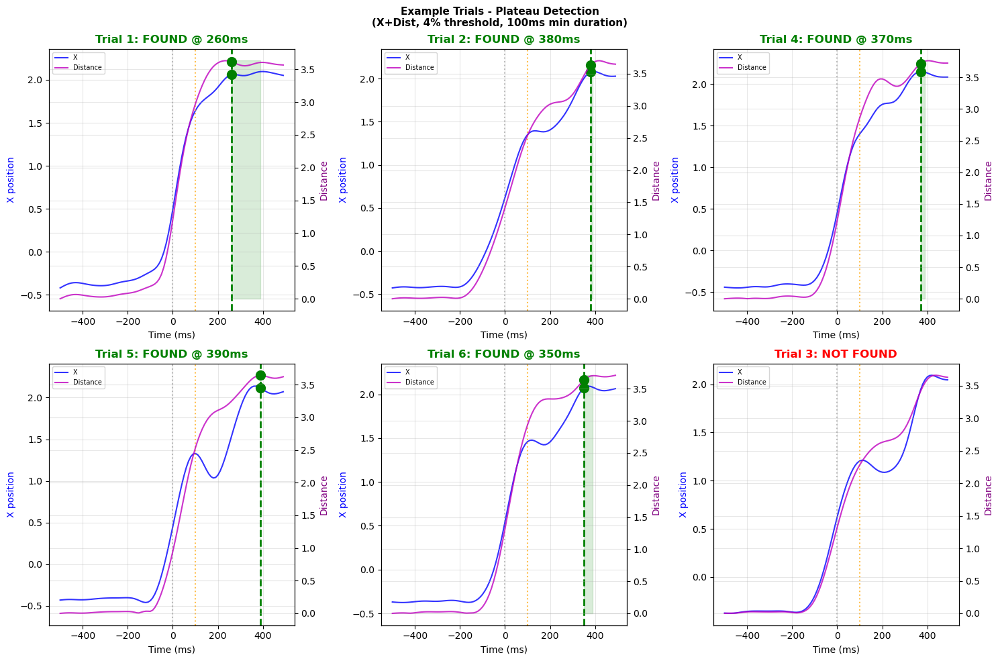

In [41]:
# Cell 16: Plot Example Trials (showing detection details)

def plot_example_trials(summary, proc_data, n_examples=6):
    """Plot example trials showing stability traces and detection results."""
    
    time_ms = proc_data['aligned_time']
    results = summary['results']
    params = summary['params']
    
    # Get indices of found and not-found trials
    found_indices = [i for i, r in enumerate(results) if r['found']]
    not_found_indices = [i for i, r in enumerate(results) if not r['found']]
    
    # Select examples (prioritize showing both found and not-found)
    n_found_show = min(n_examples - 1, len(found_indices))
    n_not_found_show = min(2, len(not_found_indices), n_examples - n_found_show)
    n_found_show = min(n_examples - n_not_found_show, len(found_indices))
    
    example_indices = found_indices[:n_found_show] + not_found_indices[:n_not_found_show]
    n_total = len(example_indices)
    
    if n_total == 0:
        print("No trials to plot!")
        return None
    
    n_cols = min(3, n_total)
    n_rows = int(np.ceil(n_total / n_cols))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 5*n_rows))
    if n_total == 1:
        axes = np.array([[axes]])
    elif n_rows == 1:
        axes = axes.reshape(1, -1)
    elif n_cols == 1:
        axes = axes.reshape(-1, 1)
    
    for plot_idx, trial_idx in enumerate(example_indices):
        row = plot_idx // n_cols
        col = plot_idx % n_cols
        ax = axes[row, col]
        
        r = results[trial_idx]
        traces = r.get('stability_traces', {})
        
        x_smooth = proc_data['x_smooth_all'][trial_idx]
        dist_smooth = proc_data['distance_smooth_all'][trial_idx]
        
        # Create twin axis for distance
        ax2 = ax.twinx()
        
        # Plot X and Distance
        ln1 = ax.plot(time_ms, x_smooth, 'b-', lw=1.5, alpha=0.8, label='X')
        ln2 = ax2.plot(time_ms, dist_smooth, 'm-', lw=1.5, alpha=0.8, label='Distance')
        
        # Mark plateau onset
        if r['found']:
            ax.axvline(r['onset_ms'], color='green', ls='--', lw=2, label=f'Onset: {r["onset_ms"]:.0f}ms')
            ax.plot(r['onset_ms'], r['x_value'], 'go', ms=10, zorder=5)
            ax2.plot(r['onset_ms'], r['dist_value'], 'go', ms=10, zorder=5)
            title_str = f'Trial {trial_idx+1}: FOUND @ {r["onset_ms"]:.0f}ms'
            title_color = 'green'
        else:
            title_str = f'Trial {trial_idx+1}: NOT FOUND'
            title_color = 'red'
        
        # Mark search window
        ax.axvline(0, color='gray', ls=':', alpha=0.5)
        ax.axvline(params['search_start_ms'], color='orange', ls=':', alpha=0.7, label='Search start')
        
        # Shade combined stable regions if available
        if 'combined_stable' in traces:
            combined = traces['combined_stable']
            # Only shade within search range
            search_start_idx = np.searchsorted(time_ms, params['search_start_ms'])
            shade_mask = np.zeros_like(combined)
            shade_mask[search_start_idx:] = combined[search_start_idx:]
            ax.fill_between(time_ms, ax.get_ylim()[0], ax.get_ylim()[1], 
                           where=shade_mask, alpha=0.15, color='green', label='Stable region')
        
        ax.set_xlabel('Time (ms)')
        ax.set_ylabel('X position', color='blue')
        ax2.set_ylabel('Distance', color='purple')
        ax.set_title(title_str, color=title_color, fontweight='bold')
        ax.grid(True, alpha=0.3)
        
        # Combined legend
        lns = ln1 + ln2
        labs = [l.get_label() for l in lns]
        ax.legend(lns, labs, loc='best', fontsize=7)
    
    # Hide unused axes
    for plot_idx in range(n_total, n_rows * n_cols):
        row = plot_idx // n_cols
        col = plot_idx % n_cols
        axes[row, col].set_visible(False)
    
    plt.suptitle(f'Example Trials - Plateau Detection\n'
                 f'(X+Dist, {params["x_max_change_pct"]}% threshold, {params["min_duration_ms"]}ms min duration)',
                 fontsize=11, fontweight='bold')
    plt.tight_layout()
    return fig


fig_examples = plot_example_trials(plateau_summary, processed_data, n_examples=6)
if fig_examples:
    plt.show()

In [42]:
# Cell 17: Export Plateau Detection Results to DataFrame

import pandas as pd

def create_plateau_dataframe(summary):
    """Create DataFrame with plateau detection results for all trials."""
    
    rows = []
    for r in summary['results']:
        row = {
            'trial_idx': r['trial_idx'],
            'plateau_found': r['found'],
            'onset_ms': r['onset_ms'],
            'x_at_onset': r['x_value'],
            'y_at_onset': r['y_value'],
            'dist_at_onset': r['dist_value'],
            'signals_used': '+'.join(r.get('signals_used', []))
        }
        rows.append(row)
    
    df = pd.DataFrame(rows)
    return df


# Create DataFrame
plateau_df = create_plateau_dataframe(plateau_summary)

# Display
print("Plateau Detection Results:")
print("="*70)
print(plateau_df.to_string(index=False))
print()

# Summary by detection status
print("\nSummary:")
print(f"  Found:     {plateau_df['plateau_found'].sum()}")
print(f"  Not Found: {(~plateau_df['plateau_found']).sum()}")

if plateau_df['plateau_found'].any():
    found_df = plateau_df[plateau_df['plateau_found']]
    print(f"\n  Onset time: {found_df['onset_ms'].mean():.1f} ± {found_df['onset_ms'].std():.1f} ms")
    print(f"  X position: {found_df['x_at_onset'].mean():.2f} ± {found_df['x_at_onset'].std():.2f}")
    print(f"  Distance:   {found_df['dist_at_onset'].mean():.2f} ± {found_df['dist_at_onset'].std():.2f}")

# Optionally save
# plateau_df.to_csv('plateau_detection_results.csv', index=False)
# print("\n✓ Saved to plateau_detection_results.csv")

Plateau Detection Results:
 trial_idx  plateau_found  onset_ms  x_at_onset  y_at_onset  dist_at_onset signals_used
         0           True     260.0    2.060061   -2.042348       3.614385       X+Dist
         1           True     380.0    2.075945   -1.976221       3.632140       X+Dist
         2          False       NaN         NaN         NaN            NaN       X+Dist
         3           True     370.0    2.151871   -1.982969       3.719501       X+Dist
         4           True     390.0    2.114277   -2.046255       3.642362       X+Dist
         5           True     350.0    2.073665   -2.002634       3.634832       X+Dist
         6          False       NaN         NaN         NaN            NaN       X+Dist
         7           True     330.0    1.997008   -1.990724       3.584827       X+Dist
         8           True     360.0    2.139978   -2.042798       3.520223       X+Dist
         9           True     330.0    2.068482   -2.006030       3.628993       X+Dist
     

Running parameter sweep...

Detection Rate (%) by Threshold and Min Duration:
min_duration_ms   75    90    100   115   125
threshold_pct                                
1.5              75.0  58.3  50.0  33.3  25.0
2.0              91.7  58.3  58.3  50.0  33.3
2.5              91.7  75.0  58.3  58.3  50.0
3.0              91.7  91.7  83.3  66.7  58.3
4.0              91.7  91.7  91.7  75.0  75.0
5.0              91.7  91.7  91.7  91.7  83.3

✓ Best detection rate: 91.7%
  Threshold: 2.0%
  Min duration: 75.0ms
  Trials found: 11


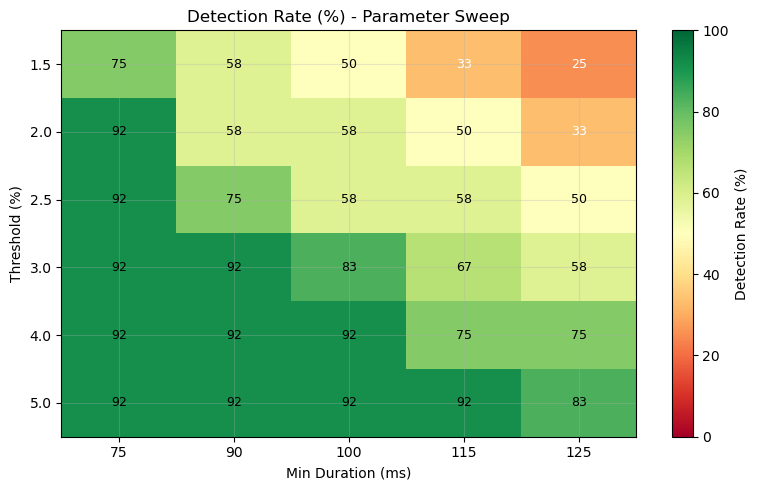

In [43]:
# Cell 18: Parameter Sweep - Find optimal detection parameters

def parameter_sweep(proc_data, thresh_values=[1.5, 2.0, 2.5, 3.0, 4.0, 5.0],
                    min_dur_values=[75, 90, 100, 115, 125]):
    """Sweep through parameter combinations to find optimal detection rate."""
    
    results = []
    
    for thresh in thresh_values:
        for min_dur in min_dur_values:
            params = {
                'use_x': True,
                'use_y': False,
                'use_dist': True,
                'x_max_change_pct': thresh,
                'y_max_change_pct': thresh,
                'dist_max_change_pct': thresh,
                'min_duration_ms': min_dur,
                'search_start_ms': 100,
                'search_end_ms': None,
            }
            
            summary = run_batch_detection(proc_data, params)
            
            results.append({
                'threshold_pct': thresh,
                'min_duration_ms': min_dur,
                'n_found': summary['n_found'],
                'detection_rate': summary['detection_rate'],
                'mean_onset': summary.get('onset_mean', np.nan),
                'std_onset': summary.get('onset_std', np.nan)
            })
    
    return pd.DataFrame(results)


print("Running parameter sweep...")
sweep_df = parameter_sweep(processed_data)

# Display as pivot table
print("\nDetection Rate (%) by Threshold and Min Duration:")
print("="*60)
pivot = sweep_df.pivot(index='threshold_pct', columns='min_duration_ms', values='detection_rate')
print(pivot.round(1).to_string())

# Find best parameters
best_idx = sweep_df['detection_rate'].idxmax()
best = sweep_df.loc[best_idx]
print(f"\n✓ Best detection rate: {best['detection_rate']:.1f}%")
print(f"  Threshold: {best['threshold_pct']}%")
print(f"  Min duration: {best['min_duration_ms']}ms")
print(f"  Trials found: {int(best['n_found'])}")

# Plot heatmap
fig, ax = plt.subplots(figsize=(8, 5))
im = ax.imshow(pivot.values, cmap='RdYlGn', aspect='auto', vmin=0, vmax=100)
ax.set_xticks(range(len(pivot.columns)))
ax.set_xticklabels(pivot.columns)
ax.set_yticks(range(len(pivot.index)))
ax.set_yticklabels(pivot.index)
ax.set_xlabel('Min Duration (ms)')
ax.set_ylabel('Threshold (%)')
ax.set_title('Detection Rate (%) - Parameter Sweep')
plt.colorbar(im, ax=ax, label='Detection Rate (%)')

# Annotate cells
for i in range(len(pivot.index)):
    for j in range(len(pivot.columns)):
        val = pivot.values[i, j]
        color = 'white' if val < 50 else 'black'
        ax.text(j, i, f'{val:.0f}', ha='center', va='center', color=color, fontsize=9)

plt.tight_layout()
plt.show()

LOADING ALL CONDITIONS
PERI_ROOT: \\cullenstor.win.ad.jhu.edu\data\Current Project Databases - NHP\2025 Cerebellum prosthesis\Nike\20260311_NRR_RW022\results\checkpoints\PeriStim
Camera: cam1, Keypoint: middle
Control BR indices: [1]

  Loaded: Condition: 1, Freq: 2 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: cont ms, Delay: 0 ms, UA Port: B_TargetA (17 trials)
  Loaded: Condition: 18, Freq: n/a Hz, Current: n/a µA, Depth: 41.5 mm, Duration: n/a ms, Delay: 0 ms, UA Port: B_TargetA (10 trials)
  Loaded: Condition: 26, Freq: n/a Hz, Current: n/a µA, Depth: 41.5 mm, Duration: n/a ms, Delay: 0 ms, UA Port: B_TargetA (14 trials)
  Loaded: Condition: 11, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 2.5 ms, Delay: 0 ms, UA Port: B_TargetA (10 trials)
  Loaded: Condition: 12, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 5 ms, Delay: 0 ms, UA Port: B_TargetA (10 trials)
  Loaded: Condition: 14, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 10 ms, Delay: 0 ms, UA Po

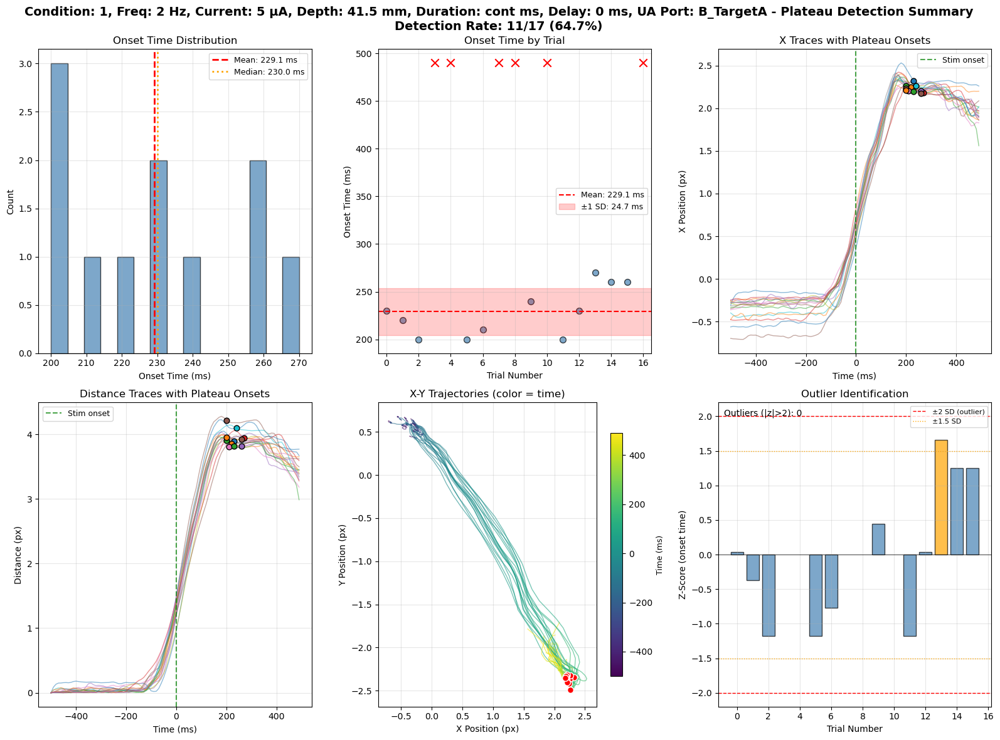


Processing 2/31: Condition: 18, Freq: n/a Hz, Current: n/a µA, Depth: 41.5 mm, Duration: n/a ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 10
  Plateaus found: 8/10 (80.0%)
  Mean onset: 222.5 ± 43.5 ms


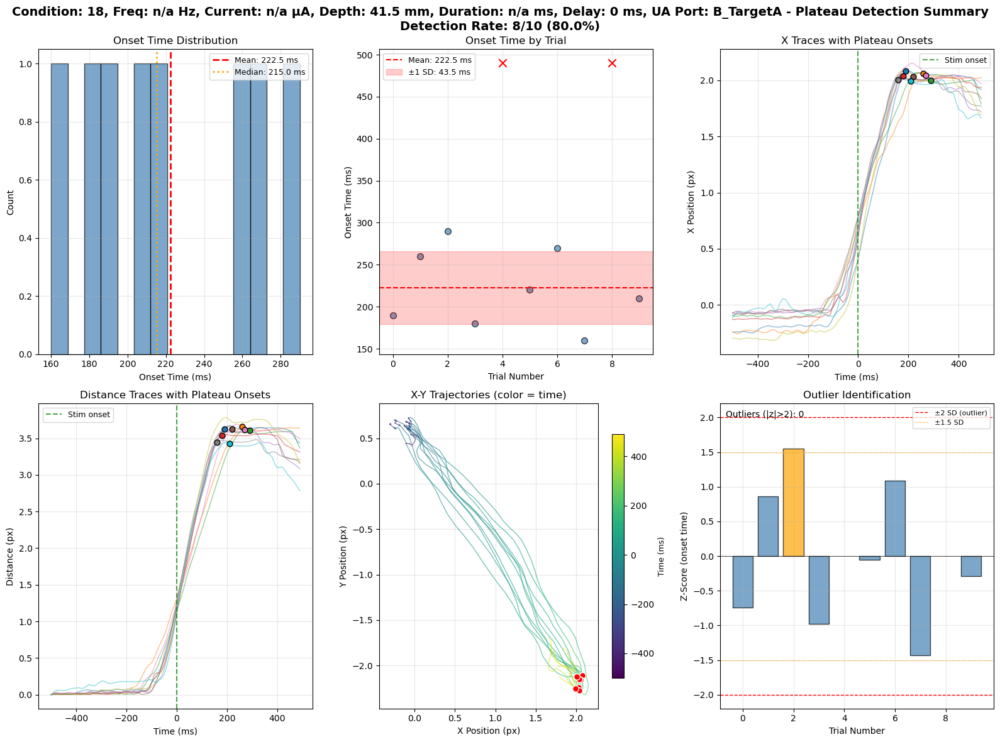


Processing 3/31: Condition: 26, Freq: n/a Hz, Current: n/a µA, Depth: 41.5 mm, Duration: n/a ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 14
  Plateaus found: 13/14 (92.9%)
  Mean onset: 230.8 ± 27.3 ms


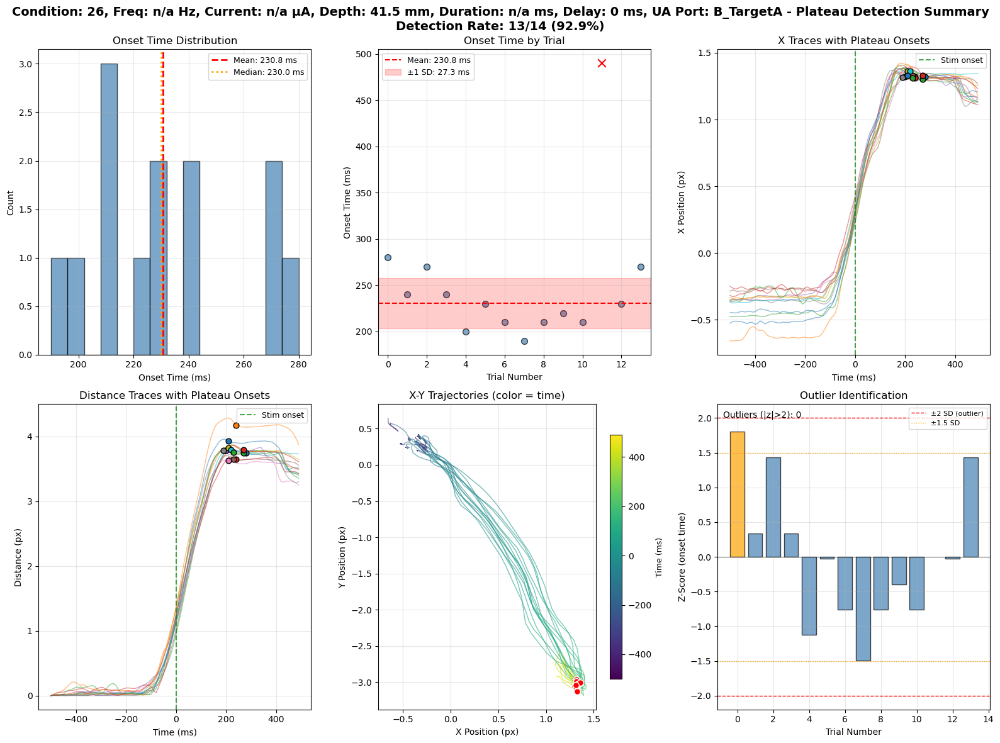


Processing 4/31: Condition: 11, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 2.5 ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 10
  Plateaus found: 9/10 (90.0%)
  Mean onset: 224.4 ± 35.6 ms


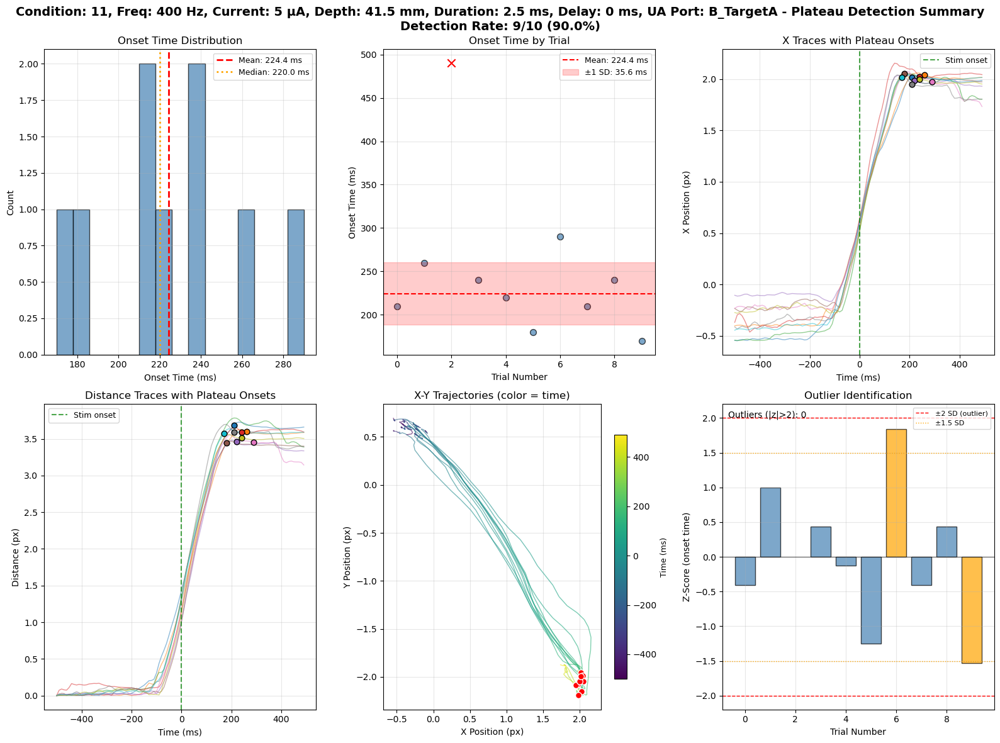


Processing 5/31: Condition: 12, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 5 ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 10
  Plateaus found: 10/10 (100.0%)
  Mean onset: 200.0 ± 27.6 ms


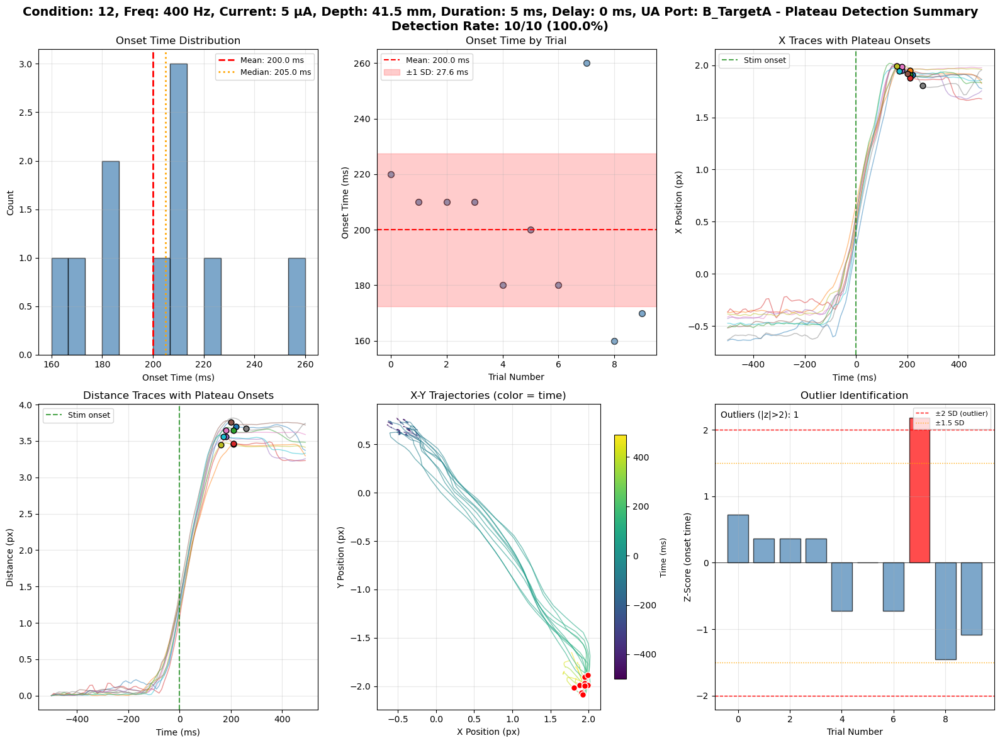


Processing 6/31: Condition: 14, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 10 ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 11
  Plateaus found: 11/11 (100.0%)
  Mean onset: 202.7 ± 25.3 ms


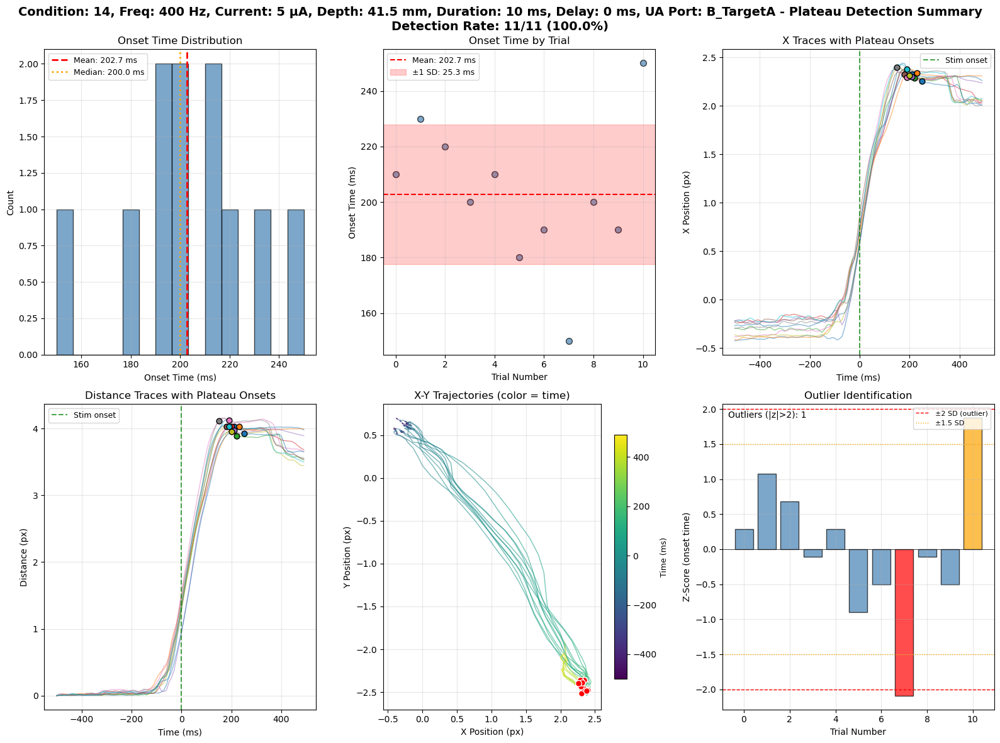


Processing 7/31: Condition: 15, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 9
  Plateaus found: 8/9 (88.9%)
  Mean onset: 220.0 ± 25.5 ms


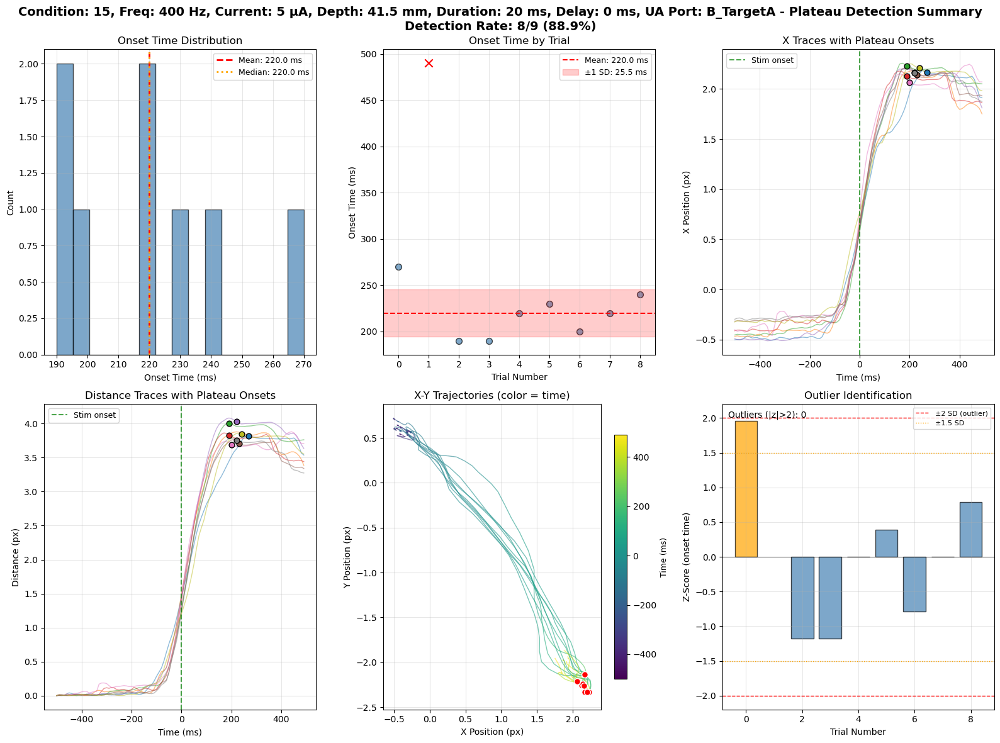


Processing 8/31: Condition: 16, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 50 ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 11
  Plateaus found: 11/11 (100.0%)
  Mean onset: 289.1 ± 27.5 ms


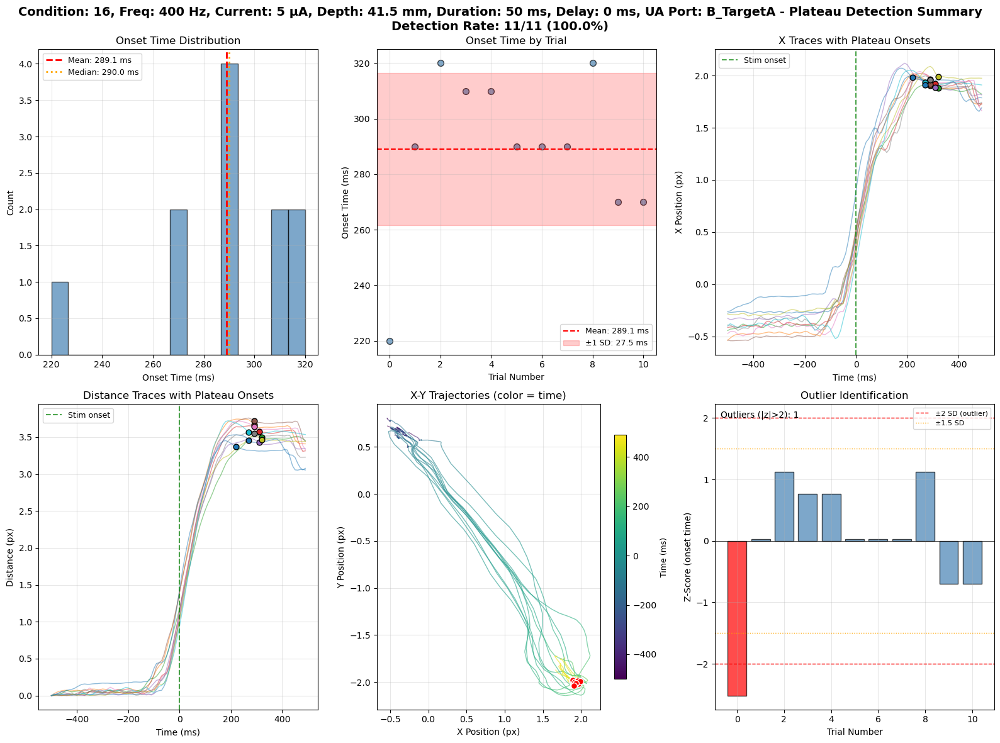


Processing 9/31: Condition: 17, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 100 ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 12
  Plateaus found: 7/12 (58.3%)
  Mean onset: 358.6 ± 17.3 ms


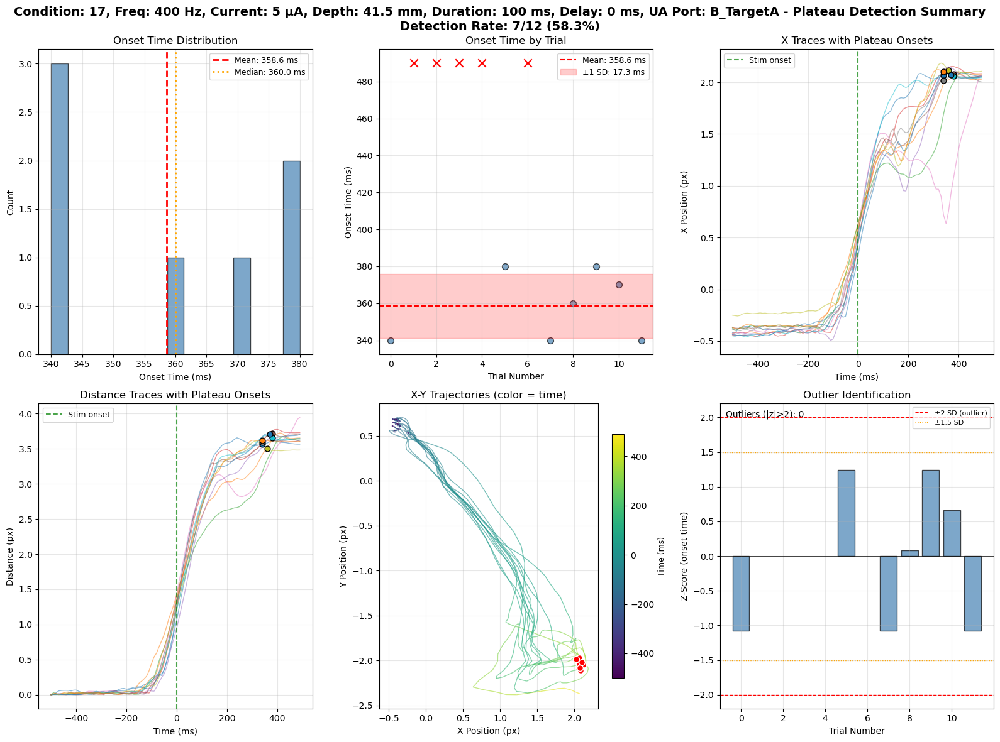


Processing 10/31: Condition: 19, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 6
  Plateaus found: 4/6 (66.7%)
  Mean onset: 282.5 ± 43.2 ms


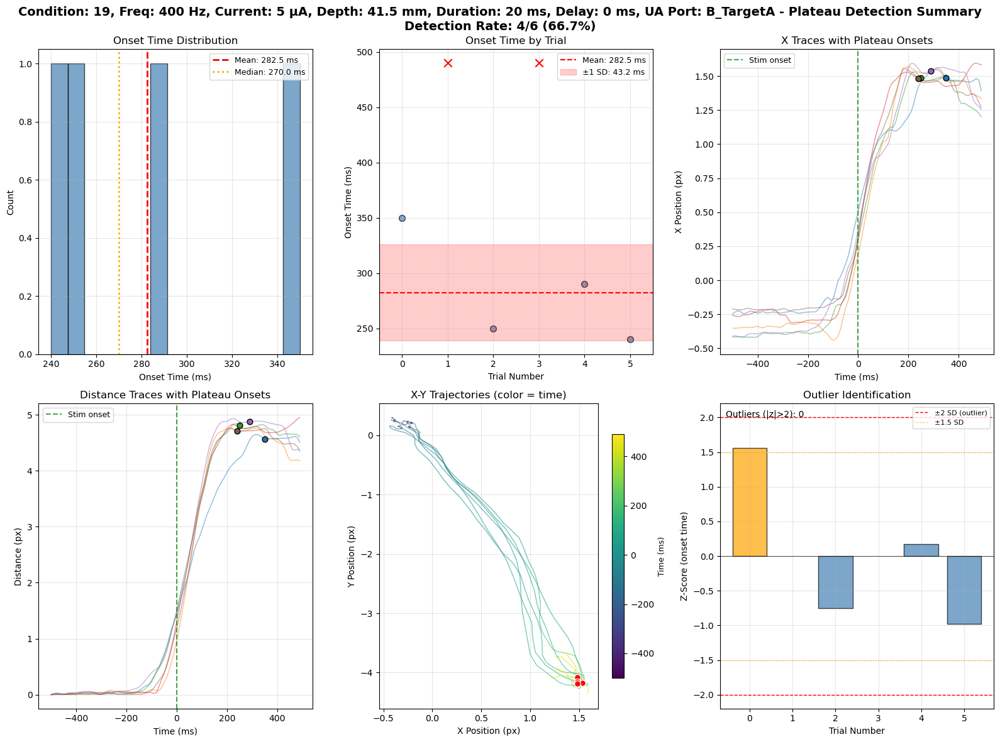


Processing 11/31: Condition: 20, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 9
  Plateaus found: 8/9 (88.9%)
  Mean onset: 217.5 ± 26.8 ms


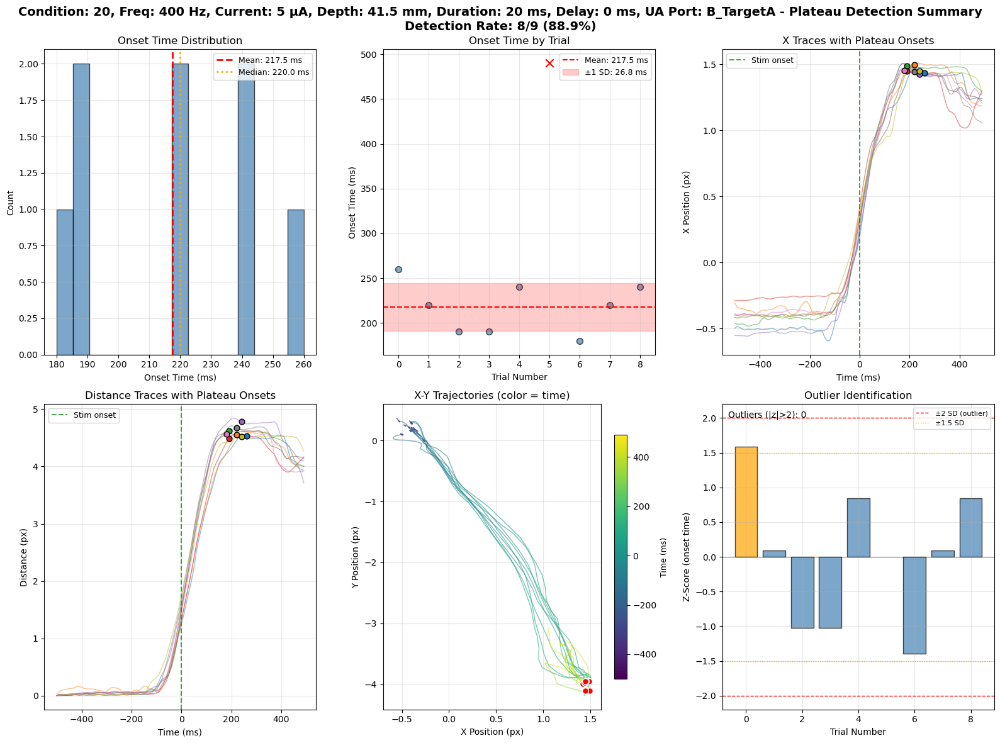


Processing 12/31: Condition: 21, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 8
  Plateaus found: 6/8 (75.0%)
  Mean onset: 231.7 ± 21.1 ms


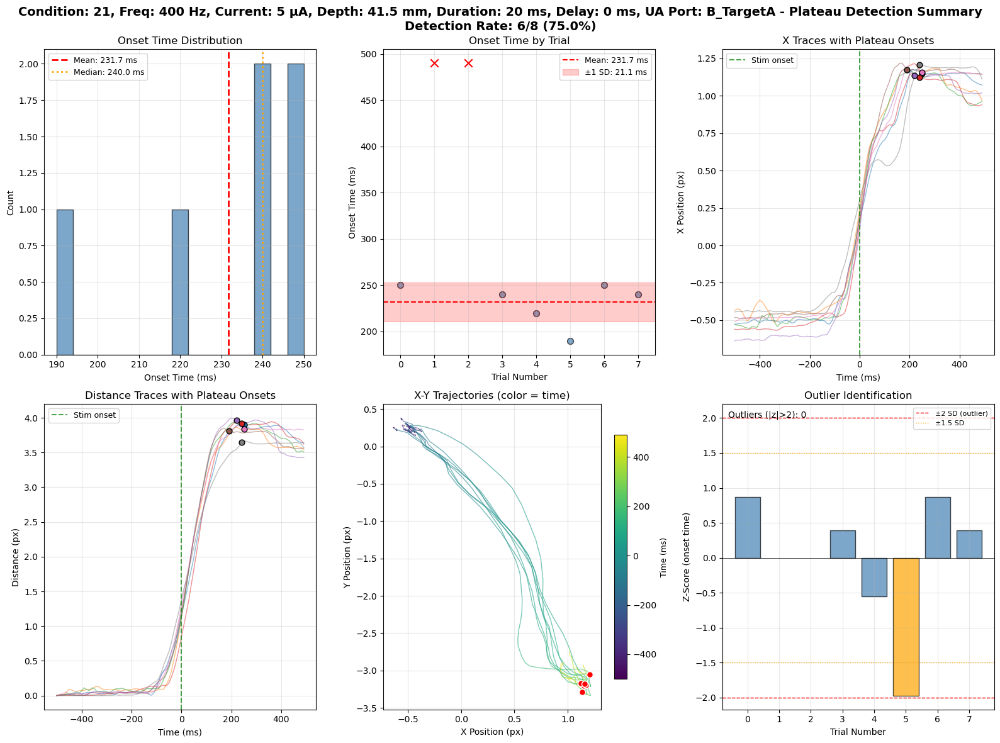


Processing 13/31: Condition: 22, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 8
  Plateaus found: 8/8 (100.0%)
  Mean onset: 211.2 ± 21.5 ms


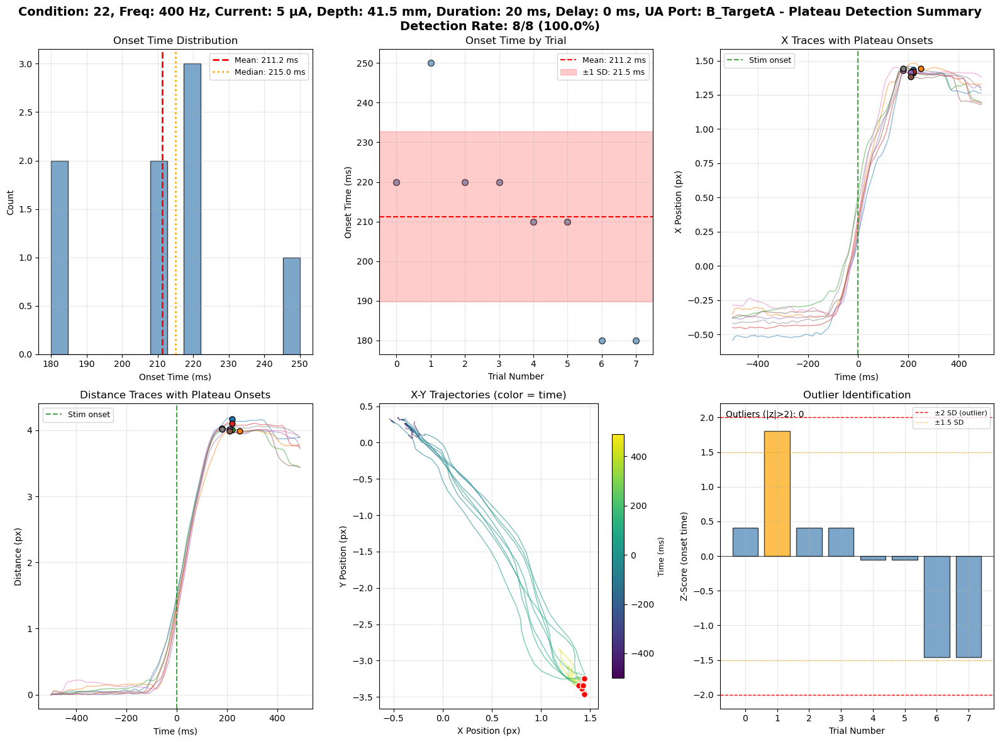


Processing 14/31: Condition: 23, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 10
  Plateaus found: 9/10 (90.0%)
  Mean onset: 234.4 ± 31.3 ms


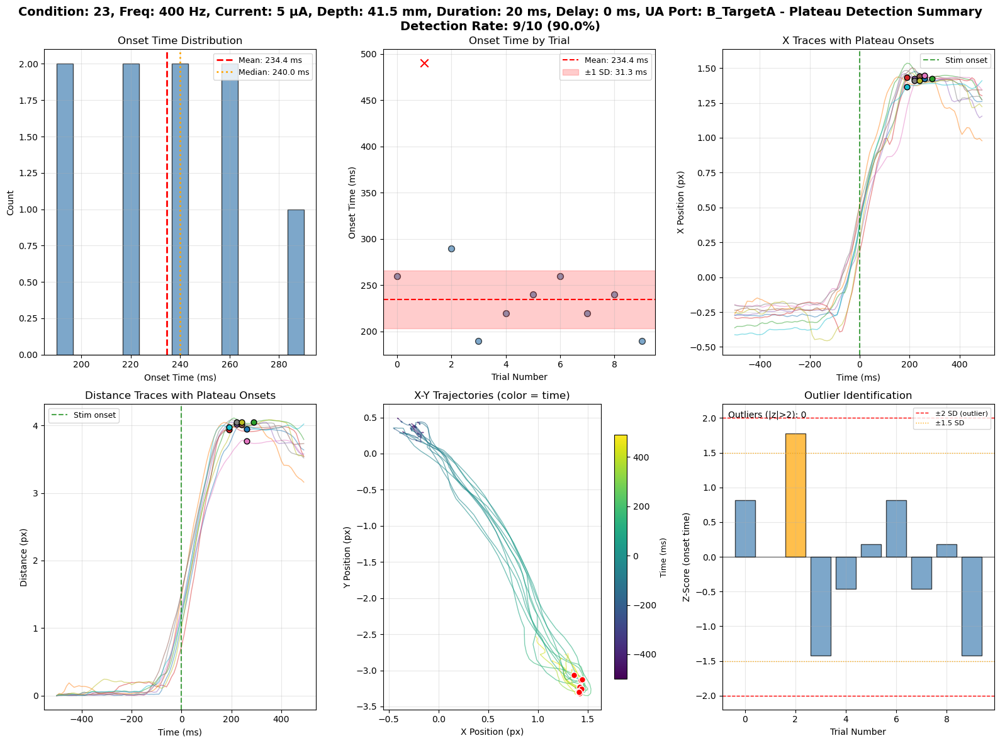


Processing 15/31: Condition: 24, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 6
  Plateaus found: 6/6 (100.0%)
  Mean onset: 233.3 ± 26.9 ms


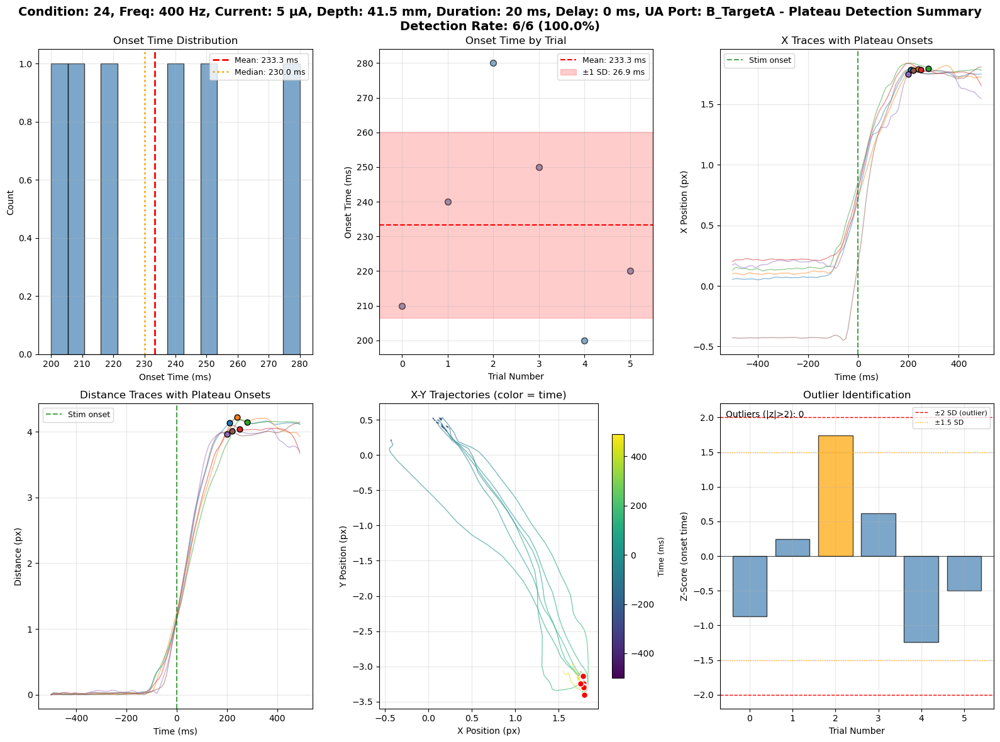


Processing 16/31: Condition: 25, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 100 ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 7
  Plateaus found: 3/7 (42.9%)
  Mean onset: 360.0 ± 14.1 ms


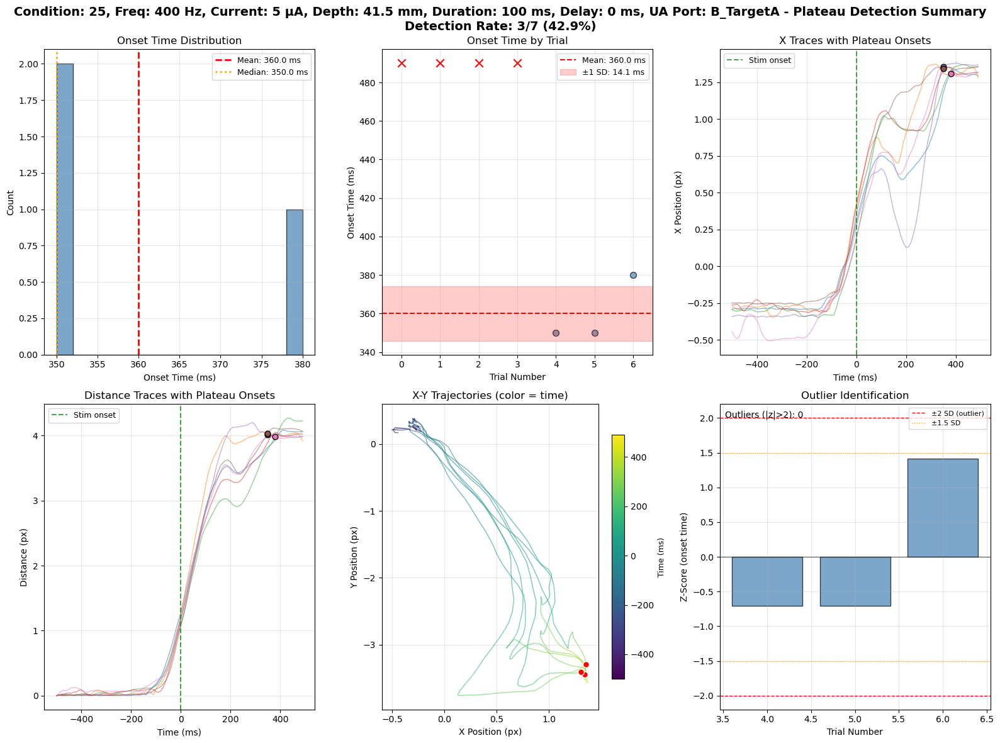


Processing 17/31: Condition: 27, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 15
  Plateaus found: 15/15 (100.0%)
  Mean onset: 254.0 ± 38.4 ms


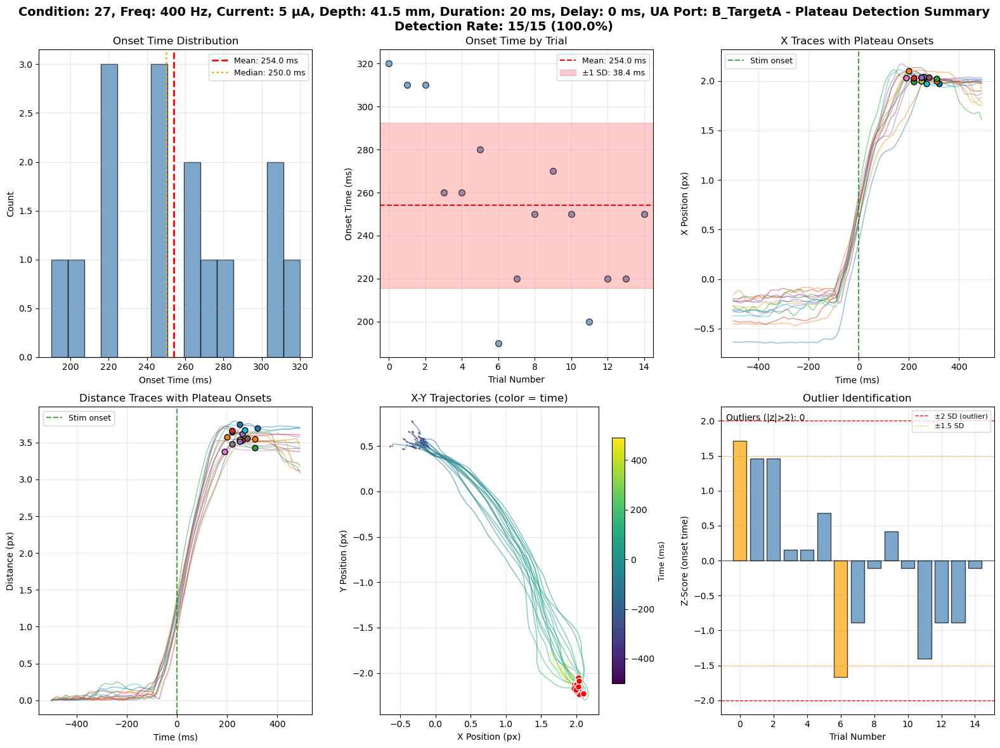


Processing 18/31: Condition: 28, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 13
  Plateaus found: 13/13 (100.0%)
  Mean onset: 232.3 ± 24.5 ms


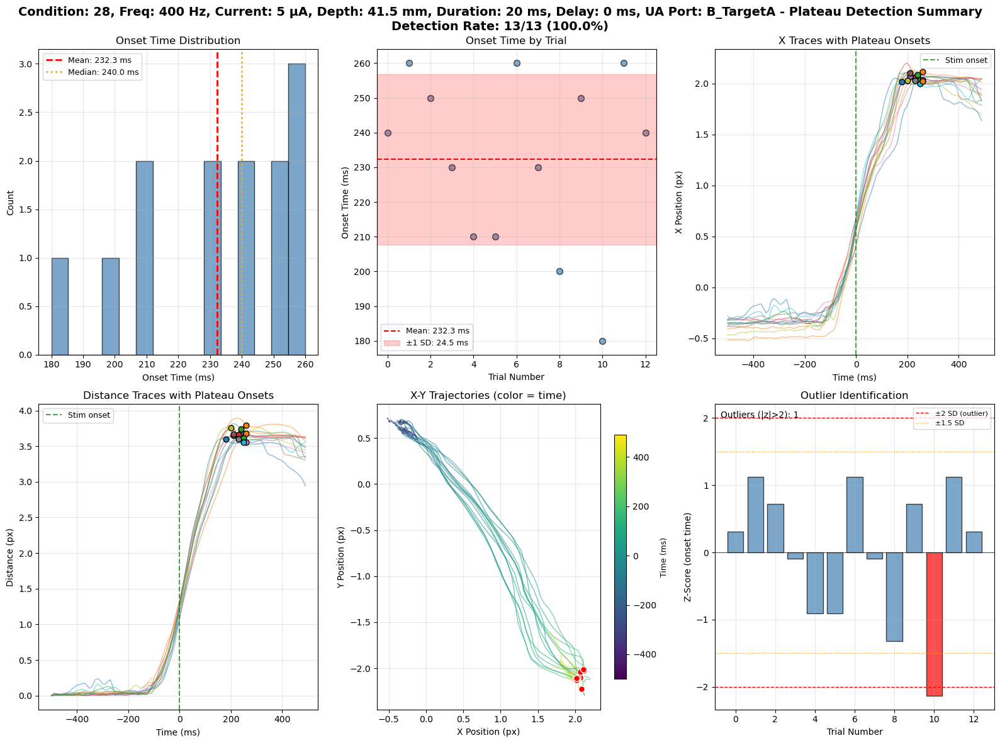


Processing 19/31: Condition: 29, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 14
  Plateaus found: 13/14 (92.9%)
  Mean onset: 239.2 ± 43.8 ms


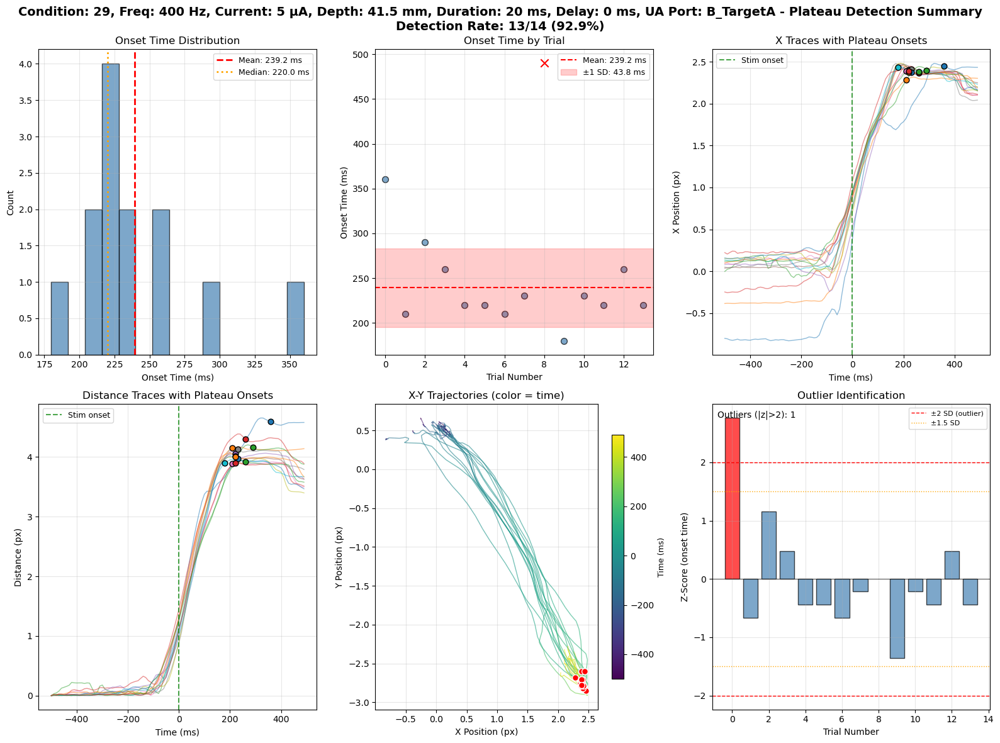


Processing 20/31: Condition: 30, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 7
  Plateaus found: 7/7 (100.0%)
  Mean onset: 207.1 ± 17.5 ms


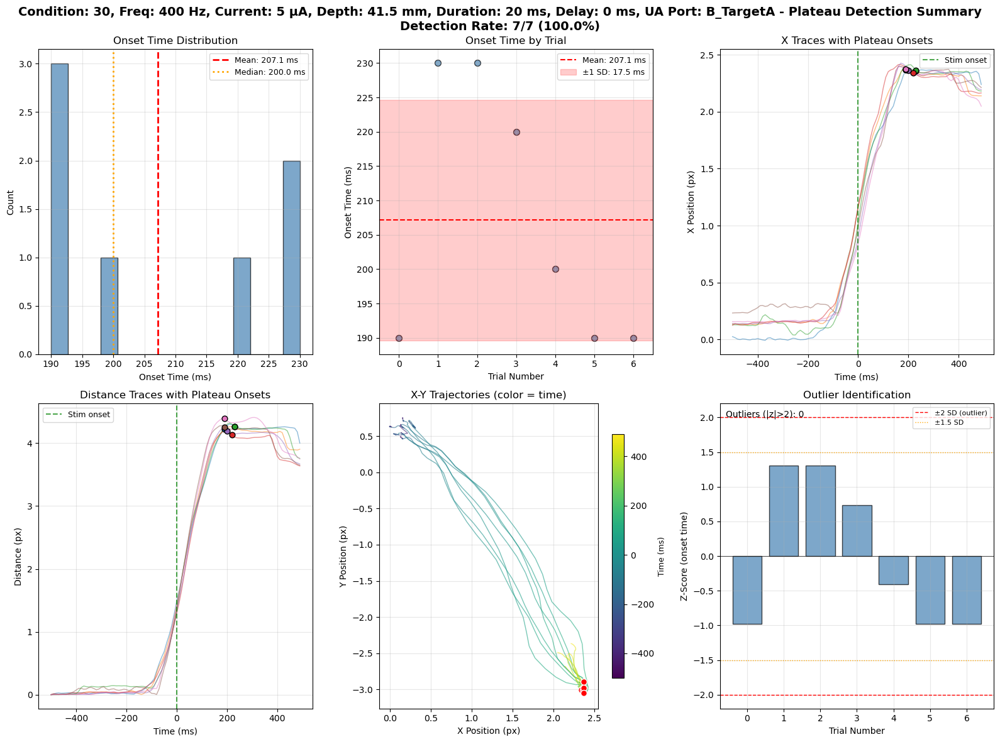


Processing 21/31: Condition: 31, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetA
  Valid trials: 16
  Plateaus found: 14/16 (87.5%)
  Mean onset: 227.9 ± 34.5 ms


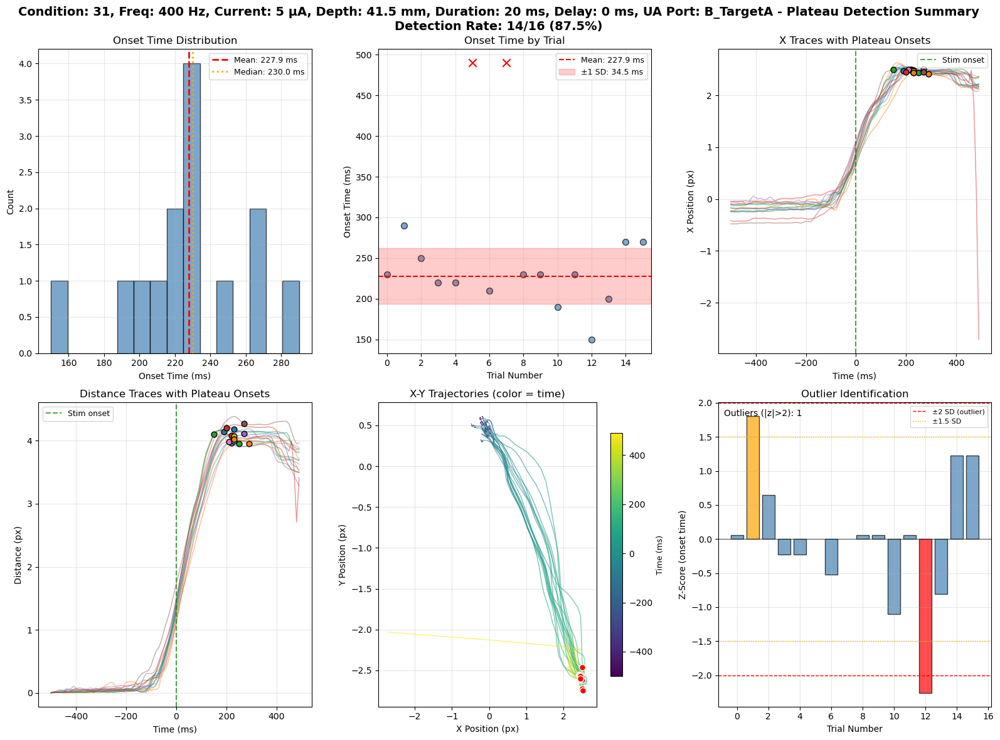


Processing 22/31: Condition: 26, Freq: n/a Hz, Current: n/a µA, Depth: 41.5 mm, Duration: n/a ms, Delay: 0 ms, UA Port: B_TargetB
  Valid trials: 16
  Plateaus found: 16/16 (100.0%)
  Mean onset: 181.2 ± 64.9 ms


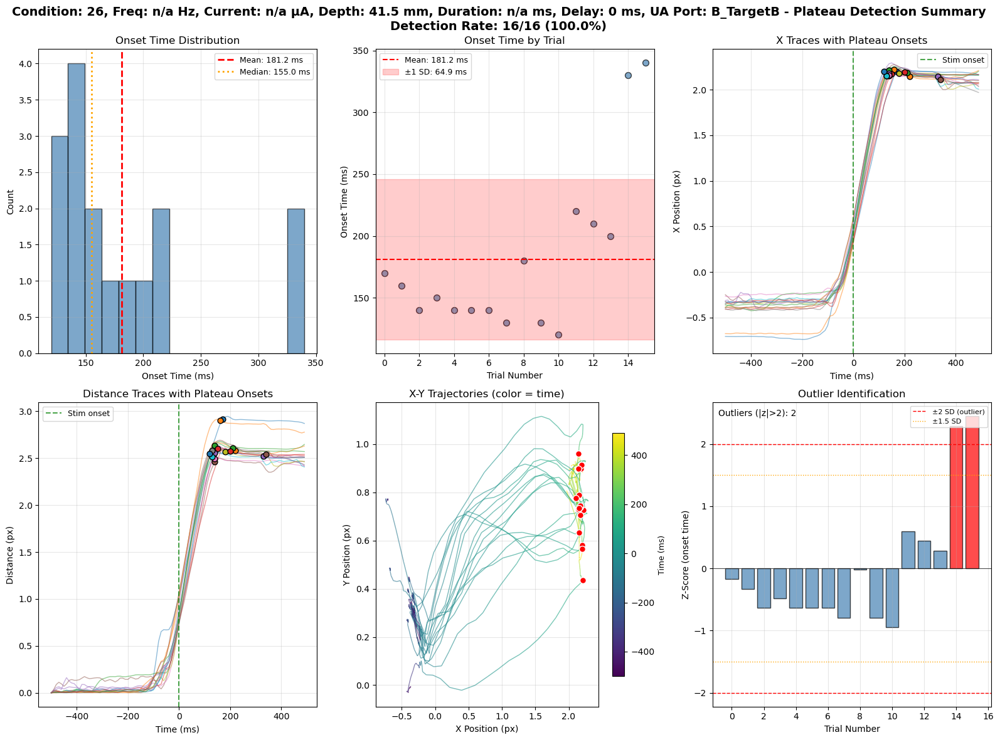


Processing 23/31: Condition: 19, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetB
  Valid trials: 15
  Plateaus found: 15/15 (100.0%)
  Mean onset: 162.0 ± 23.4 ms


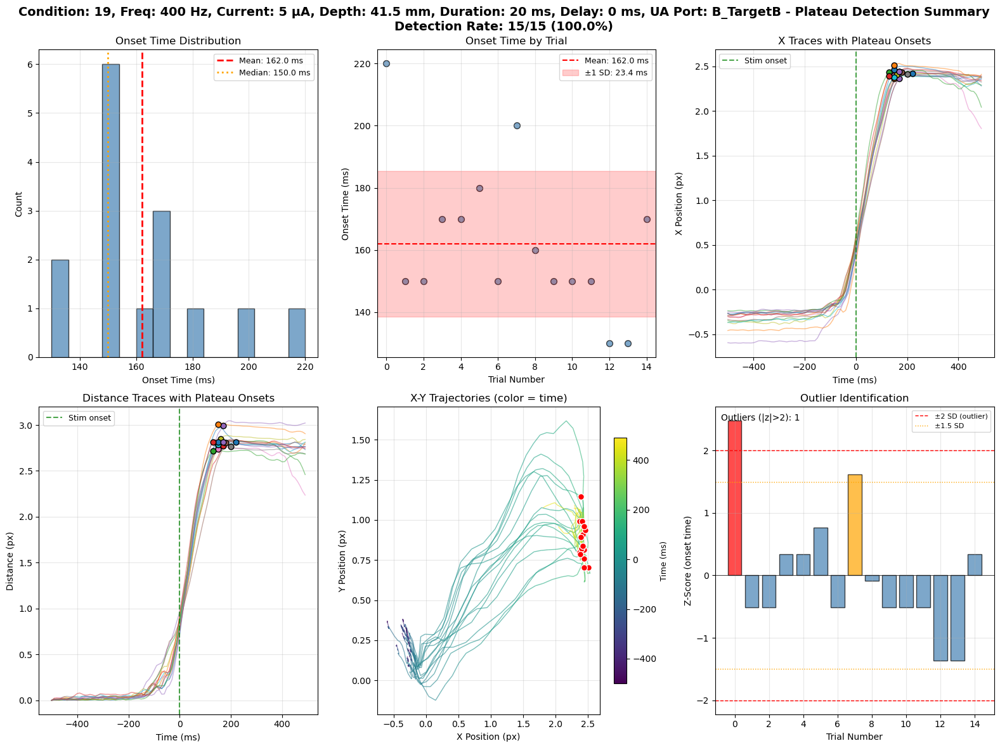


Processing 24/31: Condition: 20, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetB
  Valid trials: 13
  Plateaus found: 13/13 (100.0%)
  Mean onset: 163.1 ± 47.3 ms


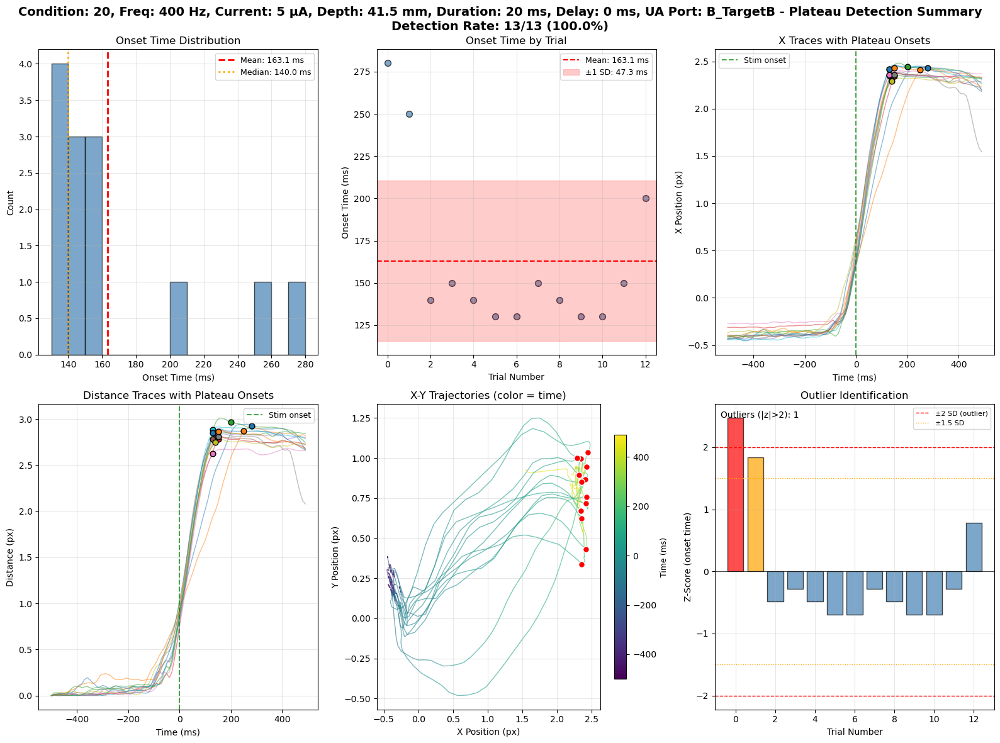


Processing 25/31: Condition: 21, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetB
  Valid trials: 16
  Plateaus found: 16/16 (100.0%)
  Mean onset: 140.6 ± 20.5 ms


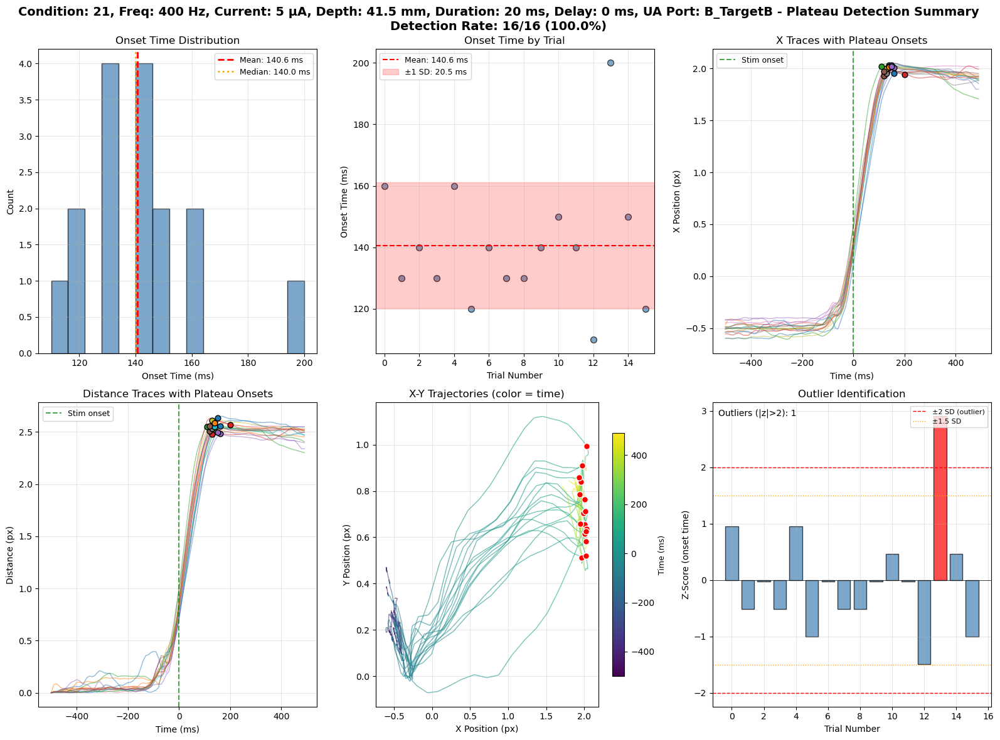


Processing 26/31: Condition: 22, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetB
  Valid trials: 15
  Plateaus found: 15/15 (100.0%)
  Mean onset: 162.0 ± 38.5 ms


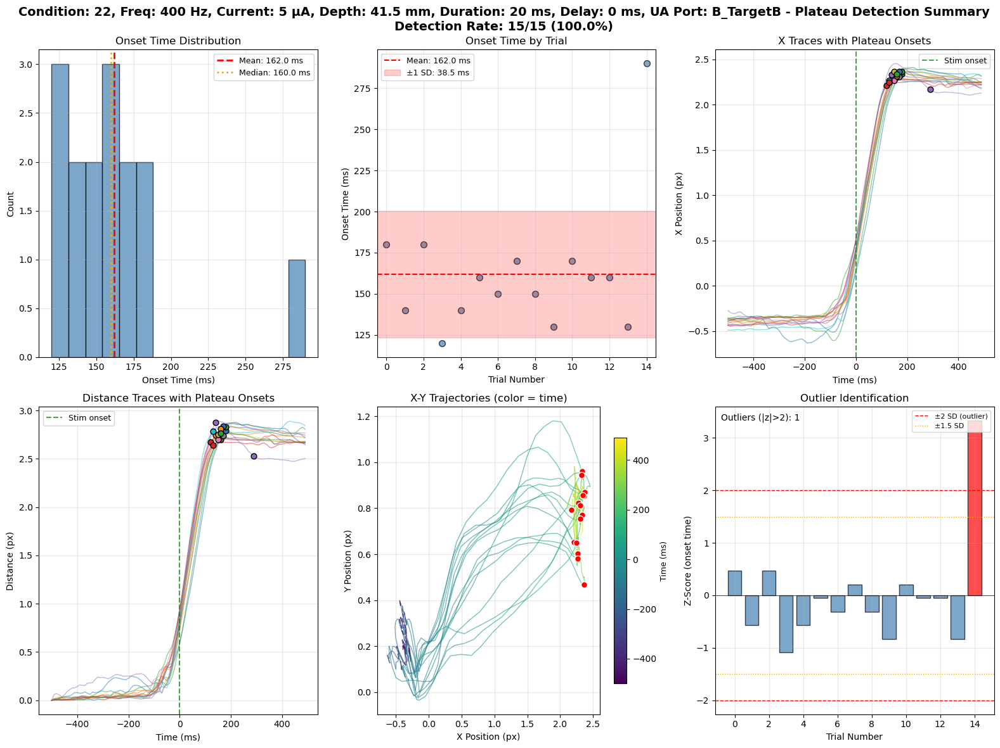


Processing 27/31: Condition: 23, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetB
  Valid trials: 12
  Plateaus found: 12/12 (100.0%)
  Mean onset: 190.0 ± 61.4 ms


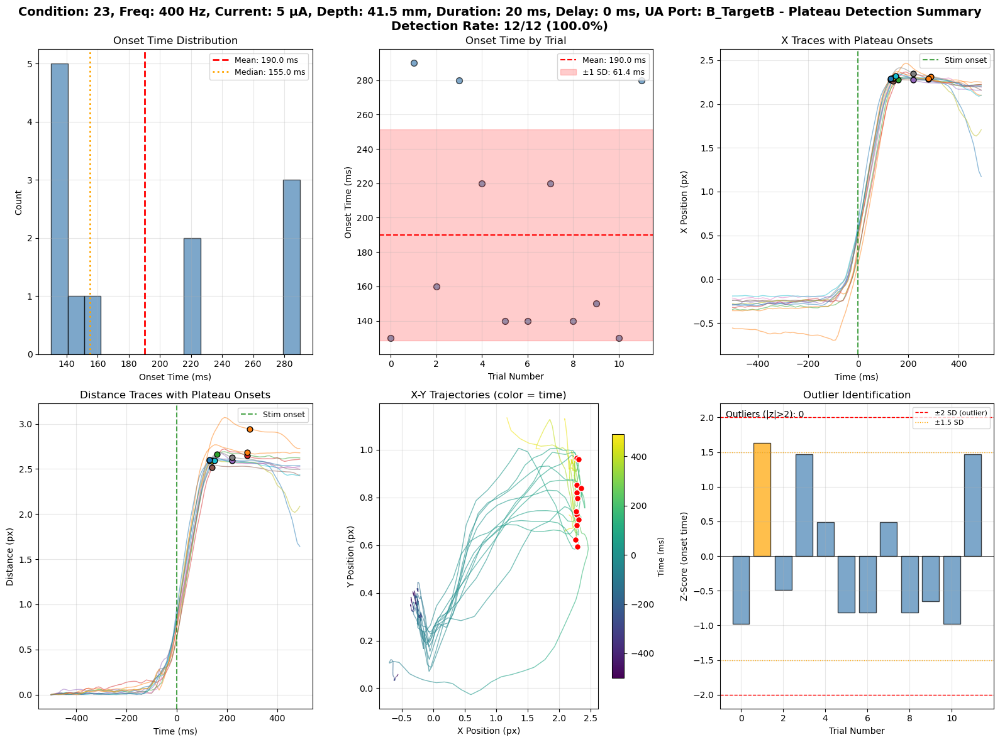


Processing 28/31: Condition: 24, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetB
  Valid trials: 9
  Plateaus found: 9/9 (100.0%)
  Mean onset: 156.7 ± 21.1 ms


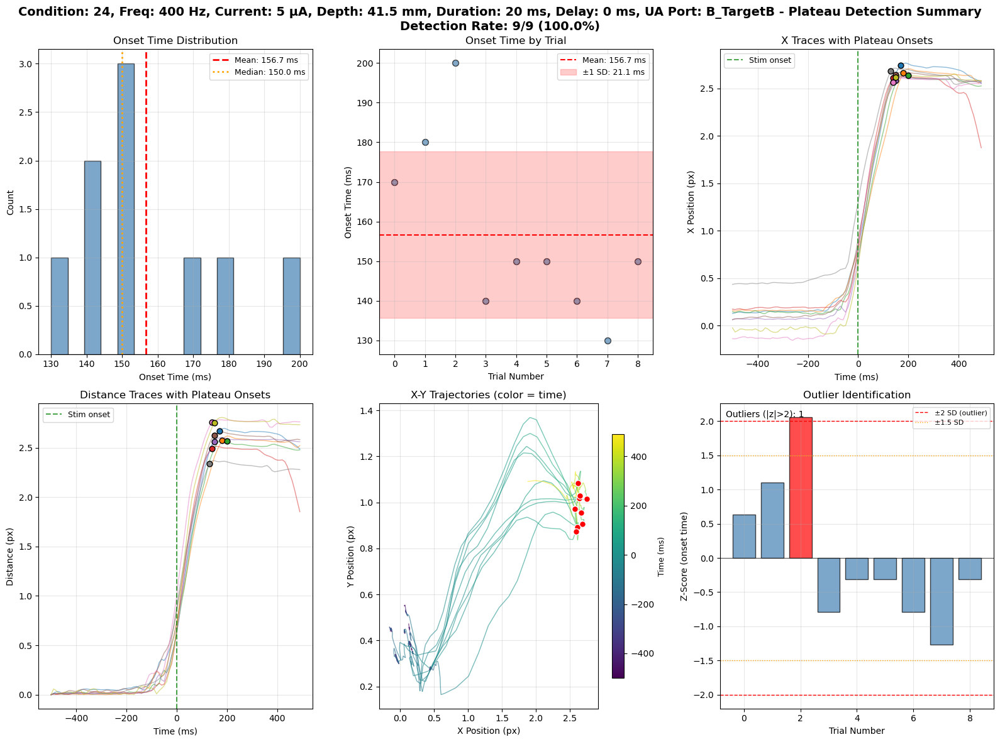


Processing 29/31: Condition: 25, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 100 ms, Delay: 0 ms, UA Port: B_TargetB
  Valid trials: 13
  Plateaus found: 11/13 (84.6%)
  Mean onset: 333.6 ± 33.4 ms


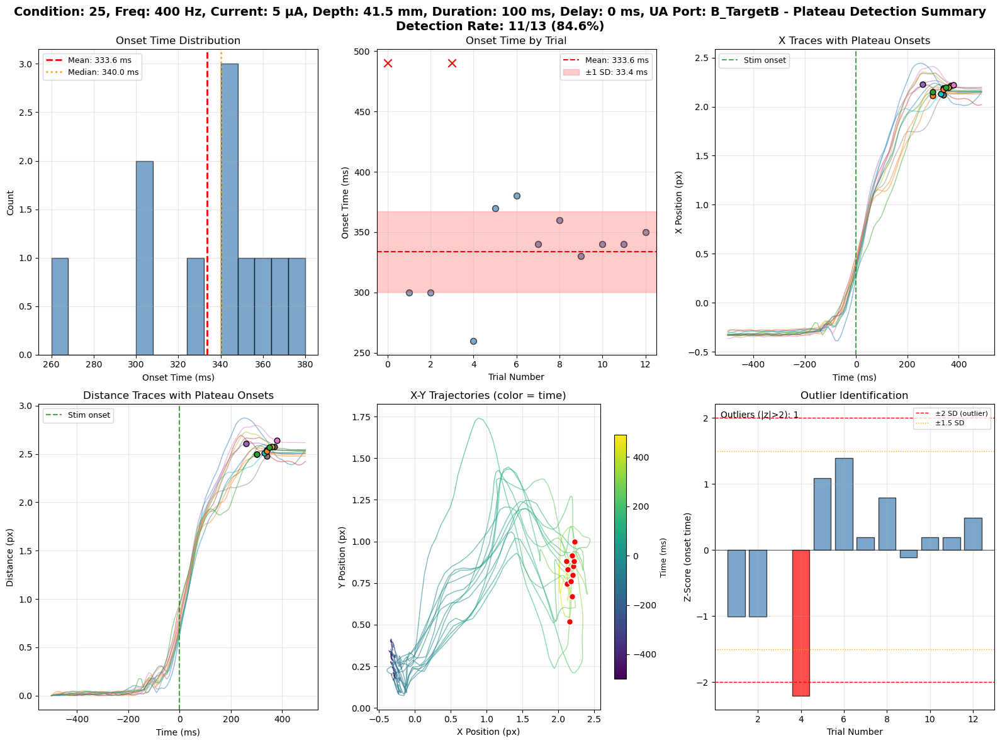


Processing 30/31: Condition: 29, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetB
  Valid trials: 1
  Plateaus found: 1/1 (100.0%)
  Mean onset: 260.0 ± 0.0 ms


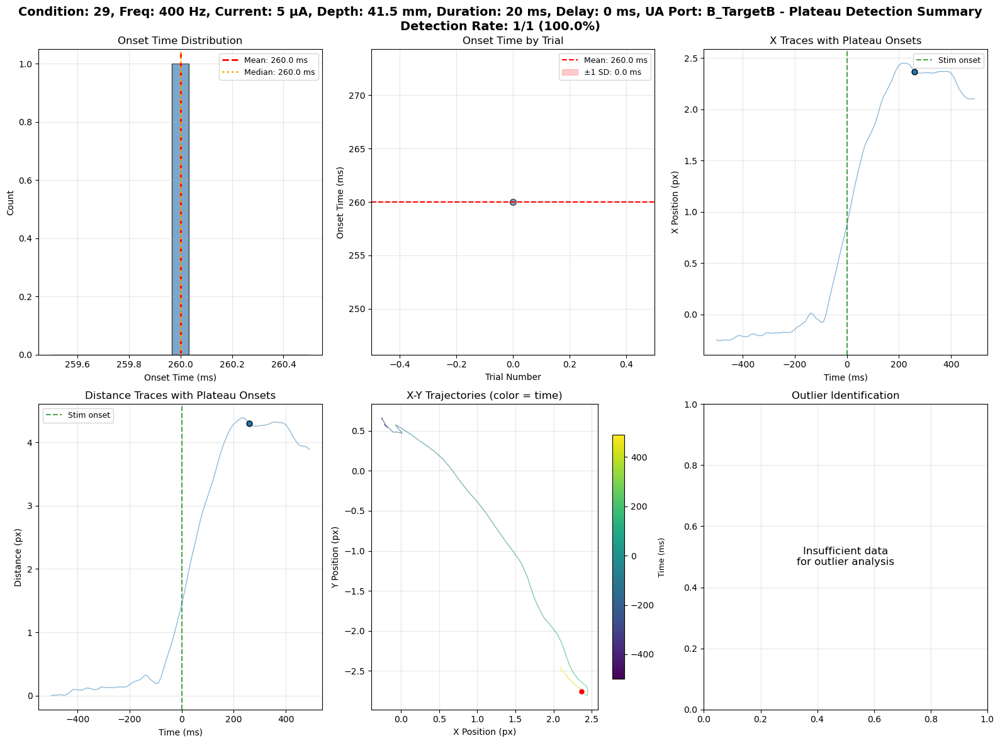


Processing 31/31: Condition: 30, Freq: 400 Hz, Current: 5 µA, Depth: 41.5 mm, Duration: 20 ms, Delay: 0 ms, UA Port: B_TargetB
  Valid trials: 1
  Plateaus found: 1/1 (100.0%)
  Mean onset: 340.0 ± 0.0 ms


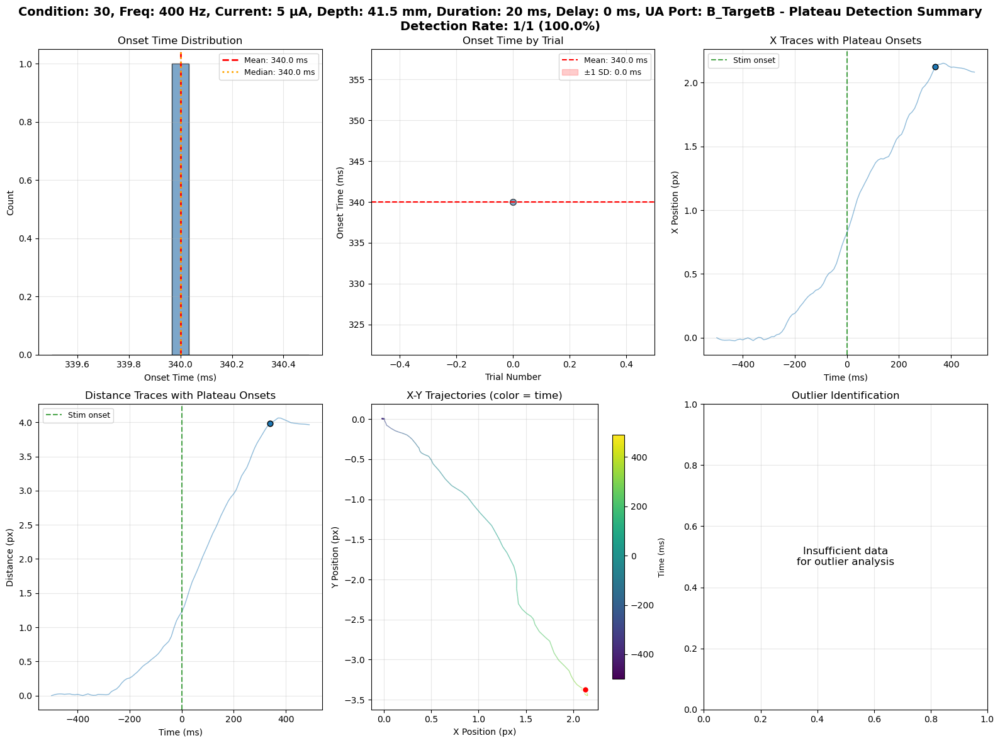


ANALYSIS COMPLETE - SUMMARY

Condition                           Trials   Found    Rate       Mean Onset  
---------------------------------------------------------------------------
Condition: 1, Freq: 2 Hz, Current:  17       11       64.7%      229.1 ms    
Condition: 18, Freq: n/a Hz, Curren 10       8        80.0%      222.5 ms    
Condition: 26, Freq: n/a Hz, Curren 14       13       92.9%      230.8 ms    
Condition: 11, Freq: 400 Hz, Curren 10       9        90.0%      224.4 ms    
Condition: 12, Freq: 400 Hz, Curren 10       10       100.0%     200.0 ms    
Condition: 14, Freq: 400 Hz, Curren 11       11       100.0%     202.7 ms    
Condition: 15, Freq: 400 Hz, Curren 9        8        88.9%      220.0 ms    
Condition: 16, Freq: 400 Hz, Curren 11       11       100.0%     289.1 ms    
Condition: 17, Freq: 400 Hz, Curren 12       7        58.3%      358.6 ms    
Condition: 19, Freq: 400 Hz, Curren 6        4        66.7%      282.5 ms    
Condition: 20, Freq: 400 Hz, Curren 

In [44]:
# Cell 19: Analyze All Conditions in Session
# Loads all condition files and runs plateau detection on each

import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# === DATA LOADING FOR ALL CONDITIONS ===

def load_all_conditions(peri_root: Path, camera: str = "cam1", 
                        keypoint_base: str = "middle",
                        control_br_indices: list = None) -> dict:
    """
    Load all condition files from a session.
    
    Returns:
        dict mapping condition string -> condition_data dict
    """
    if control_br_indices is None:
        control_br_indices = [1]
    
    # Discover files
    files_by_target = discover_available_files(peri_root)
    
    all_conditions = {}
    
    for target, files in files_by_target.items():
        for file_path in files:
            try:
                cond_data = load_condition_data(file_path, camera, keypoint_base)
                
                # Create unique key
                br_idx = cond_data.get('br_idx', 0)
                cond_type = 'control' if br_idx in control_br_indices else 'stim'
                key = f"{cond_data['cond_str']}_Target{target}"
                
                # Avoid duplicates
                if key in all_conditions:
                    key = f"{key}_{file_path.stem}"
                
                all_conditions[key] = cond_data
                print(f"  Loaded: {key} ({cond_data['n_trials']} trials)")
                
            except Exception as e:
                print(f"  Error loading {file_path.name}: {e}")
    
    return all_conditions


def process_and_detect_condition(cond_data: dict, 
                                  smoothing_method: str = 'savgol',
                                  smoothing_params: dict = None,
                                  detection_params: dict = None,
                                  time_window: tuple = (-500, 500)) -> dict:
    """
    Process a single condition and run plateau detection on all trials.
    
    Returns:
        dict with processed_data and plateau_summary
    """
    if smoothing_params is None:
        smoothing_params = {'window_ms': 60.0, 'polyorder': 4}
    
    if detection_params is None:
        detection_params = {
            'use_x': True, 'use_y': False, 'use_dist': True,
            'x_max_change_pct': 2.0, 'dist_max_change_pct': 2.0,
            'min_duration_ms': 100, 'search_start_ms': 100, 'search_end_ms': None
        }
    
    # Process condition
    processed = process_condition(
        cond_data,
        smoothing_method=smoothing_method,
        smoothing_params=smoothing_params,
        smooth_xy=True,
        time_window=time_window
    )
    
    # Run plateau detection on each trial
    time_ms = processed['aligned_time']
    n_trials = processed['n_valid']
    
    results = []
    onset_times = []
    x_values = []
    y_values = []
    dist_values = []
    
    for i in range(processed['n_total']):
        if not processed['valid_mask'][i]:
            results.append({'found': False, 'trial_idx': i})
            continue
        
        # Get smoothed traces for this trial
        x_smooth = processed['x_smooth_all'][i]
        y_smooth = processed['y_smooth_all'][i]
        dist_smooth = processed['distance_smooth_all'][i]
        
        # Run multi-signal detection
        det_result = PlateauDetectionMethods.stable_region_multi(
            x_smooth=x_smooth,
            y_smooth=y_smooth,
            dist_smooth=dist_smooth,
            time_ms=time_ms,
            min_duration_ms=detection_params['min_duration_ms'],
            x_max_change_pct=detection_params.get('x_max_change_pct', 2.0),
            y_max_change_pct=detection_params.get('y_max_change_pct', 2.0),
            dist_max_change_pct=detection_params.get('dist_max_change_pct', 2.0),
            use_x=detection_params['use_x'],
            use_y=detection_params['use_y'],
            use_dist=detection_params['use_dist'],
            search_start_ms=detection_params['search_start_ms'],
            search_end_ms=detection_params['search_end_ms'],
            return_stability_traces=False
        )
        
        det_result['trial_idx'] = i
        results.append(det_result)
        
        if det_result['found']:
            onset_times.append(det_result['onset_ms'])
            x_values.append(det_result['x_value'])
            y_values.append(det_result['y_value'])
            dist_values.append(det_result['dist_value'])
    
    # Summary statistics
    n_found = len(onset_times)
    plateau_summary = {
        'n_trials': processed['n_total'],
        'n_valid': n_trials,
        'n_found': n_found,
        'detection_rate': n_found / max(1, n_trials),
        'onset_times': np.array(onset_times),
        'x_values': np.array(x_values),
        'y_values': np.array(y_values),
        'dist_values': np.array(dist_values),
        'results': results,
        'params': detection_params.copy(),
        'onset_mean': np.mean(onset_times) if n_found > 0 else np.nan,
        'onset_std': np.std(onset_times) if n_found > 0 else np.nan,
        'onset_median': np.median(onset_times) if n_found > 0 else np.nan,
    }
    
    return {
        'processed_data': processed,
        'plateau_summary': plateau_summary
    }


def analyze_all_conditions(peri_root: Path = None,
                           camera: str = "cam1",
                           keypoint_base: str = "middle",
                           control_br_indices: list = None,
                           smoothing_method: str = 'savgol',
                           smoothing_params: dict = None,
                           detection_params: dict = None,
                           time_window: tuple = (-500, 500),
                           plot_each: bool = True,
                           save_figs: bool = False,
                           save_dir: Path = None):
    """
    Main function: Load all conditions and run plateau analysis.
    """
    # Use config if available
    if peri_root is None:
        if 'PERI_ROOT' in dir():
            peri_root = PERI_ROOT
        else:
            raise ValueError("peri_root must be specified or PERI_ROOT must be defined")
    
    if control_br_indices is None:
        control_br_indices = CONTROL_BR_INDICES if 'CONTROL_BR_INDICES' in dir() else [1]
    
    if detection_params is None:
        detection_params = {
            'use_x': True, 'use_y': False, 'use_dist': True,
            'x_max_change_pct': 2.0, 'dist_max_change_pct': 2.0,
            'min_duration_ms': 100, 'search_start_ms': 100, 'search_end_ms': None
        }
    
    print("="*60)
    print("LOADING ALL CONDITIONS")
    print("="*60)
    print(f"PERI_ROOT: {peri_root}")
    print(f"Camera: {camera}, Keypoint: {keypoint_base}")
    print(f"Control BR indices: {control_br_indices}\n")
    
    # Load all conditions
    all_conditions = load_all_conditions(
        peri_root=Path(peri_root),
        camera=camera,
        keypoint_base=keypoint_base,
        control_br_indices=control_br_indices
    )
    
    if len(all_conditions) == 0:
        print("ERROR: No conditions found!")
        return {}
    
    print(f"\nLoaded {len(all_conditions)} conditions\n")
    
    # Process each condition
    all_results = {}
    
    for cond_idx, (cond_key, cond_data) in enumerate(all_conditions.items()):
        print(f"\n{'='*60}")
        print(f"Processing {cond_idx+1}/{len(all_conditions)}: {cond_key}")
        print('='*60)
        
        try:
            result = process_and_detect_condition(
                cond_data=cond_data,
                smoothing_method=smoothing_method,
                smoothing_params=smoothing_params,
                detection_params=detection_params,
                time_window=time_window
            )
            
            ps = result['plateau_summary']
            print(f"  Valid trials: {ps['n_valid']}")
            print(f"  Plateaus found: {ps['n_found']}/{ps['n_valid']} ({ps['detection_rate']:.1%})")
            
            if ps['n_found'] > 0:
                print(f"  Mean onset: {ps['onset_mean']:.1f} ± {ps['onset_std']:.1f} ms")
            
            # Add condition info
            result['processed_data']['cond_str'] = cond_key
            all_results[cond_key] = result
            
            # Plot if requested
            if plot_each and ps['n_found'] > 0:
                fig = plot_plateau_summary_comprehensive(
                    result['processed_data'], 
                    result['plateau_summary']
                )
                
                if save_figs and save_dir:
                    save_dir = Path(save_dir)
                    save_dir.mkdir(parents=True, exist_ok=True)
                    safe_name = cond_key.replace('/', '_').replace(' ', '_')
                    fig_path = save_dir / f"plateau_summary_{safe_name}.png"
                    fig.savefig(fig_path, dpi=150, bbox_inches='tight')
                    print(f"  Saved: {fig_path}")
                    plt.close(fig)
                    
        except Exception as e:
            print(f"  ERROR: {e}")
            import traceback
            traceback.print_exc()
            all_results[cond_key] = {'error': str(e)}
    
    # Print summary table
    print(f"\n{'='*60}")
    print("ANALYSIS COMPLETE - SUMMARY")
    print('='*60)
    print(f"\n{'Condition':<35} {'Trials':<8} {'Found':<8} {'Rate':<10} {'Mean Onset':<12}")
    print("-" * 75)
    
    for cond_key, res in all_results.items():
        if 'error' in res:
            print(f"{cond_key[:35]:<35} {'ERROR':<8}")
        else:
            ps = res['plateau_summary']
            onset_str = f"{ps['onset_mean']:.1f} ms" if ps['n_found'] > 0 else "N/A"
            rate_str = f"{ps['detection_rate']:.1%}"  # Format percent first
            print(f"{cond_key[:35]:<35} {ps['n_valid']:<8} {ps['n_found']:<8} {rate_str:<10} {onset_str:<12}")
    
    return all_results


# === RUN THE ANALYSIS ===

# Detection parameters (adjust as needed)
DETECTION_PARAMS = {
    'use_x': True,
    'use_y': False,
    'use_dist': True,
    'x_max_change_pct': 2.0,
    'y_max_change_pct': 2.0,
    'dist_max_change_pct': 2.0,
    'min_duration_ms': 100,
    'search_start_ms': 100,
    'search_end_ms': None
}

# Run analysis
all_results = analyze_all_conditions(
    peri_root=PERI_ROOT,  # From Cell 2 config
    camera=CAMERA_TO_USE,
    keypoint_base=KEYPOINT_BASE,
    control_br_indices=CONTROL_BR_INDICES,
    smoothing_method='savgol',
    smoothing_params={'window_ms': 60.0, 'polyorder': 4},
    detection_params=DETECTION_PARAMS,
    time_window=(-PRE_ZERO_MS, POST_ZERO_MS),
    plot_each=True,
    save_figs=False
)

TARGET A ANALYSIS


C:\Users\culle\AppData\Local\Temp\ipykernel_19220\4244688018.py:165: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax2.boxplot(all_times, labels=labels, patch_artist=True)


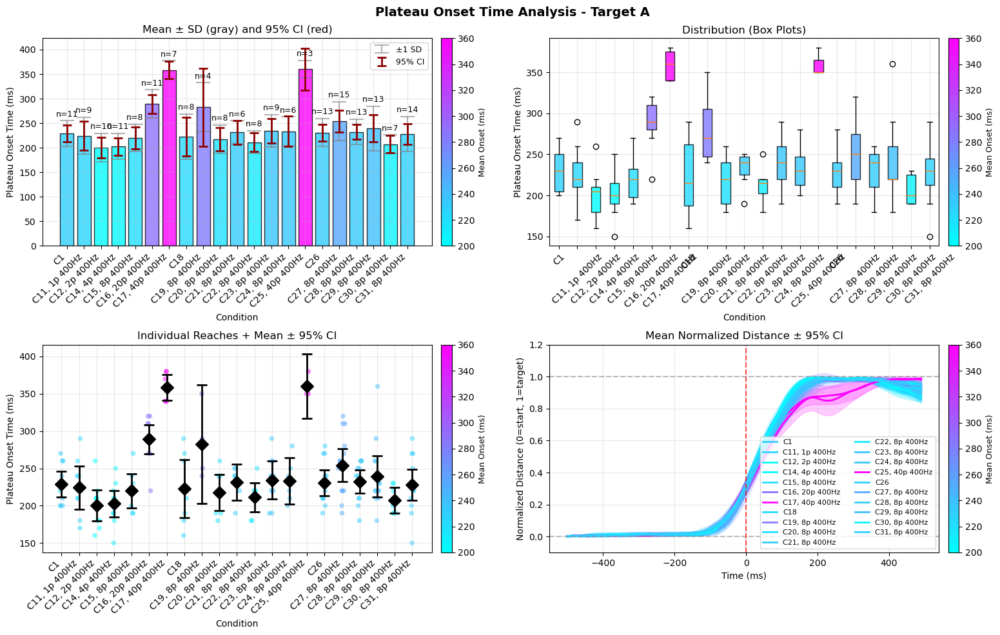


SUMMARY TABLE
Condition                     n     Mean       SD      SEM     95% CI
--------------------------------------------------------------------------------
C1                           11    229.1     25.9      7.8 ±17.4
C11, 1p 400Hz                 9    224.4     37.8     12.6 ±29.0
C12, 2p 400Hz                10    200.0     29.1      9.2 ±20.8
C14, 4p 400Hz                11    202.7     26.5      8.0 ±17.8
C15, 8p 400Hz                 8    220.0     27.3      9.6 ±22.8
C16, 20p 400Hz               11    289.1     28.8      8.7 ±19.3
C17, 40p 400Hz                7    358.6     18.6      7.0 ±17.2
C18                           8    222.5     46.5     16.4 ±38.9
C19, 8p 400Hz                 4    282.5     49.9     25.0 ±79.4
C20, 8p 400Hz                 8    217.5     28.7     10.1 ±24.0
C21, 8p 400Hz                 6    231.7     23.2      9.5 ±24.3
C22, 8p 400Hz                 8    211.2     23.0      8.1 ±19.2
C23, 8p 400Hz                 9    234.4     33.2     

C:\Users\culle\AppData\Local\Temp\ipykernel_19220\4244688018.py:165: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax2.boxplot(all_times, labels=labels, patch_artist=True)


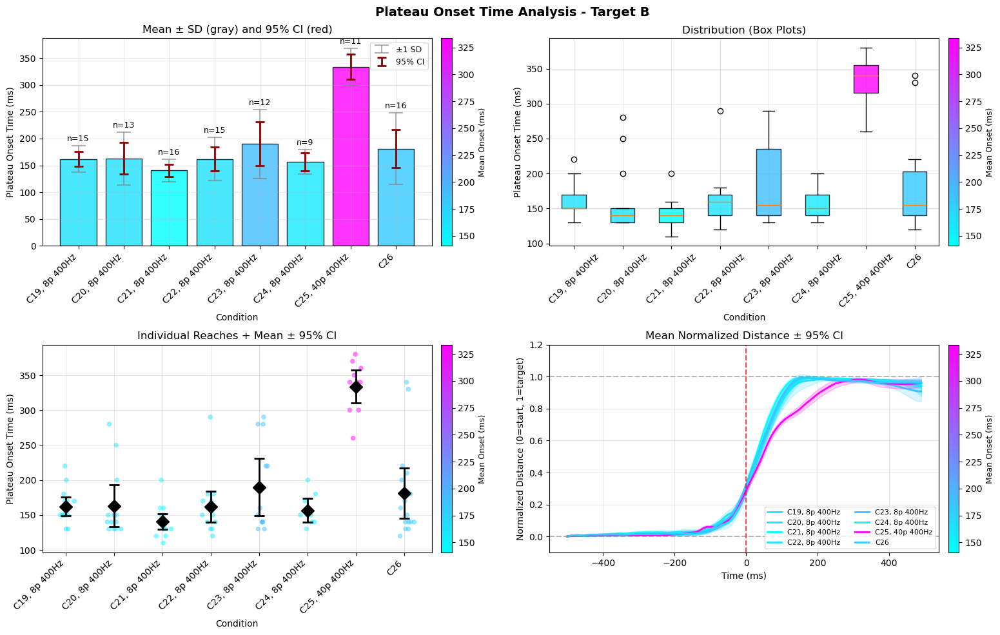


SUMMARY TABLE
Condition                     n     Mean       SD      SEM     95% CI
--------------------------------------------------------------------------------
C19, 8p 400Hz                15    162.0     24.3      6.3 ±13.4
C20, 8p 400Hz                13    163.1     49.2     13.7 ±29.7
C21, 8p 400Hz                16    140.6     21.1      5.3 ±11.3
C22, 8p 400Hz                15    162.0     39.9     10.3 ±22.1
C23, 8p 400Hz                12    190.0     64.1     18.5 ±40.7
C24, 8p 400Hz                 9    156.7     22.4      7.5 ±17.2
C25, 40p 400Hz               11    333.6     35.0     10.6 ±23.5
C26                          16    181.2     67.0     16.8 ±35.7


In [45]:
# Cell 20: Compare plateau onset times across conditions - separate figures per target

import re
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

def compare_conditions_by_target(all_results, target='A', figsize=(16, 10), cmap='cool', pulse_width_ms=2.5):
    """
    Create figure comparing plateau onset times across conditions for one target.
    Shows both SD (outer, lighter) and 95% CI (inner, darker) on same bars.
    Bar colors indicate mean onset time value.
    Skips conditions with fewer than 3 reaches.
    
    Parameters:
    -----------
    all_results : dict
        Results from analyze_reaches_to_targets()
    target : str
        'A' or 'B'
    figsize : tuple
        Figure size
    cmap : str
        Colormap name (e.g., 'viridis', 'plasma', 'coolwarm', 'RdYlGn_r')
    pulse_width_ms : float
        Duration of each pulse in ms (default 2.5 ms)
    """
    target_suffix = f"_Target{target}"
    
    # Collect data for this target
    condition_data = []
    
    for key, data in all_results.items():
        if not key.endswith(target_suffix):
            continue
        
        # Get onset times from plateau_summary
        plateau_summary = data.get('plateau_summary', {})
        onset_times = plateau_summary.get('onset_times', np.array([]))
        
        # Convert to list and filter out NaNs
        if isinstance(onset_times, np.ndarray):
            onset_times = onset_times[~np.isnan(onset_times)].tolist()
        else:
            onset_times = [t for t in onset_times if not np.isnan(t)]
        
        n_reaches = len(onset_times)
        
        # Skip conditions with fewer than 3 reaches
        if n_reaches < 3:
            print(f"Skipping {key[:50]}...: only {n_reaches} reaches (need ≥3)")
            continue
        
        # Extract condition number, duration, and frequency
        condition_str = key.replace(target_suffix, '')
        
        cond_match = re.search(r'Condition:\s*(\d+)', condition_str)
        dur_match = re.search(r'Duration:\s*([\d.]+)\s*ms', condition_str)
        freq_match = re.search(r'Freq:\s*([\d.]+)\s*Hz', condition_str)
        
        if cond_match:
            cond_num = int(cond_match.group(1))
        else:
            cond_num = 999
        
        # Calculate number of pulses and build label
        if dur_match and freq_match:
            duration_ms = float(dur_match.group(1))
            freq_hz = float(freq_match.group(1))
            n_pulses = int(duration_ms / pulse_width_ms)
            label = f"C{cond_num}, {n_pulses}p {int(freq_hz)}Hz"
        elif dur_match:
            duration_ms = float(dur_match.group(1))
            n_pulses = int(duration_ms / pulse_width_ms)
            label = f"C{cond_num}, {n_pulses}p"
        else:
            label = f"C{cond_num}"
        
        mean_val = np.mean(onset_times)
        std_val = np.std(onset_times, ddof=1)
        sem_val = std_val / np.sqrt(n_reaches)
        t_crit = stats.t.ppf(0.975, df=n_reaches-1)
        ci95 = t_crit * sem_val
        
        # Get processed data containing traces
        processed_data = data.get('processed_data', {})
        
        # Get time axis and normalized distance traces
        aligned_time = processed_data.get('aligned_time', None)
        dist_norm = processed_data.get('dist_norm', None)  # Use normalized distance
        
        condition_data.append({
            'label': label,
            'cond_num': cond_num,
            'mean': mean_val,
            'std': std_val,
            'sem': sem_val,
            'ci95': ci95,
            'n': n_reaches,
            'times': onset_times,
            'full_key': key,
            'aligned_time': aligned_time,
            'dist_norm': dist_norm
        })
    
    if not condition_data:
        print(f"No valid conditions found for Target {target}")
        return None
    
    # Sort by condition number
    condition_data.sort(key=lambda x: x['cond_num'])
    
    labels = [d['label'] for d in condition_data]
    means = [d['mean'] for d in condition_data]
    stds = [d['std'] for d in condition_data]
    ci95s = [d['ci95'] for d in condition_data]
    ns = [d['n'] for d in condition_data]
    
    # Create colormap based on mean values
    norm = Normalize(vmin=min(means), vmax=max(means))
    colormap = matplotlib.colormaps.get_cmap(cmap)
    colors = [colormap(norm(m)) for m in means]
    
    # Create figure
    fig, axes = plt.subplots(2, 2, figsize=figsize)
    fig.suptitle(f'Plateau Onset Time Analysis - Target {target}', fontsize=14, fontweight='bold')
    
    x_pos = np.arange(len(labels))
    
    # Panel 1: Bar plot with BOTH SD and 95% CI
    ax1 = axes[0, 0]
    bars = ax1.bar(x_pos, means, color=colors, alpha=0.8, edgecolor='black')
    
    # Outer error bars: SD (lighter, thinner)
    ax1.errorbar(x_pos, means, yerr=stds, fmt='none', capsize=8, capthick=1.5,
                 ecolor='gray', elinewidth=1.5, label='±1 SD', alpha=0.6)
    
    # Inner error bars: 95% CI (darker, thicker)
    ax1.errorbar(x_pos, means, yerr=ci95s, fmt='none', capsize=5, capthick=2,
                 ecolor='darkred', elinewidth=2, label='95% CI')
    
    ax1.set_xlabel('Condition')
    ax1.set_ylabel('Plateau Onset Time (ms)')
    ax1.set_title('Mean ± SD (gray) and 95% CI (red)')
    ax1.set_xticks(x_pos)
    ax1.set_xticklabels(labels, rotation=45, ha='right')
    ax1.legend(loc='upper right', fontsize=9)
    
    # Add colorbar for Panel 1
    sm = ScalarMappable(cmap=colormap, norm=norm)
    sm.set_array([])
    cbar1 = plt.colorbar(sm, ax=ax1, pad=0.02)
    cbar1.set_label('Mean Onset (ms)', fontsize=9)
    
    # Add n values on bars
    for i, (bar, n) in enumerate(zip(bars, ns)):
        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + stds[i] + 5,
                f'n={n}', ha='center', va='bottom', fontsize=9)
    
    # Panel 2: Box plots (colored by mean)
    ax2 = axes[0, 1]
    all_times = [d['times'] for d in condition_data]
    bp = ax2.boxplot(all_times, labels=labels, patch_artist=True)
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.8)
    ax2.set_xlabel('Condition')
    ax2.set_ylabel('Plateau Onset Time (ms)')
    ax2.set_title('Distribution (Box Plots)')
    ax2.tick_params(axis='x', rotation=45)
    
    # Add colorbar for Panel 2
    cbar2 = plt.colorbar(sm, ax=ax2, pad=0.02)
    cbar2.set_label('Mean Onset (ms)', fontsize=9)
    
    # Panel 3: Individual points with mean±CI (colored by mean)
    ax3 = axes[1, 0]
    for i, d in enumerate(condition_data):
        jitter = np.random.normal(0, 0.08, len(d['times']))
        ax3.scatter(np.full(len(d['times']), i) + jitter, d['times'], 
                   color=colors[i], alpha=0.5, s=30, edgecolor='none')
        # Mean marker with CI error bar
        ax3.errorbar(i, d['mean'], yerr=d['ci95'], fmt='D', markersize=10,
                    color='black', capsize=6, capthick=2, elinewidth=2)
    ax3.set_xlabel('Condition')
    ax3.set_ylabel('Plateau Onset Time (ms)')
    ax3.set_title('Individual Reaches + Mean ± 95% CI')
    ax3.set_xticks(x_pos)
    ax3.set_xticklabels(labels, rotation=45, ha='right')
    
    # Add colorbar for Panel 3
    cbar3 = plt.colorbar(sm, ax=ax3, pad=0.02)
    cbar3.set_label('Mean Onset (ms)', fontsize=9)
    
    # Panel 4: Mean normalized distance traces with 95% CI
    ax4 = axes[1, 1]
    
    for i, d in enumerate(condition_data):
        dist_norm = d['dist_norm']
        aligned_time = d['aligned_time']
        color = colors[i]
        
        if dist_norm is not None and len(dist_norm) > 0:
            # dist_norm should be shape (n_trials, n_timepoints)
            if isinstance(dist_norm, np.ndarray) and dist_norm.ndim == 2:
                n_trials, n_timepoints = dist_norm.shape
                
                # Calculate mean and 95% CI at each time point
                mean_dist = np.nanmean(dist_norm, axis=0)
                std_dist = np.nanstd(dist_norm, axis=0, ddof=1)
                
                # Count valid (non-NaN) values at each time point
                n_valid = np.sum(~np.isnan(dist_norm), axis=0)
                sem_dist = std_dist / np.sqrt(np.maximum(n_valid, 1))
                
                # 95% CI using t-distribution
                t_crit = stats.t.ppf(0.975, df=max(n_trials-1, 1))
                ci95_dist = t_crit * sem_dist
                
                # Time axis
                if aligned_time is not None:
                    time_ms = aligned_time
                else:
                    time_ms = np.arange(n_timepoints) * 10  # Default 10ms sampling
                
                # Plot mean trace
                ax4.plot(time_ms, mean_dist, color=color, linewidth=2, label=d['label'])
                
                # Plot 95% CI as shaded region
                ax4.fill_between(time_ms, mean_dist - ci95_dist, mean_dist + ci95_dist,
                               color=color, alpha=0.2)
    
    ax4.set_xlabel('Time (ms)')
    ax4.set_ylabel('Normalized Distance (0=start, 1=target)')
    ax4.set_title('Mean Normalized Distance ± 95% CI')
    ax4.legend(loc='lower right', fontsize=8, ncol=2)
    ax4.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
    ax4.axhline(y=1, color='gray', linestyle='--', alpha=0.5)
    ax4.axvline(x=0, color='red', linestyle='--', alpha=0.7)
    ax4.set_ylim(-0.1, 1.2)
    
    # Add colorbar for Panel 4
    cbar4 = plt.colorbar(sm, ax=ax4, pad=0.02)
    cbar4.set_label('Mean Onset (ms)', fontsize=9)
    
    plt.tight_layout()
    plt.show()
    
    # Print summary table to console
    print("\nSUMMARY TABLE")
    print("="*80)
    print(f"{'Condition':<25} {'n':>5} {'Mean':>8} {'SD':>8} {'SEM':>8} {'95% CI':>10}")
    print("-"*80)
    for d in condition_data:
        print(f"{d['label']:<25} {d['n']:>5} {d['mean']:>8.1f} {d['std']:>8.1f} "
              f"{d['sem']:>8.1f} ±{d['ci95']:.1f}")
    
    return condition_data

# Run for both targets
print("="*60)
print("TARGET A ANALYSIS")
print("="*60)
data_A = compare_conditions_by_target(all_results, target='A', cmap='cool', pulse_width_ms=2.5)

print("\n" + "="*60)
print("TARGET B ANALYSIS")
print("="*60)
data_B = compare_conditions_by_target(all_results, target='B', cmap='cool', pulse_width_ms=2.5)

SELECTED CONDITIONS ANALYSIS - Target A
Comparing: [1, 12, 13, 14, 15, 16, 17]


C:\Users\culle\AppData\Local\Temp\ipykernel_19220\1646964387.py:134: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = plt.cm.get_cmap(cmap)


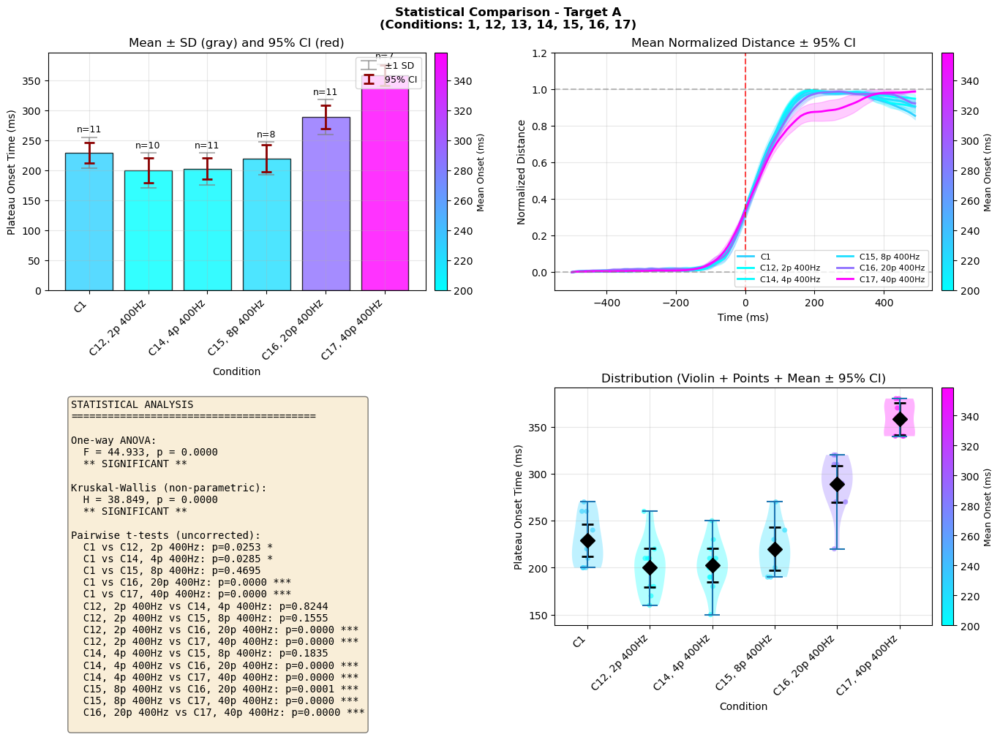


SUMMARY TABLE
Condition                     n     Mean       SD      SEM     95% CI
--------------------------------------------------------------------------------
C1                           11    229.1     25.9      7.8 ±17.4
C12, 2p 400Hz                10    200.0     29.1      9.2 ±20.8
C14, 4p 400Hz                11    202.7     26.5      8.0 ±17.8
C15, 8p 400Hz                 8    220.0     27.3      9.6 ±22.8
C16, 20p 400Hz               11    289.1     28.8      8.7 ±19.3
C17, 40p 400Hz                7    358.6     18.6      7.0 ±17.2

SELECTED CONDITIONS ANALYSIS - Target B
Comparing: [1, 12, 13, 14, 15, 16, 17]
Need at least 2 valid conditions for comparison. Found: 0


In [46]:
# Cell 21: Statistical analysis of selected conditions

import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import re
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# ============================================================
# CONFIGURATION: Specify which condition numbers to compare
# Set to None to include ALL conditions, or specify a list like [7, 8, 9, 10]
# ============================================================
# COMPARE_CONDITIONS = [3, 7, 8, 9, 10, 11, 12]  # e.g., [7, 8, 9, 10, 11, 12] or None for all
COMPARE_CONDITIONS = [1, 12, 13, 14, 15, 16, 17]

def analyze_selected_conditions(all_results, conditions_to_compare=None, target='A', figsize=(14, 10), 
                                cmap='cool', pulse_width_ms=2.5):
    """
    Statistical analysis of selected conditions for one target.
    Skips conditions with fewer than 3 reaches.
    
    Parameters:
    -----------
    all_results : dict
        Results from analyze_reaches_to_targets()
    conditions_to_compare : list or None
        List of condition numbers to include (e.g., [7, 8, 9]), or None for all
    target : str
        'A' or 'B'
    figsize : tuple
        Figure size
    cmap : str
        Colormap name
    pulse_width_ms : float
        Duration of each pulse in ms (default 2.5 ms)
    """
    target_suffix = f"_Target{target}"
    
    # Collect data for this target
    condition_data = []
    
    for key, data in all_results.items():
        if not key.endswith(target_suffix):
            continue
        
        # Get onset times from plateau_summary
        plateau_summary = data.get('plateau_summary', {})
        onset_times = plateau_summary.get('onset_times', np.array([]))
        
        # Convert to list and filter out NaNs
        if isinstance(onset_times, np.ndarray):
            onset_times = onset_times[~np.isnan(onset_times)].tolist()
        else:
            onset_times = [t for t in onset_times if not np.isnan(t)]
        
        n_reaches = len(onset_times)
        
        # Skip conditions with fewer than 3 reaches
        if n_reaches < 3:
            continue
        
        # Extract condition number, duration, and frequency
        condition_str = key.replace(target_suffix, '')
        
        cond_match = re.search(r'Condition:\s*(\d+)', condition_str)
        dur_match = re.search(r'Duration:\s*([\d.]+)\s*ms', condition_str)
        freq_match = re.search(r'Freq:\s*([\d.]+)\s*Hz', condition_str)
        
        if cond_match:
            cond_num = int(cond_match.group(1))
        else:
            continue
        
        # Filter by selected conditions if specified
        if conditions_to_compare is not None:
            if cond_num not in conditions_to_compare:
                continue
        
        # Calculate number of pulses and build label
        if dur_match and freq_match:
            duration_ms = float(dur_match.group(1))
            freq_hz = float(freq_match.group(1))
            n_pulses = int(duration_ms / pulse_width_ms)
            label = f"C{cond_num}, {n_pulses}p {int(freq_hz)}Hz"
        elif dur_match:
            duration_ms = float(dur_match.group(1))
            n_pulses = int(duration_ms / pulse_width_ms)
            label = f"C{cond_num}, {n_pulses}p"
        else:
            label = f"C{cond_num}"
        
        mean_val = np.mean(onset_times)
        std_val = np.std(onset_times, ddof=1)
        sem_val = std_val / np.sqrt(n_reaches)
        t_crit = stats.t.ppf(0.975, df=n_reaches-1)
        ci95 = t_crit * sem_val
        
        # Get processed data containing traces
        processed_data = data.get('processed_data', {})
        aligned_time = processed_data.get('aligned_time', None)
        dist_norm = processed_data.get('dist_norm', None)
        
        condition_data.append({
            'label': label,
            'cond_num': cond_num,
            'mean': mean_val,
            'std': std_val,
            'sem': sem_val,
            'ci95': ci95,
            'n': n_reaches,
            'times': onset_times,
            'aligned_time': aligned_time,
            'dist_norm': dist_norm
        })
    
    if len(condition_data) < 2:
        print(f"Need at least 2 valid conditions for comparison. Found: {len(condition_data)}")
        return None
    
    # Sort by condition number
    condition_data.sort(key=lambda x: x['cond_num'])
    
    labels = [d['label'] for d in condition_data]
    means = [d['mean'] for d in condition_data]
    stds = [d['std'] for d in condition_data]
    ci95s = [d['ci95'] for d in condition_data]
    sems = [d['sem'] for d in condition_data]
    ns = [d['n'] for d in condition_data]
    all_times = [d['times'] for d in condition_data]
    
    # Create colormap based on mean values
    norm_cmap = Normalize(vmin=min(means), vmax=max(means))
    colormap = plt.cm.get_cmap(cmap)
    colors = [colormap(norm_cmap(m)) for m in means]
    
    # Create figure
    fig, axes = plt.subplots(2, 2, figsize=figsize)
    
    cond_str = ', '.join([str(c) for c in conditions_to_compare]) if conditions_to_compare else 'All'
    fig.suptitle(f'Statistical Comparison - Target {target}\n(Conditions: {cond_str})', 
                 fontsize=12, fontweight='bold')
    
    x_pos = np.arange(len(labels))
    
    # Panel 1: Bar plot with SD and 95% CI (colored by mean)
    ax1 = axes[0, 0]
    bars = ax1.bar(x_pos, means, color=colors, alpha=0.8, edgecolor='black')
    
    # Outer: SD, Inner: 95% CI
    ax1.errorbar(x_pos, means, yerr=stds, fmt='none', capsize=8, capthick=1.5,
                 ecolor='gray', elinewidth=1.5, label='±1 SD', alpha=0.6)
    ax1.errorbar(x_pos, means, yerr=ci95s, fmt='none', capsize=5, capthick=2,
                 ecolor='darkred', elinewidth=2, label='95% CI')
    
    ax1.set_xlabel('Condition')
    ax1.set_ylabel('Plateau Onset Time (ms)')
    ax1.set_title('Mean ± SD (gray) and 95% CI (red)')
    ax1.set_xticks(x_pos)
    ax1.set_xticklabels(labels, rotation=45, ha='right')
    ax1.legend(loc='upper right', fontsize=9)
    
    # Add colorbar
    sm = ScalarMappable(cmap=colormap, norm=norm_cmap)
    sm.set_array([])
    cbar1 = plt.colorbar(sm, ax=ax1, pad=0.02)
    cbar1.set_label('Mean Onset (ms)', fontsize=9)
    
    for i, (bar, n) in enumerate(zip(bars, ns)):
        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + stds[i] + 5,
                f'n={n}', ha='center', va='bottom', fontsize=9)
    
    # Panel 2: Mean normalized distance traces with 95% CI
    ax2 = axes[0, 1]
    
    for i, d in enumerate(condition_data):
        dist_norm = d['dist_norm']
        aligned_time = d['aligned_time']
        color = colors[i]
        
        if dist_norm is not None and len(dist_norm) > 0:
            if isinstance(dist_norm, np.ndarray) and dist_norm.ndim == 2:
                n_trials, n_timepoints = dist_norm.shape
                
                mean_dist = np.nanmean(dist_norm, axis=0)
                std_dist = np.nanstd(dist_norm, axis=0, ddof=1)
                n_valid = np.sum(~np.isnan(dist_norm), axis=0)
                sem_dist = std_dist / np.sqrt(np.maximum(n_valid, 1))
                t_crit = stats.t.ppf(0.975, df=max(n_trials-1, 1))
                ci95_dist = t_crit * sem_dist
                
                if aligned_time is not None:
                    time_ms = aligned_time
                else:
                    time_ms = np.arange(n_timepoints) * 10
                
                ax2.plot(time_ms, mean_dist, color=color, linewidth=2, label=d['label'])
                ax2.fill_between(time_ms, mean_dist - ci95_dist, mean_dist + ci95_dist,
                               color=color, alpha=0.2)
    
    ax2.set_xlabel('Time (ms)')
    ax2.set_ylabel('Normalized Distance')
    ax2.set_title('Mean Normalized Distance ± 95% CI')
    ax2.legend(loc='lower right', fontsize=8, ncol=2)
    ax2.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
    ax2.axhline(y=1, color='gray', linestyle='--', alpha=0.5)
    ax2.axvline(x=0, color='red', linestyle='--', alpha=0.7)
    ax2.set_ylim(-0.1, 1.2)
    
    cbar2 = plt.colorbar(sm, ax=ax2, pad=0.02)
    cbar2.set_label('Mean Onset (ms)', fontsize=9)
    
    # Panel 3: Statistical tests
    ax3 = axes[1, 0]
    ax3.axis('off')
    
    stats_text = "STATISTICAL ANALYSIS\n" + "="*40 + "\n\n"
    
    # One-way ANOVA
    f_stat, p_anova = stats.f_oneway(*all_times)
    stats_text += f"One-way ANOVA:\n"
    stats_text += f"  F = {f_stat:.3f}, p = {p_anova:.4f}\n"
    stats_text += f"  {'** SIGNIFICANT **' if p_anova < 0.05 else 'Not significant'}\n\n"
    
    # Kruskal-Wallis (non-parametric)
    h_stat, p_kruskal = stats.kruskal(*all_times)
    stats_text += f"Kruskal-Wallis (non-parametric):\n"
    stats_text += f"  H = {h_stat:.3f}, p = {p_kruskal:.4f}\n"
    stats_text += f"  {'** SIGNIFICANT **' if p_kruskal < 0.05 else 'Not significant'}\n\n"
    
    # Pairwise t-tests if ANOVA significant
    if p_anova < 0.05 and len(condition_data) > 2:
        stats_text += "Pairwise t-tests (uncorrected):\n"
        for i in range(len(condition_data)):
            for j in range(i+1, len(condition_data)):
                t_stat, p_val = stats.ttest_ind(condition_data[i]['times'], 
                                                 condition_data[j]['times'])
                sig = '*' if p_val < 0.05 else ''
                sig = '**' if p_val < 0.01 else sig
                sig = '***' if p_val < 0.001 else sig
                stats_text += f"  {labels[i]} vs {labels[j]}: p={p_val:.4f} {sig}\n"
    
    ax3.text(0.05, 0.95, stats_text, transform=ax3.transAxes, fontsize=10,
             verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    # Panel 4: Violin plots with individual points (colored by mean)
    ax4 = axes[1, 1]
    
    for i, d in enumerate(condition_data):
        # Plot individual points
        jitter = np.random.normal(0, 0.05, len(d['times']))
        ax4.scatter(np.full(len(d['times']), i) + jitter, d['times'],
                   color=colors[i], alpha=0.6, s=25, edgecolor='none')
        
        # Plot mean and CI
        ax4.errorbar(i, d['mean'], yerr=d['ci95'], fmt='D', markersize=10,
                    color='black', capsize=6, capthick=2, elinewidth=2)
    
    # Add violin plots
    vp = ax4.violinplot(all_times, positions=x_pos, showmeans=False, showmedians=False)
    for i, body in enumerate(vp['bodies']):
        body.set_facecolor(colors[i])
        body.set_alpha(0.3)
    
    ax4.set_xlabel('Condition')
    ax4.set_ylabel('Plateau Onset Time (ms)')
    ax4.set_title('Distribution (Violin + Points + Mean ± 95% CI)')
    ax4.set_xticks(x_pos)
    ax4.set_xticklabels(labels, rotation=45, ha='right')
    
    cbar4 = plt.colorbar(sm, ax=ax4, pad=0.02)
    cbar4.set_label('Mean Onset (ms)', fontsize=9)
    
    plt.tight_layout()
    plt.show()
    
    # Print summary table
    print("\nSUMMARY TABLE")
    print("="*80)
    print(f"{'Condition':<25} {'n':>5} {'Mean':>8} {'SD':>8} {'SEM':>8} {'95% CI':>10}")
    print("-"*80)
    for d in condition_data:
        print(f"{d['label']:<25} {d['n']:>5} {d['mean']:>8.1f} {d['std']:>8.1f} "
              f"{d['sem']:>8.1f} ±{d['ci95']:.1f}")
    
    return condition_data

# Run analysis
print("="*60)
print(f"SELECTED CONDITIONS ANALYSIS - Target A")
print(f"Comparing: {COMPARE_CONDITIONS if COMPARE_CONDITIONS else 'ALL conditions'}")
print("="*60)
result_A = analyze_selected_conditions(all_results, conditions_to_compare=COMPARE_CONDITIONS, target='A')

print("\n" + "="*60)
print(f"SELECTED CONDITIONS ANALYSIS - Target B")
print(f"Comparing: {COMPARE_CONDITIONS if COMPARE_CONDITIONS else 'ALL conditions'}")
print("="*60)
result_B = analyze_selected_conditions(all_results, conditions_to_compare=COMPARE_CONDITIONS, target='B')